In [1]:
import re
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import statsmodels.api as sm
import statsmodels.graphics.tsaplots as sgt
from statsmodels.tsa.stattools import adfuller
from datetime import datetime, timedelta
from datetime import date
import requests
from tqdm import tqdm
import scipy
from scipy import stats
import numpy as np
from IPython.display import display
from matplotlib import gridspec
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
from statsmodels.tsa.arima.model import ARIMA
from sklearn.preprocessing import PolynomialFeatures

warnings.simplefilter('ignore', ConvergenceWarning)

sns.set()
plt.rc('font', family='NanumGothic')
mpl.rcParams['axes.unicode_minus'] = False

In [2]:
# Preprocess promotion data
bd_data_path = "./data/promotion_data.xlsx"
xls = pd.ExcelFile(bd_data_path)
promotion_df = pd.read_excel(xls, "Sheet1", header=[0, 1], index_col=[0])
xls.close()

desc_regex = r"\((.*?)\)"

error_list = []
event_dict_list = []
for year in [2021, 2022, 2023]:
    promotion_year_df = promotion_df[year]

    for region, row in promotion_year_df.iterrows():
        events_list = [e for e in row.values if e is not np.nan]
        events_list = [item.split('\n') for item in events_list]
        events_list = [item for sublist in events_list for item in sublist]
        for events in events_list:
            event_list = events.replace(" ", "").split("/")
            for i, e in enumerate(event_list):
                try:
                    matches = re.findall(desc_regex, e)
                    desc_text = matches[0] if len(matches) > 0 else ""

                    date_text = re.sub(desc_regex, "", e)
                    if date_text == "연중":
                        start_date = np.datetime64(date(year, 1, 1))
                        end_date = np.datetime64(date(year, 12, 31))
                    else:
                        if len(date_text.split("~")) == 1:
                            continue
                        start_date, end_date = date_text.split("~")
                        start_date = datetime.strptime(start_date.rstrip('.'), "%m.%d").replace(year=year)
                        end_date = datetime.strptime(end_date.rstrip('.'), "%m.%d").replace(year=year)
                        if start_date > end_date:
                            if i < len(events_list) // 2:
                                start_date = start_date.replace(year=year - 1)
                            else:
                                end_date = end_date.replace(year=year + 1)

                    event_dict_list.append(
                        {"year": year, "region": region, "start": start_date, "end": end_date, "desc": desc_text})
                except ValueError:
                    error_list.append([year, region, date_text])
promotion_df = pd.DataFrame(event_dict_list)

In [3]:
promotion_dates_df = {}

promotion_dates_index = pd.date_range(promotion_df['start'].min(), "2023-08-31")

regions = promotion_df["region"].unique()
for i, region in enumerate(regions):
    temp_promo_df = promotion_df[(promotion_df["region"] == region)]

    promotion_dates = pd.Series(index=promotion_dates_index, dtype=int)
    for _, row in temp_promo_df.iterrows():
        mask = (promotion_dates.index >= row['start']) & (promotion_dates.index <= row['end'])
        promotion_dates[mask] = 1

    promotion_dates_df[region] = promotion_dates
promotion_dates_df = pd.DataFrame(promotion_dates_df).fillna(0).astype(dtype=np.int8)
# promotion_dates_df = promotion_dates_df[promotion_dates_df.index.slice_indexer(None, "2023-08-31")]
display(promotion_dates_df)

,본부(전국공동),서울중앙,서울남부,서울동부,부산,대구경북,인천,울산,경기,강원,충북,대전세종충남,전북,광주전남,경남,제주
2021-01-01,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0
2021-01-02,0,0,1,1,0,0,1,0,1,0,0,0,0,0,0,0
2021-01-03,0,0,1,1,0,0,1,0,1,0,0,0,0,0,0,0
2021-01-04,0,0,1,1,0,0,1,1,1,0,0,0,0,0,0,0
2021-01-05,0,0,1,1,0,0,1,1,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-08-27,0,1,1,1,1,1,1,0,1,0,1,0,1,0,0,0
2023-08-28,0,1,1,1,1,0,1,0,1,0,0,0,0,0,0,0
2023-08-29,0,1,1,1,1,0,1,0,1,0,0,0,0,0,0,0
2023-08-30,0,1,1,1,1,0,1,0,1,0,0,0,0,0,0,0


In [327]:
# special promotion data

special_promotions_df = pd.read_csv("./data/special_promotions_filtered.csv", encoding="utf8")
special_promotions_df["period_start"] = pd.to_datetime(special_promotions_df["period_start"], format="%Y.%m.%d")
special_promotions_df["period_end"] = pd.to_datetime(special_promotions_df["period_end"], format="%Y.%m.%d")
special_promotions_df["wrote_date"] = pd.to_datetime(special_promotions_df["wrote_date"], format="%Y.%m.%d")

special_promotions_df["period_days"] = (special_promotions_df["period_end"] - special_promotions_df[
    "period_start"]).dt.days + 1

promo_mask = (special_promotions_df["period_start"] > "2021-1-1") & (special_promotions_df["period_end"] < "2023-7-31")
special_promotions_df = special_promotions_df[promo_mask]
display(special_promotions_df)

,id,location,title,url,period_start,period_end,institution,wrote_date,hits,period_days
151,160,지역,(서울중앙혈액원)목동센터 개소 N주년 프로모션,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,2023-07-27,2023-07-29,서울중앙,2023-07-26,1714,3
152,161,지역,(서울중앙혈액원)대화역센터 개소 N주년 프로모션,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,2023-07-20,2023-07-22,서울중앙,2023-07-18,1387,3
158,167,지역,[서울중앙혈액원] 구로디지털단지역센터 개소 N주년 프로모션,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,2023-07-17,2023-07-19,서울중앙,2023-07-14,2677,3
160,169,지역,[서울중앙혈액원] 영화 밀수 시사회 응모 프로모션,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,2023-07-12,2023-07-13,서울중앙,2023-07-11,5432,2
161,170,지역,[서울중앙혈액원] 중앙센터 개소 N주년 프로모션,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,2023-07-12,2023-07-14,서울중앙,2023-07-10,4530,3
...,...,...,...,...,...,...,...,...,...,...
441,468,전국,4월에서 5월까지 헌혈해봄 프로모션,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,2021-04-19,2021-05-18,혈액관리본부,2021-04-21,48911,30
442,469,전국,나눔테크와 함께하는 생명지킴 프로모션,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,2021-04-21,2021-05-18,혈액관리본부,2021-04-21,37636,28
443,470,전국,씨월드고속훼리와 제주혈액원이 함께하는 헌혈자를 위한 가치나눔 프로젝트,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,2021-04-01,2021-12-31,혈액관리본부,2021-04-09,68151,275
444,471,전국,넥센타이어와 함께하는 봄맞이 생명안전 프로모션,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,2021-04-01,2021-05-31,혈액관리본부,2021-04-01,35326,61


In [271]:
# Preprocess Weather data
weather_data_path = "./data/weather_country.csv"

weather_df = pd.read_csv(weather_data_path, encoding='cp949')
weather_df = weather_df.fillna(0)
weather_df["date"] = weather_df["date"].astype("datetime64[ns]")
weather_df = weather_df.drop("code", axis=1)
weather_df = weather_df.set_index("date")

In [272]:
weather_df

,location,temp,rainfall
date,,,
2018-01-01,강원,-4.5,0.0
2018-01-02,강원,-3.5,0.0
2018-01-03,강원,-5.6,0.0
2018-01-04,강원,-6.1,0.0
2018-01-05,강원,-4.2,0.0
...,...,...,...
2023-07-27,경남,29.9,0.0
2023-07-28,경남,30.1,0.0
2023-07-29,경남,30.4,0.0


In [6]:
bd_data_path = "./data/daily_blood_donation_data.xls"
xls = pd.ExcelFile(bd_data_path)
print(xls.sheet_names)

daily_bd_sheets = []
for sheet_name in xls.sheet_names[1:]:
    df = pd.read_excel(xls, sheet_name)
    daily_bd_sheets.append(df)
xls.close()
daily_bd_df = pd.concat(daily_bd_sheets)

eng_columns_dict = {
    "일자": "date",
    "성별": "gender",
    "혈액원별": "region",
    "헌혈방법": "method",
    "혈액형": "type",
    "건수": "count"}
daily_bd_df = daily_bd_df.rename(columns=eng_columns_dict)

daily_bd_df["region"] = daily_bd_df["region"].str.replace(" ", "")
daily_bd_df["region"] = daily_bd_df["region"].str.replace(".", "")

# seoul_region_dict = {"서울남부": "서울", "서울동부": "서울", "서울서부": "서울", "서울중앙": "서울"}
# daily_bd_df['region'] = daily_bd_df['region'].replace(seoul_region_dict)

# Daily Blood Stock
bs_data_path = "./data/daily_blood_stock.xlsx"
xls = pd.ExcelFile(bs_data_path)
daily_bs_df = pd.read_excel(xls, xls.sheet_names[0])
xls.close()

daily_bs_df = pd.melt(daily_bs_df, id_vars=daily_bs_df.columns[:2], value_vars=daily_bs_df.columns[2:], var_name="혈액형",
                      value_name="건수")
eng_columns_dict = {
    "일자": "date",
    "혈액제제": "product",
    "혈액형": "type",
    "건수": "count"}
daily_bs_df = daily_bs_df.rename(columns=eng_columns_dict)
daily_bs_df[daily_bs_df["count"] == "2 이하"] = 0

# Daily Blood Usage
bd_data_path = "./data/daily_blood_usage.xlsx"
xls = pd.ExcelFile(bd_data_path)
daily_bu_df = pd.read_excel(xls, xls.sheet_names[0])
xls.close()

daily_bu_df = daily_bu_df.rename(columns={"일자": "date"})

['요청', '2018(1)', '2018(2)', '2019(1)', '2019(2)', '2020(1)', '2020(2)', '2021(1)', '2021(2)', '2022(1)', '2022(2)', '2023(1)', '2023(2)']


In [7]:
# compress data
def chk_mem_saving(series, dtype):
    org_mem_use = series.memory_usage(index=False, deep=True) / (2 ** (10 * 2))
    new_mem_use = series.astype(dtype).memory_usage(index=False, deep=True) / (2 ** (10 * 2))
    print(f"{series.name:<13}: {org_mem_use:<6.2f}MB => {new_mem_use:<6.2f}MB, "
          f"{(org_mem_use - new_mem_use) / org_mem_use * 100:.2f}% saved")


print(f"df memory usage: {daily_bd_df.memory_usage(deep=True).sum() / (2 ** (10 * 2)):.2f} MB")

dtypes_dict = {
    "date": "datetime64[ns]",
    "gender": "category",
    "region": "category",
    "method": "category",
    "type": "category",
    "count": "int16"
}
for column_name, dtype in dtypes_dict.items():
    chk_mem_saving(daily_bd_df[column_name], dtype)
daily_bd_df = daily_bd_df.astype(dtypes_dict)

print(f"bd_df memory usage: {daily_bd_df.memory_usage(deep=True).sum() / (2 ** (10 * 2)):.2f} MB")

# blood stock
print(f"bs_df memory usage: {daily_bs_df.memory_usage(deep=True).sum() / (2 ** (10 * 2)):.2f} MB")

dtypes_dict = {
    "date": "datetime64[ns]",
    "product": "category",
    "type": "category",
    "count": "int32"
}
for column_name, dtype in dtypes_dict.items():
    chk_mem_saving(daily_bs_df[column_name], dtype)
daily_bs_df = daily_bs_df.astype(dtypes_dict)

print(f"bs_df memory usage: {daily_bs_df.memory_usage(deep=True).sum() / (2 ** (10 * 2)):.2f} MB")
daily_bs_df = daily_bs_df.set_index("date")

# blood usage
print(f"bu_df memory usage: {daily_bu_df.memory_usage(deep=True).sum() / (2 ** (10 * 2)):.2f} MB")

dtypes_dict = {
    "date": "datetime64[ns]",
    "A": "int32",
    "B": "int32",
    "AB": "int32",
    "O": "int32"
}
for column_name, dtype in dtypes_dict.items():
    chk_mem_saving(daily_bu_df[column_name], dtype)
daily_bu_df = daily_bu_df.astype(dtypes_dict)

print(f"bu_df memory usage: {daily_bu_df.memory_usage(deep=True).sum() / (2 ** (10 * 2)):.2f} MB")
daily_bu_df = daily_bu_df.set_index("date")

df memory usage: 270.86 MB
date         : 44.68 MB => 5.34  MB, 88.06% saved
gender       : 56.02 MB => 0.67  MB, 98.81% saved
region       : 58.73 MB => 0.67  MB, 98.86% saved
method       : 61.93 MB => 0.67  MB, 98.92% saved
type         : 38.82 MB => 0.67  MB, 98.28% saved
count        : 5.34  MB => 1.33  MB, 75.00% saved
bd_df memory usage: 14.68 MB
bs_df memory usage: 13.80 MB
date         : 5.22  MB => 0.37  MB, 92.85% saved
product      : 4.18  MB => 0.05  MB, 98.86% saved
type         : 2.72  MB => 0.05  MB, 98.27% saved
count        : 1.68  MB => 0.19  MB, 88.89% saved
bs_df memory usage: 0.65 MB
bu_df memory usage: 0.19 MB
date         : 0.13  MB => 0.02  MB, 88.06% saved
A            : 0.02  MB => 0.01  MB, 50.00% saved
B            : 0.02  MB => 0.01  MB, 50.00% saved
AB           : 0.02  MB => 0.01  MB, 50.00% saved
O            : 0.02  MB => 0.01  MB, 50.00% saved
bu_df memory usage: 0.05 MB


# Promotion data EDA

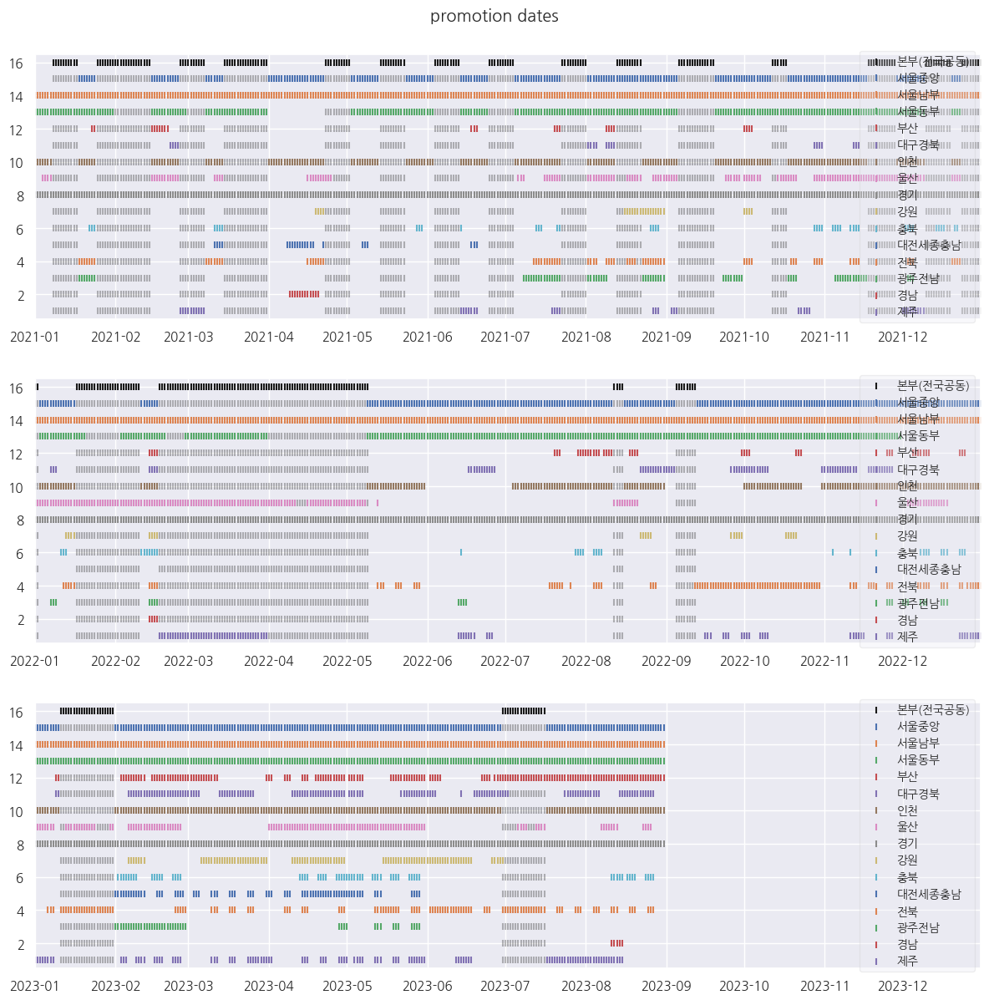

In [8]:
fig, axs = plt.subplots(3, 1, figsize=(12, 12.2))
fig.suptitle("promotion dates")

for i, ax in enumerate(axs):
    for j, region in enumerate(promotion_dates_df.columns):
        region_promotion = promotion_dates_df[region]
        ax.scatter(region_promotion.index, promotion_dates_df["본부(전국공동)"].values * (len(regions) - j), alpha=0.3,
                   c="k", marker="|")
        ax.scatter(region_promotion.index, region_promotion.values * (len(regions) - j), label=region,
                   c="k" if region == "본부(전국공동)" else None, marker="|")
    ax.legend(loc=5, fontsize=10, framealpha=0.3, )
    ax.set_xlim([date(2021 + i, 1, 1), date(2021 + i, 12, 31)])
    ax.set_ylim([0.5, len(regions) + 0.5])
plt.tight_layout()
plt.show()

In [9]:
# 프로모션 + 전체데이터 통합
daily_bd_promo_df = daily_bd_df.copy()
daily_bd_promo_df = daily_bd_promo_df[(daily_bd_promo_df["date"] > min(promotion_dates_df.index)) & (
            daily_bd_promo_df["date"] < max(promotion_dates_df.index))]

daily_bd_promo_df["promotion"] = daily_bd_promo_df.apply(lambda row: (
            (promotion_dates_df.loc[row["date"].strftime("%Y-%m-%d"), row["region"]]) | (
    promotion_dates_df.loc[row["date"].strftime("%Y-%m-%d"), "본부(전국공동)"])), axis=1)

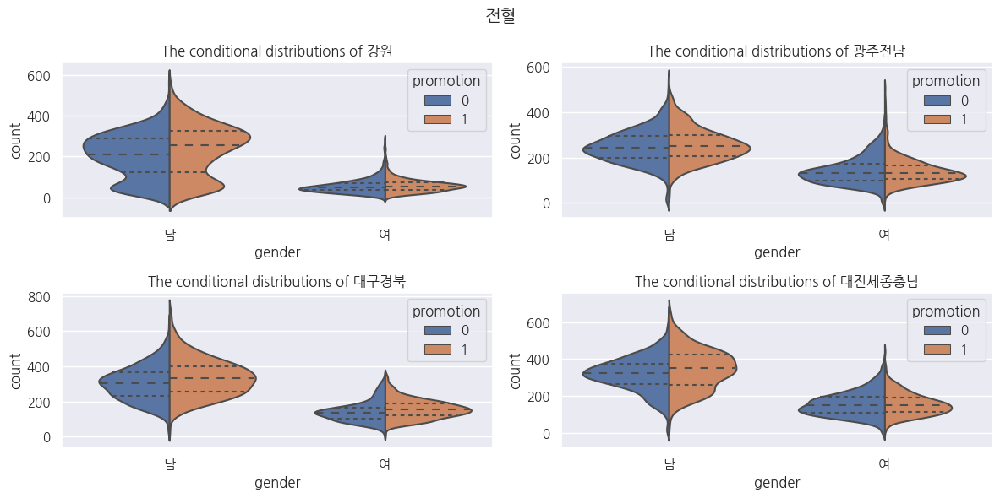

In [10]:
# promotion, 성별/헌혈종류/지역 조건부로 분포비교
region_list = ["강원", "광주전남", "대구경북", "대전세종충남"]
fig, axs = plt.subplots(2, 2, figsize=(12, 6))
fig.suptitle("전혈")

for i, region in enumerate(region_list):
    ax = axs.flatten()[i]
    region_promo_groupby = daily_bd_promo_df[(daily_bd_promo_df["region"] == region) & (
                (daily_bd_promo_df["method"] == "전혈 320ml") | (daily_bd_promo_df["method"] == "전혈 400ml"))].groupby(
        by=["date", "gender"]).agg({"count": "sum", "promotion": "sum"}).reset_index()

    region_promo_groupby["promotion"] = region_promo_groupby["promotion"].apply(lambda row: min(1, row))

    sns.violinplot(x="gender", y="count", hue="promotion", data=region_promo_groupby, split=True,
                   inner="quart", scale="count", ax=ax)

    ax.set_title(f"The conditional distributions of {region}")

plt.tight_layout()
plt.show()

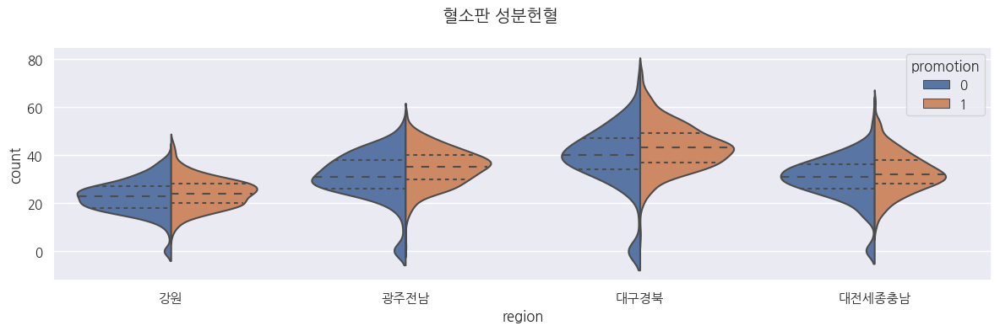

In [11]:
# promotion, 성별/헌혈종류/지역 조건부로 분포비교
region_list = ["강원", "광주전남", "대구경북", "대전세종충남"]
fig, ax = plt.subplots(figsize=(12, 4))
fig.suptitle("혈소판 성분헌혈")

region_promo_groupby = daily_bd_promo_df[
    (daily_bd_promo_df["method"] == "혈소판") | (daily_bd_promo_df["method"] == "다종성분")].groupby(
    by=["date", "region"]).agg({"count": "sum", "promotion": "sum"}).reset_index()

region_promo_groupby["promotion"] = region_promo_groupby["promotion"].apply(lambda row: min(1, row))
region_promo_groupby = region_promo_groupby[region_promo_groupby["region"].isin(region_list)]

region_promo_groupby["region"] = region_promo_groupby["region"].cat.remove_unused_categories()

sns.violinplot(x="region", y="count", hue="promotion", data=region_promo_groupby, split=True,
               inner="quart", scale="count", ax=ax)

plt.tight_layout()
plt.show()

In [12]:
promotion_bd_list = []
for region in promotion_dates_df.columns[1:]:
    promo_bd_group = daily_bd_df[daily_bd_df["region"] == region].groupby(by=["date", "method"])[
        "count"].sum().reset_index() \
        .pivot(index="date", columns="method", values="count").fillna(0)
    promo_bd_group = promo_bd_group[
        promo_bd_group.index.slice_indexer(min(promotion_dates_df.index), max(promotion_dates_df.index))]

    promotion_mask = promotion_dates_df["본부(전국공동)"].astype(bool) | promotion_dates_df[region].astype(bool)
    data_temp_dict = {"count": (promo_bd_group["전혈 320ml"] + promo_bd_group["전혈 400ml"]).values,
                      "region": [region] * len(promo_bd_group),
                      "promotion": promotion_mask.reindex(promo_bd_group.index),
                      }

    promotion_bd_temp_df = pd.DataFrame(index=promo_bd_group.index, data=data_temp_dict)
    promotion_bd_list.append(promotion_bd_temp_df)
promotion_bd_df = pd.concat(promotion_bd_list)

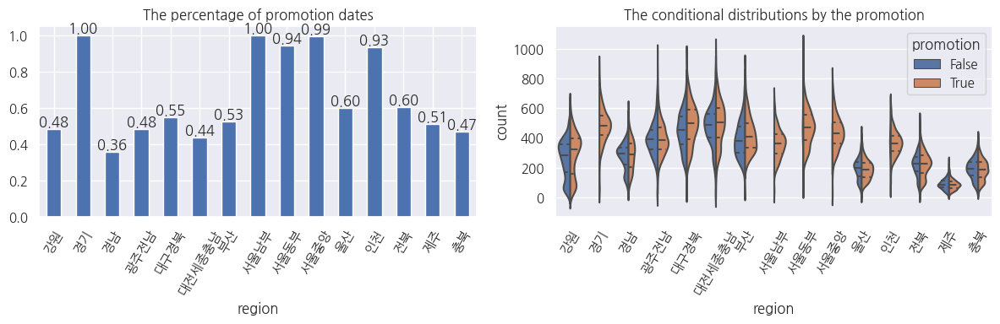

In [13]:
_, axs = plt.subplots(1, 2, figsize=(12, 4))

promotion_ratio_by_region = promotion_bd_df.groupby(by=["region"])["promotion"].mean().sort_index()
promotion_ratio_by_region.plot.bar(title="The percentage of promotion dates", ax=axs[0])
axs[0].bar_label(axs[0].containers[0], fmt="%.2f")
axs[0].set_xticklabels(axs[0].get_xticklabels(), rotation=60)

sns.violinplot(x="region", y="count", hue="promotion", data=promotion_bd_df.sort_values("region"), split=True,
               inner="quart", scale="count", ax=axs[1])
axs[1].set_title("The conditional distributions by the promotion")
axs[1].set_xticklabels(axs[1].get_xticklabels(), rotation=60)

plt.tight_layout()
plt.show()

C:\Users\dgkim\AppData\Local\Temp\ipykernel_14744\732874904.py:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=60)


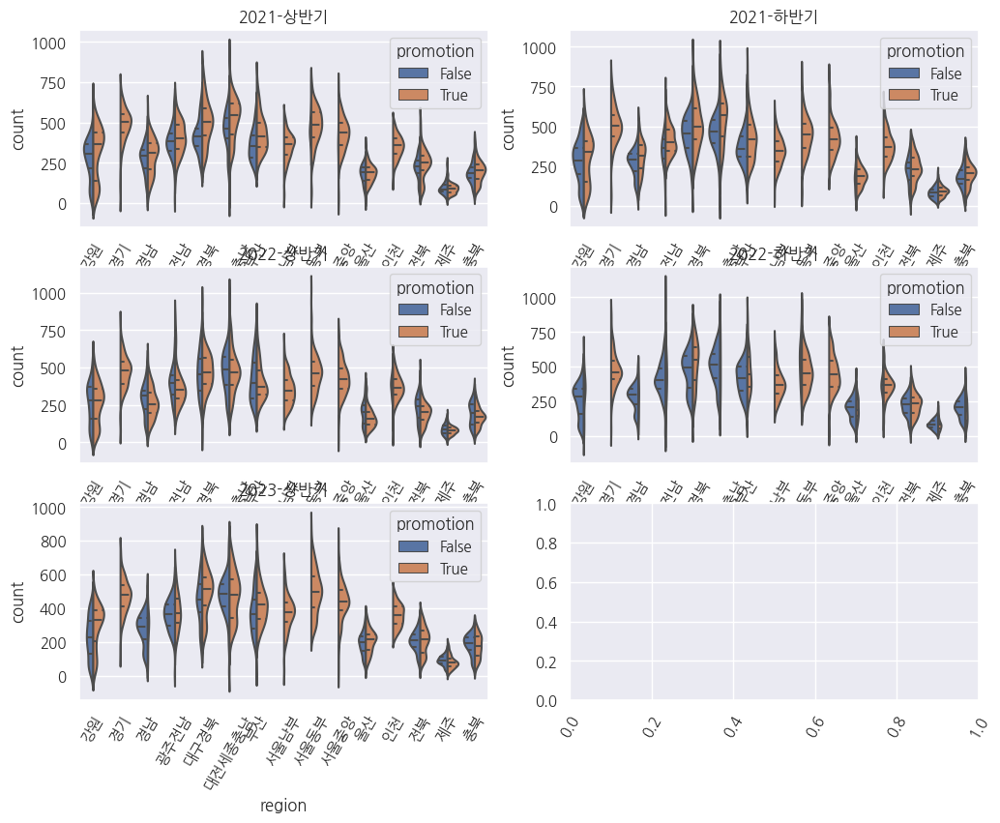

In [14]:
_, axs = plt.subplots(3, 2, figsize=(12, 9))

sns.violinplot(x="region", y="count", hue="promotion",
               data=promotion_bd_df.sort_values("region")["2021-01-01":"2021-06-30"], split=True, inner="quart",
               scale="count", ax=axs[0][0])
axs[0][0].set_title("2021-상반기")

sns.violinplot(x="region", y="count", hue="promotion",
               data=promotion_bd_df.sort_values("region")["2021-07-01":"2021-12-31"], split=True, inner="quart",
               scale="count", ax=axs[0][1])
axs[0][1].set_title("2021-하반기")

sns.violinplot(x="region", y="count", hue="promotion",
               data=promotion_bd_df.sort_values("region")["2022-01-01":"2022-06-30"], split=True, inner="quart",
               scale="count", ax=axs[1][0])
axs[1][0].set_title("2022-상반기")

sns.violinplot(x="region", y="count", hue="promotion",
               data=promotion_bd_df.sort_values("region")["2022-07-01":"2022-12-31"], split=True, inner="quart",
               scale="count", ax=axs[1][1])
axs[1][1].set_title("2022-하반기")

sns.violinplot(x="region", y="count", hue="promotion",
               data=promotion_bd_df.sort_values("region")["2023-01-01":"2023-06-30"], split=True, inner="quart",
               scale="count", ax=axs[2][0])
axs[2][0].set_title("2023-상반기")

for ax in axs.flatten():
    ax.set_xticklabels(ax.get_xticklabels(), rotation=60)

# Blood donor data EDA

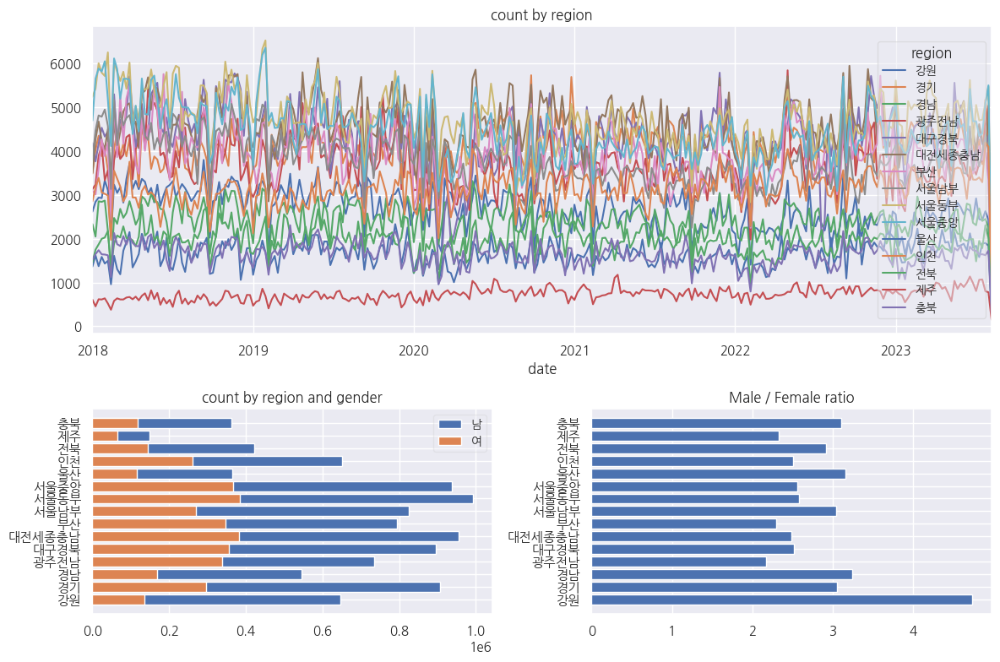

In [15]:
fig = plt.figure(figsize=(12, 8))
gs = gridspec.GridSpec(nrows=2, ncols=2, height_ratios=[1.5, 1])

ax = fig.add_subplot(gs[0, :])
bd_group = daily_bd_df.groupby(by=["date", "region"])["count"].sum().unstack().resample('W').sum()
bd_group.plot.line(title="count by region", ax=ax)
ax.legend(title='region', loc=5, fontsize=10, framealpha=0.5)

ax = fig.add_subplot(gs[1, 0])
bd_group = daily_bd_df.groupby(by=["region", "gender"])["count"].sum().unstack()
ax.barh(bd_group["남"].index, bd_group["남"], label="남")
ax.barh(bd_group["여"].index, bd_group["여"], label="여")
ax.set_title("count by region and gender")
ax.legend(loc=1, fontsize=10, framealpha=0.3)

ax = fig.add_subplot(gs[1, 1])
ax.barh(bd_group.index, (bd_group["남"].values / bd_group["여"].values))
ax.set_title("Male / Female ratio")

plt.tight_layout()
plt.show()

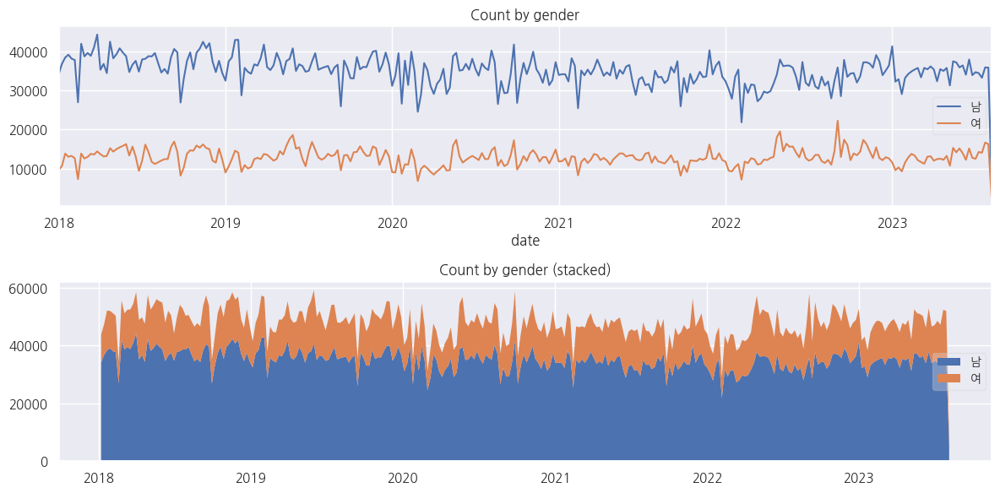

In [16]:
_, axs = plt.subplots(2, 1, figsize=(12, 6))

bd_gender_group = daily_bd_df.groupby(by=["date", "gender"])["count"].sum().unstack().resample('W').sum()
bd_gender_group.plot.line(title="Count by gender", ax=axs[0])

axs[1].stackplot(bd_gender_group.index, bd_gender_group["남"], bd_gender_group["여"], labels=["남", "여"], edgecolor="none")
axs[1].set_title("Count by gender (stacked)")

for ax in axs:
    ax.legend(loc=5, fontsize=10, framealpha=0.3)

plt.tight_layout()
plt.show()

In [17]:
# promotion 기간용, 지역별
promo_start_date = '2021-01-01'
promo_end_date = '2023-07-31'
promo_complete_date_range = pd.date_range(start=promo_start_date, end=promo_end_date, freq='D')

region_missing_dates_dict = dict()  # 지역별 missing dates

daily_bd_promo_df.groupby(by=["region", "date"])["count"].sum()

for region in daily_bd_promo_df["region"].unique():
    region_missing_dates_dict[region] = pd.Series(index=promo_complete_date_range, data=0, name="missing")

    day_off_series = ~promo_complete_date_range.isin(daily_bd_promo_df[daily_bd_promo_df["region"] == region]["date"])
    missing_dates = promo_complete_date_range[day_off_series]
    region_missing_dates_dict[region][day_off_series] = 1
    print(f"the number of missing dates in {region}: {len(missing_dates)}")
    print(missing_dates)

the number of missing dates in 강원: 13
DatetimeIndex(['2021-01-01', '2021-02-11', '2021-02-12', '2021-05-05',
               '2021-09-20', '2021-09-21', '2022-01-31', '2022-02-01',
               '2022-09-09', '2022-09-10', '2023-01-21', '2023-01-22',
               '2023-01-23'],
              dtype='datetime64[ns]', freq=None)
the number of missing dates in 경기: 28
DatetimeIndex(['2021-01-01', '2021-02-11', '2021-02-12', '2021-05-05',
               '2021-08-16', '2021-09-20', '2021-09-21', '2021-10-04',
               '2021-10-27', '2021-12-25', '2022-01-01', '2022-01-31',
               '2022-02-01', '2022-03-29', '2022-06-01', '2022-06-29',
               '2022-09-09', '2022-09-10', '2022-09-29', '2022-11-10',
               '2022-12-25', '2023-01-01', '2023-01-21', '2023-01-22',
               '2023-04-04', '2023-04-27', '2023-05-05', '2023-06-29'],
              dtype='datetime64[ns]', freq=None)
the number of missing dates in 경남: 22
DatetimeIndex(['2021-01-01', '2021-02-12', '202

In [18]:
bd_group = daily_bd_df.groupby(by=["date", "method"])["count"].sum().unstack()
bd_group = bd_group["전혈 400ml"]

for year in bd_group.index.year.unique():
    print(f"{year}: {len(bd_group[bd_group.index.year == year])}")
# 설, 추석 당일 쉼. 2020은 윤년 + 추석 안 쉼

start_date = '2018-01-01'
end_date = '2023-07-31'

complete_date_range = pd.date_range(start=start_date, end=end_date, freq='D')
day_off_series = ~complete_date_range.isin(bd_group.index.values)
missing_dates = complete_date_range[day_off_series]

print(f"the number of missing dates: {len(missing_dates)}")
print(missing_dates)

bd_group = bd_group.reindex(complete_date_range).fillna(0)

2018: 362
2019: 360
2020: 360
2021: 360
2022: 359
2023: 207
the number of missing dates: 30
DatetimeIndex(['2018-02-15', '2018-02-16', '2018-09-24', '2019-01-01',
               '2019-02-04', '2019-02-05', '2019-09-12', '2019-09-13',
               '2020-01-01', '2020-01-24', '2020-01-25', '2020-04-15',
               '2020-05-01', '2020-10-01', '2021-01-01', '2021-02-11',
               '2021-02-12', '2021-09-20', '2021-09-21', '2022-01-01',
               '2022-01-31', '2022-02-01', '2022-09-09', '2022-09-10',
               '2022-12-25', '2023-01-01', '2023-01-21', '2023-01-22',
               '2023-02-27', '2023-05-01'],
              dtype='datetime64[ns]', freq=None)


# Get holiday data

In [19]:
from sklearn.preprocessing import OneHotEncoder

ohe = OneHotEncoder(sparse_output=False)

dow = bd_group.index.dayofweek  # 0: mon
dow_oh = ohe.fit_transform(np.expand_dims(dow, axis=1))

missing_dates = np.expand_dims(day_off_series.astype(int), axis=1)

In [20]:
from dotenv import load_dotenv
import os

load_dotenv()

key = os.getenv("WEATHER_API_KEY")

holiday_list = []
for year in tqdm(range(2018, 2024)):
    url = 'http://apis.data.go.kr/B090041/openapi/service/SpcdeInfoService/getRestDeInfo?' \
          '_type=json&numOfRows=50&' \
          'solYear=' + str(year) + '&ServiceKey=' + str(key)
    response = requests.get(url)
    if response.status_code == 200:
        holiday_list += response.json()["response"]["body"]["items"]["item"]

holiday_index = pd.Series([str(date["locdate"]) for date in holiday_list], dtype="datetime64[ns]")
holiday_sereis = pd.Series(1, index=holiday_index, dtype="int")
holiday_sereis = holiday_sereis.reindex(bd_group.index).fillna(0)
holiday = np.expand_dims(holiday_sereis, axis=1)

100%|██████████| 6/6 [00:01<00:00,  3.95it/s]


In [21]:
# promotion 기간용 요일/휴일 dummy
promo_holiday_sereis = holiday_sereis[promo_start_date: promo_end_date]
promo_dow_oh = ohe.fit_transform(np.expand_dims(promo_complete_date_range.dayofweek, axis=1))

promo_dow_holiday_df = pd.DataFrame(
    np.concatenate([promo_dow_oh, np.expand_dims(promo_holiday_sereis, axis=1)], axis=1),
    columns=["mon", "tue", "wed", "thu", "fri", "sat", "sun", "holiday"],
    index=promo_complete_date_range)
display(promo_dow_holiday_df)

,mon,tue,wed,thu,fri,sat,sun,holiday
2021-01-01,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2021-01-02,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2021-01-03,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2021-01-04,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-01-05,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
2023-07-27,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2023-07-28,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2023-07-29,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2023-07-30,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


# 프로모션 + bd 통합 데이터

In [22]:
# 일반 프로모션 (연)

# 남/여 비교
region_list = ["강원", "경남", "광주전남", "대구경북", "대전세종충남", "부산", "울산", "전북", "제주", "충북"]

region_promo_dict_list = []

for region in tqdm(region_list):
    region_promo_groupby = daily_bd_promo_df[(daily_bd_promo_df["region"] == region) & (
                (daily_bd_promo_df["method"] == "전혈 320ml") | (daily_bd_promo_df["method"] == "전혈 400ml"))].groupby(
        by=["date", "gender"]).agg({"count": "sum", "promotion": "sum"}).reset_index()

    region_promo_groupby["promotion"] = region_promo_groupby["promotion"].apply(lambda row: min(1, row))

    for gender in ["남", "여"]:
        for year in range(2021, 2023 + 1):
            region_promo_temp = region_promo_groupby[region_promo_groupby["gender"] == gender]

            region_promo_y = pd.Series(data=region_promo_temp["count"].values, index=region_promo_temp["date"]) \
                .reindex(promo_complete_date_range).fillna(0)

            region_promo = pd.Series(data=region_promo_temp["promotion"].values, index=region_promo_temp["date"],
                                     name="promotion") \
                .reindex(promo_complete_date_range).fillna(0)

            region_promo_X = pd.concat([promo_dow_holiday_df, region_missing_dates_dict[region], region_promo], axis=1)

            region_promo_y = region_promo_y.loc[f"{year}":f"{year}"]
            region_promo_X = region_promo_X.loc[f"{year}":f"{year}"]

            region_promo_model = sm.OLS(region_promo_y, region_promo_X).fit()
            # print(region_promo_model.summary())
            weekday_mean = np.mean(region_promo_model.params.values[:5])
            promo_effect = region_promo_model.params.values[9] / weekday_mean
            region_promo_dict_list.append({
                "region": region,
                "gender": gender,
                "coef": promo_effect,
                "p_val": region_promo_model.pvalues[9],
                "year": f"{year}",
                "promo_ratio": np.mean(region_promo_X["promotion"]),
                "dates_count": len(region_promo_X)
            })

region_promo_df = pd.DataFrame(region_promo_dict_list)
region_promo_df.to_csv("./output/promo_region_gender_year.csv", encoding="utf8", index=False)
region_promo_df

100%|██████████| 10/10 [00:00<00:00, 32.78it/s]


,region,gender,coef,p_val,year,promo_ratio,dates_count
0,강원,남,0.151596,3.726438e-07,2021,0.498630,365
1,강원,남,0.082868,2.870228e-03,2022,0.380822,365
2,강원,남,0.139171,2.397584e-04,2023,0.603774,212
3,강원,여,0.131811,2.061518e-04,2021,0.498630,365
4,강원,여,-0.042754,4.086886e-01,2022,0.380822,365
5,강원,여,0.094218,8.666586e-02,2023,0.603774,212
6,경남,남,0.161824,3.576572e-07,2021,0.479452,365
7,경남,남,-0.022176,5.003893e-01,2022,0.326027,365
8,경남,남,0.010570,8.177795e-01,2023,0.169811,212
9,경남,여,0.058350,9.639519e-02,2021,0.479452,365


In [23]:
# 일반 프로모션 (분기)

# 남/여 비교
region_list = ["강원", "경남", "광주전남", "대구경북", "대전세종충남", "부산", "울산", "전북", "제주", "충북"]

quarter_dates = [
    ("1-1", "3-31"),
    ("4-1", "6-30"),
    ("7-1", "9-30"),
    ("10-1", "12-31")
]

region_promo_dict_list = []

for region in tqdm(region_list):
    region_promo_groupby = daily_bd_promo_df[(daily_bd_promo_df["region"] == region) & (
                (daily_bd_promo_df["method"] == "전혈 320ml") | (daily_bd_promo_df["method"] == "전혈 400ml"))].groupby(
        by=["date", "gender"]).agg({"count": "sum", "promotion": "sum"}).reset_index()

    region_promo_groupby["promotion"] = region_promo_groupby["promotion"].apply(lambda row: min(1, row))

    for gender in ["남", "여"]:
        for year in range(2021, 2023 + 1):
            for (quarter, (quarter_start, quarter_end)) in enumerate(quarter_dates, start=1):
                if year == 2023 and quarter > 2:
                    continue
                # print(f"{year}Q{quarter}", f"{year}-{quarter_start}", f"{year}-{quarter_end}")

                region_promo_temp = region_promo_groupby[region_promo_groupby["gender"] == gender]

                region_promo_y = pd.Series(data=region_promo_temp["count"].values, index=region_promo_temp["date"]) \
                    .reindex(promo_complete_date_range).fillna(0)

                region_promo = pd.Series(data=region_promo_temp["promotion"].values, index=region_promo_temp["date"],
                                         name="promotion") \
                    .reindex(promo_complete_date_range).fillna(0)

                region_promo_X = pd.concat([promo_dow_holiday_df, region_missing_dates_dict[region], region_promo],
                                           axis=1)

                region_promo_y = region_promo_y.loc[f"{year}-{quarter_start}":f"{year}-{quarter_end}"]
                region_promo_X = region_promo_X.loc[f"{year}-{quarter_start}":f"{year}-{quarter_end}"]

                region_promo_model = sm.OLS(region_promo_y, region_promo_X).fit()
                # print(region_promo_model.summary())
                weekday_mean = np.mean(region_promo_model.params.values[:5])
                promo_effect = region_promo_model.params.values[9] / weekday_mean
                region_promo_dict_list.append({
                    "region": region,
                    "gender": gender,
                    "coef": promo_effect,
                    "p_val": region_promo_model.pvalues[9],
                    "year": year,
                    "quarter": quarter,
                    "promo_ratio": np.mean(region_promo_X["promotion"])
                })

region_promo_df = pd.DataFrame(region_promo_dict_list)
region_promo_df.to_csv("./output/promo_region_gender_quarter.csv", encoding="utf8", index=False)
region_promo_df

100%|██████████| 10/10 [00:00<00:00, 12.81it/s]


,region,gender,coef,p_val,year,quarter,promo_ratio
0,강원,남,0.202985,0.000213,2021,1,0.622222
1,강원,남,0.141405,0.008620,2021,2,0.439560
2,강원,남,0.166101,0.024683,2021,3,0.510870
3,강원,남,0.038955,0.495470,2021,4,0.423913
4,강원,남,0.408304,0.000160,2022,1,0.833333
...,...,...,...,...,...,...,...
195,충북,여,0.110054,0.177842,2022,2,0.439560
196,충북,여,-0.002280,0.987592,2022,3,0.195652
197,충북,여,0.044669,0.721269,2022,4,0.130435
198,충북,여,-0.000430,0.995247,2023,1,0.400000


In [24]:
# 수도권 외 지역 특수 프로모션 효과 확인

# period_start ~ period_end (프로모션 기간) vs 기간 앞뒤 2주 비교
region_special_promo_dict_list = []

region_list = ["강원", "경남", "광주전남", "대구경북", "대전세종충남", "부산", "울산", "전북", "제주", "충북"]

for region in tqdm(region_list):
    region_special_promo = special_promotions_df[special_promotions_df["institution"] == region]
    region_special_promo = region_special_promo[region_special_promo["period_days"] < 100]

    for _, row in region_special_promo.iterrows():
        # special promo dates dummy
        special_promo_dates = pd.Series(index=promo_complete_date_range, data=0, name="special_promo")
        special_promo_dates.loc[row["period_start"]:row["period_end"]] = 1

        # special promo control dates dummy
        special_promo_control_dates = pd.Series(index=promo_complete_date_range, data=0, name="special_promo_control")
        control_start = max(row['period_start'] - timedelta(days=14), datetime(2021, 1, 1))
        control_end = min(row['period_end'] + timedelta(days=14), datetime(2023, 7, 31))
        special_promo_control_dates.loc[control_start:row["period_start"] - timedelta(days=1)] = 1
        special_promo_control_dates.loc[row["period_end"] + timedelta(days=1):control_end] = 1

        # print(f"promo_period: {row['period_start'].strftime('%Y-%m-%d')} ~ {row['period_end'].strftime('%Y-%m-%d')}")
        # print(f"control_period: {control_start.strftime('%Y-%m-%d')} ~ {(row['period_start']-timedelta(days=1)).strftime('%Y-%m-%d')} & {(row['period_end']+timedelta(days=1)).strftime('%Y-%m-%d')} ~ {control_end.strftime('%Y-%m-%d')}")

        region_promo_groupby = daily_bd_promo_df[(daily_bd_promo_df["region"] == region) & (
                    (daily_bd_promo_df["method"] == "전혈 320ml") | (daily_bd_promo_df["method"] == "전혈 400ml"))].groupby(
            by=["date", "gender"]).agg({"count": "sum", "promotion": "sum"}).reset_index()

        for gender in ["남", "여"]:
            region_promo_groupby["promotion"] = region_promo_groupby["promotion"].apply(lambda row: min(1, row))

            region_promo_temp = region_promo_groupby[region_promo_groupby["gender"] == gender]

            region_promo_y = pd.Series(data=region_promo_temp["count"].values, index=region_promo_temp["date"]) \
                .reindex(promo_complete_date_range).fillna(0)

            region_promo = pd.Series(data=region_promo_temp["promotion"].values, index=region_promo_temp["date"],
                                     name="promotion") \
                .reindex(promo_complete_date_range).fillna(0)

            region_promo_X = pd.concat(
                [promo_dow_holiday_df, region_missing_dates_dict[region], region_promo, special_promo_dates,
                 special_promo_control_dates], axis=1)

            region_promo_model = sm.OLS(region_promo_y, region_promo_X).fit()
            # print(region_promo_model.summary())

            weekday_mean = np.mean(region_promo_model.params.values[:5])
            promo_effect = region_promo_model.params.values[9] / weekday_mean
            special_promo_effect = region_promo_model.params.values[10] / weekday_mean
            special_promo_control_effect = region_promo_model.params.values[11] / weekday_mean

            region_special_promo_dict_list.append({
                "promo_name": row["title"],
                "promo_url": row["url"],
                "promo_hits": row["hits"],
                "region": region,
                "gender": gender,
                "special_promo_coef": special_promo_effect,
                "special_promo_p_val": region_promo_model.pvalues[10],
                "special_promo_control_coef": special_promo_control_effect,
                "special_promo_control_p_val": region_promo_model.pvalues[11],
                "special_promo_dates": sum(special_promo_dates),
                "special_promo_control_dates": sum(special_promo_control_dates)
            })

region_special_promo_df = pd.DataFrame(region_special_promo_dict_list)
region_special_promo_df.to_csv("./output/region_special_promo.csv", encoding="utf8", index=False)
region_special_promo_df

100%|██████████| 10/10 [00:01<00:00,  9.43it/s]


,promo_name,promo_url,promo_hits,region,gender,special_promo_coef,special_promo_p_val,special_promo_control_coef,special_promo_control_p_val,special_promo_dates,special_promo_control_dates
0,[강원혈액원] 강원대학교와 함께하는 1004 캠페인,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,2181,강원,남,0.024225,6.237946e-01,-0.019455,7.110443e-01,33,28
1,[강원혈액원] 강원대학교와 함께하는 1004 캠페인,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,2181,강원,여,0.110676,1.487183e-01,0.040423,6.197067e-01,33,28
2,레드커넥트 예약헌혈 프로모션,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,20742,강원,남,-0.030501,3.271717e-01,-0.054994,2.919899e-01,92,28
3,레드커넥트 예약헌혈 프로모션,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,20742,강원,여,0.006370,8.958027e-01,-0.011863,8.843247e-01,92,28
4,헌혈하고? 문화행사 즐기자!,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,16838,강원,남,-0.020024,5.570893e-01,-0.095896,6.724600e-02,70,28
...,...,...,...,...,...,...,...,...,...,...,...
129,헌혈자의 날(6.14) 기념행사 및 영화 관람,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,14284,충북,여,0.302078,5.754529e-04,0.209019,8.866402e-03,23,28
130,헌혈하고 대청호로 드라이브 갈까,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,7215,충북,남,0.101424,1.046060e-01,0.002650,9.634842e-01,24,28
131,헌혈하고 대청호로 드라이브 갈까,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,7215,충북,여,0.410395,9.208744e-07,0.433057,2.463413e-08,24,28
132,2021년 충북혈액원 중장년층대상 문화이벤트,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,7525,충북,남,0.012335,8.278761e-01,-0.067841,2.408291e-01,29,28


In [25]:
# 수도권 지역 특수 프로모션 효과 확인
# period_start ~ period_end (프로모션 기간) vs 기간 앞뒤 2주 비교
region_special_promo_dict_list = []

metro_region_list = ["경기", "서울남부", "서울동부", "서울중앙", "인천"]

for region in tqdm(metro_region_list):
    region_special_promo = special_promotions_df[special_promotions_df["institution"] == region]
    region_special_promo = region_special_promo[region_special_promo["period_days"] < 100]

    for _, row in region_special_promo.iterrows():
        # special promo dates dummy
        special_promo_dates = pd.Series(index=promo_complete_date_range, data=0, name="special_promo")
        special_promo_dates.loc[row["period_start"]:row["period_end"]] = 1

        # special promo control dates dummy
        special_promo_control_dates = pd.Series(index=promo_complete_date_range, data=0, name="special_promo_control")
        control_start = max(row['period_start'] - timedelta(days=14), datetime(2021, 1, 1))
        control_end = min(row['period_end'] + timedelta(days=14), datetime(2023, 7, 31))
        special_promo_control_dates.loc[control_start:row["period_start"] - timedelta(days=1)] = 1
        special_promo_control_dates.loc[row["period_end"] + timedelta(days=1):control_end] = 1

        # print(f"promo_period: {row['period_start'].strftime('%Y-%m-%d')} ~ {row['period_end'].strftime('%Y-%m-%d')}")
        # print(f"control_period: {control_start.strftime('%Y-%m-%d')} ~ {(row['period_start']-timedelta(days=1)).strftime('%Y-%m-%d')} & {(row['period_end']+timedelta(days=1)).strftime('%Y-%m-%d')} ~ {control_end.strftime('%Y-%m-%d')}")

        region_promo_groupby = daily_bd_promo_df[(daily_bd_promo_df["region"] == region) & (
                    (daily_bd_promo_df["method"] == "전혈 320ml") | (daily_bd_promo_df["method"] == "전혈 400ml"))].groupby(
            by=["date", "gender"]).agg({"count": "sum", "promotion": "sum"}).reset_index()

        for gender in ["남", "여"]:
            region_promo_groupby["promotion"] = region_promo_groupby["promotion"].apply(lambda row: min(1, row))

            region_promo_temp = region_promo_groupby[region_promo_groupby["gender"] == gender]

            region_promo_y = pd.Series(data=region_promo_temp["count"].values, index=region_promo_temp["date"]) \
                .reindex(promo_complete_date_range).fillna(0)

            # region_promo = pd.Series(data=region_promo_temp["promotion"].values, index=region_promo_temp["date"], name="promotion")\
            #     .reindex(promo_complete_date_range).fillna(0)

            region_promo_X = pd.concat([promo_dow_holiday_df, region_missing_dates_dict[region], special_promo_dates,
                                        special_promo_control_dates], axis=1)

            region_promo_model = sm.OLS(region_promo_y, region_promo_X).fit()
            # print(region_promo_model.summary())

            weekday_mean = np.mean(region_promo_model.params.values[:5])
            special_promo_effect = region_promo_model.params.values[9] / weekday_mean
            special_promo_control_effect = region_promo_model.params.values[10] / weekday_mean

            region_special_promo_dict_list.append({
                "promo_name": row["title"],
                "promo_url": row["url"],
                "promo_hits": row["hits"],
                "region": region,
                "gender": gender,
                "special_promo_coef": special_promo_effect,
                "special_promo_p_val": region_promo_model.pvalues[9],
                "special_promo_control_coef": special_promo_control_effect,
                "special_promo_control_p_val": region_promo_model.pvalues[10],
                "special_promo_dates": sum(special_promo_dates),
                "special_promo_control_dates": sum(special_promo_control_dates)
            })

region_special_promo_df = pd.DataFrame(region_special_promo_dict_list)
region_special_promo_df.to_csv("./output/region_special_promo_metro.csv", encoding="utf8", index=False)
region_special_promo_df

100%|██████████| 5/5 [00:00<00:00,  5.15it/s]


,promo_name,promo_url,promo_hits,region,gender,special_promo_coef,special_promo_p_val,special_promo_control_coef,special_promo_control_p_val,special_promo_dates,special_promo_control_dates
0,(경기혈액원)6.14헌혈자의 날 기념 프로모션,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,3928,경기,남,0.073857,0.449284,-0.049739,0.182742,4,28
1,(경기혈액원)6.14헌혈자의 날 기념 프로모션,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,3928,경기,여,0.091748,0.437380,-0.139959,0.001992,4,28
2,[경기혈액원] 2023년 헌혈자의 날(6.14)기념 헌혈자 초청 프로모션( KT위즈...,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,12354,경기,남,0.087527,0.076625,-0.039847,0.286210,16,28
3,[경기혈액원] 2023년 헌혈자의 날(6.14)기념 헌혈자 초청 프로모션( KT위즈...,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,12354,경기,여,0.017848,0.766132,-0.094865,0.036790,16,28
4,경기혈액원 중장년 문화행사 서울스카이 겨울풀코스,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,15754,경기,남,-0.012584,0.645295,0.038080,0.310279,54,28
...,...,...,...,...,...,...,...,...,...,...,...
135,[인천혈액원] 성년의날 기념 프로모션,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,1495,인천,여,0.474436,0.083243,-0.011423,0.827495,1,28
136,[인천혈액원] 10대 헌혈 응원 프로모션,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,2713,인천,남,0.058413,0.207398,0.025674,0.542666,23,28
137,[인천혈액원] 10대 헌혈 응원 프로모션,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,2713,인천,여,0.039399,0.494793,-0.021836,0.677713,23,28
138,인천혈액원 중장년층 문화행사,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,8927,인천,남,0.078978,0.060418,-0.044493,0.289020,28,28


In [26]:
# 전국 특별 프로모션

region_special_promo_dict_list = []

region_list_dict = {
    "non_metro": region_list,
    "metro": metro_region_list
}

region_special_promo = special_promotions_df[special_promotions_df["institution"] == "혈액관리본부"]
region_special_promo = region_special_promo[region_special_promo["period_days"] < 100]

for _, row in tqdm(region_special_promo.iterrows()):
    # special promo dates dummy
    special_promo_dates = pd.Series(index=promo_complete_date_range, data=0, name="special_promo")
    special_promo_dates.loc[row["period_start"]:row["period_end"]] = 1

    # special promo control dates dummy
    special_promo_control_dates = pd.Series(index=promo_complete_date_range, data=0, name="special_promo_control")
    control_start = max(row['period_start'] - timedelta(days=14), datetime(2021, 1, 1))
    control_end = min(row['period_end'] + timedelta(days=14), datetime(2023, 7, 31))
    special_promo_control_dates.loc[control_start:row["period_start"] - timedelta(days=1)] = 1
    special_promo_control_dates.loc[row["period_end"] + timedelta(days=1):control_end] = 1

    for region_cat, region_list_temp in region_list_dict.items():
        for region in region_list_temp:
            region_promo_groupby = daily_bd_promo_df[(daily_bd_promo_df["region"] == region) & (
                        (daily_bd_promo_df["method"] == "전혈 320ml") | (
                            daily_bd_promo_df["method"] == "전혈 400ml"))].groupby(by=["date", "gender"]).agg(
                {"count": "sum", "promotion": "sum"}).reset_index()

            for gender in ["남", "여"]:
                region_promo_groupby["promotion"] = region_promo_groupby["promotion"].apply(lambda row: min(1, row))

                region_promo_temp = region_promo_groupby[region_promo_groupby["gender"] == gender]

                region_promo_y = pd.Series(data=region_promo_temp["count"].values, index=region_promo_temp["date"]) \
                    .reindex(promo_complete_date_range).fillna(0)

                if region_cat == "non_metro":
                    region_promo = pd.Series(data=region_promo_temp["promotion"].values,
                                             index=region_promo_temp["date"], name="promotion") \
                        .reindex(promo_complete_date_range).fillna(0)

                    concat_list = [promo_dow_holiday_df, region_missing_dates_dict[region], region_promo,
                                   special_promo_dates, special_promo_control_dates]
                else:
                    concat_list = [promo_dow_holiday_df, region_missing_dates_dict[region], special_promo_dates,
                                   special_promo_control_dates]

                region_promo_X = pd.concat(concat_list, axis=1)

                region_promo_model = sm.OLS(region_promo_y, region_promo_X).fit()
                # print(region_promo_model.summary())

                weekday_mean = np.mean(region_promo_model.params.values[:5])
                special_promo_effect = region_promo_model.params.values[-2] / weekday_mean
                special_promo_control_effect = region_promo_model.params.values[-1] / weekday_mean

                region_special_promo_dict_list.append({
                    "promo_name": row["title"],
                    "promo_url": row["url"],
                    "promo_hits": row["hits"],
                    "region": region,
                    "gender": gender,
                    "special_promo_coef": special_promo_effect,
                    "special_promo_p_val": region_promo_model.pvalues[-2],
                    "special_promo_control_coef": special_promo_control_effect,
                    "special_promo_control_p_val": region_promo_model.pvalues[-1],
                    "special_promo_dates": sum(special_promo_dates),
                    "special_promo_control_dates": sum(special_promo_control_dates)
                })

region_special_promo_df = pd.DataFrame(region_special_promo_dict_list)
region_special_promo_df.to_csv("./output/region_special_promo_country.csv", encoding="utf8", index=False)
region_special_promo_df

104it [00:22,  4.67it/s]


,promo_name,promo_url,promo_hits,region,gender,special_promo_coef,special_promo_p_val,special_promo_control_coef,special_promo_control_p_val,special_promo_dates,special_promo_control_dates
0,ABO Friends 대상 6월 라섹 수술이벤트,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,8129,강원,남,0.024785,0.674631,-0.081618,0.126265,22,28
1,ABO Friends 대상 6월 라섹 수술이벤트,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,8129,강원,여,-0.018631,0.838328,0.139315,0.091578,22,28
2,ABO Friends 대상 6월 라섹 수술이벤트,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,8129,경남,남,0.005450,0.929416,0.041502,0.446764,22,28
3,ABO Friends 대상 6월 라섹 수술이벤트,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,8129,경남,여,-0.059226,0.442128,0.086612,0.204891,22,28
4,ABO Friends 대상 6월 라섹 수술이벤트,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,8129,광주전남,남,-0.038545,0.448053,-0.017637,0.694660,22,28
...,...,...,...,...,...,...,...,...,...,...,...
3115,넥센타이어와 함께하는 봄맞이 생명안전 프로모션,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,35326,서울동부,여,-0.095464,0.010938,-0.058888,0.277808,61,28
3116,넥센타이어와 함께하는 봄맞이 생명안전 프로모션,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,35326,서울중앙,남,-0.011814,0.694856,0.033508,0.442546,61,28
3117,넥센타이어와 함께하는 봄맞이 생명안전 프로모션,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,35326,서울중앙,여,-0.105199,0.004779,0.068805,0.201958,61,28
3118,넥센타이어와 함께하는 봄맞이 생명안전 프로모션,https://www.bloodinfo.net/knrcbs/pr/promtn/pro...,35326,인천,남,-0.011346,0.694480,-0.070072,0.094334,61,28


In [27]:
# 혈소판 성분헌혈
region_list = ["강원", "경남", "광주전남", "대구경북", "대전세종충남", "부산", "울산", "전북", "제주", "충북"]
platelet_promo_effectiveness = []

region_promo_groupby = daily_bd_promo_df[
    (daily_bd_promo_df["method"] == "다종성분") | (daily_bd_promo_df["method"] == "혈소판")].groupby(
    by=["date", "region"]).agg({"count": "sum", "promotion": "sum"}).reset_index()

region_promo_groupby["promotion"] = region_promo_groupby["promotion"].apply(lambda row: min(1, row))

for region in region_list:
    region_promo_temp = region_promo_groupby[region_promo_groupby["region"] == region]

    region_promo_y = pd.Series(data=region_promo_temp["count"].values, index=region_promo_temp["date"]) \
        .reindex(promo_complete_date_range).fillna(0)

    region_promo = pd.Series(data=region_promo_temp["promotion"].values, index=region_promo_temp["date"],
                             name="promotion") \
        .reindex(promo_complete_date_range).fillna(0)

    region_promo_X = pd.concat([promo_dow_holiday_df, region_missing_dates_dict[region], region_promo], axis=1)

    region_promo_model = sm.OLS(region_promo_y, region_promo_X).fit()
    # print(region_promo_model.summary())
    weekday_mean = np.mean(region_promo_model.params.values[:5])
    promo_effect = region_promo_model.params.values[9] / weekday_mean

    print(f"{region} effectiveness: {promo_effect:.1%}, pval: {region_promo_model.pvalues[9]:.2f}")
    platelet_promo_effectiveness.append(promo_effect)

강원 effectiveness: 5.4%, pval: 0.00
경남 effectiveness: 10.4%, pval: 0.00
광주전남 effectiveness: 6.8%, pval: 0.00
대구경북 effectiveness: 8.2%, pval: 0.00
대전세종충남 effectiveness: 1.9%, pval: 0.24
부산 effectiveness: 4.3%, pval: 0.00
울산 effectiveness: -2.1%, pval: 0.32
전북 effectiveness: 14.5%, pval: 0.00
제주 effectiveness: 5.2%, pval: 0.05
충북 effectiveness: 11.5%, pval: 0.00


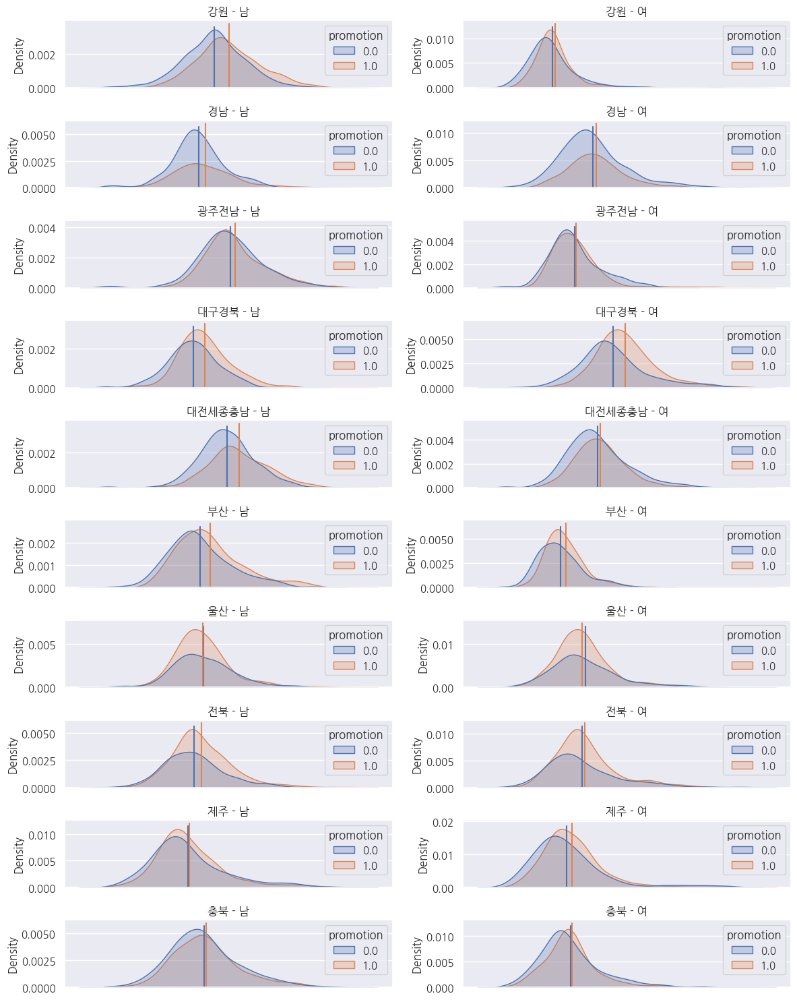

In [50]:
# 분포 비교

# 남/여 비교
region_list = ["강원", "경남", "광주전남", "대구경북", "대전세종충남", "부산", "울산", "전북", "제주", "충북"]

_, axs = plt.subplots(10, 2, figsize=(12, 15))

for i, region in enumerate(region_list):
    region_promo_groupby = daily_bd_promo_df[(daily_bd_promo_df["region"] == region) & (
                (daily_bd_promo_df["method"] == "전혈 320ml") | (daily_bd_promo_df["method"] == "전혈 400ml"))].groupby(
        by=["date", "gender"]).agg({"count": "sum", "promotion": "sum"}).reset_index()

    region_promo_groupby["promotion"] = region_promo_groupby["promotion"].apply(lambda row: min(1, row))

    for j, gender in enumerate(["남", "여"]):
        region_promo_temp = region_promo_groupby[region_promo_groupby["gender"] == gender]

        region_promo_y = pd.Series(data=region_promo_temp["count"].values, index=region_promo_temp["date"]) \
            .reindex(promo_complete_date_range).fillna(0)

        region_promo = pd.Series(data=region_promo_temp["promotion"].values, index=region_promo_temp["date"],
                                 name="promotion") \
            .reindex(promo_complete_date_range).fillna(0)

        region_promo_X = pd.concat([promo_dow_holiday_df, region_missing_dates_dict[region]], axis=1)

        region_promo_model = sm.OLS(region_promo_y, region_promo_X).fit()
        resid = region_promo_y - region_promo_model.predict(region_promo_X)
        resid_with_promo = pd.concat([resid, region_promo], axis=1)

        sns.kdeplot(resid_with_promo, x=0, hue="promotion", fill=True, ax=axs[i][j])

        mean = np.mean(resid[region_promo == 0])
        axs[i][j].plot([mean, mean], [0, axs[i][j].get_ylim()[1]], color="C0")
        mean = np.mean(resid[region_promo == 1])
        axs[i][j].plot([mean, mean], [0, axs[i][j].get_ylim()[1]], color="C1")

        axs[i][j].set_title(f"{region} - {gender}")
        axs[i][j].set_xticks([])
        axs[i][j].set_xlabel("")

plt.tight_layout()
plt.show()

# Blood Donor data

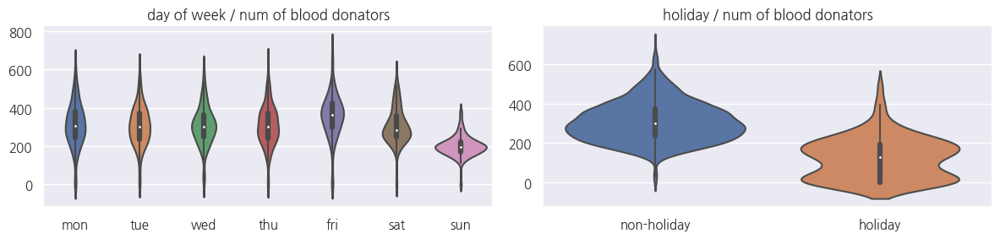

In [51]:
_, axs = plt.subplots(1, 2, figsize=(12, 3))

sns.violinplot(x=dow.values, y=bd_group.values, ax=axs[0], fit_reg=False)
axs[0].set_title("day of week / num of blood donators")
axs[0].set_xticklabels(["mon", "tue", "wed", "thu", "fri", "sat", "sun"])

sns.violinplot(x=holiday_sereis.values, y=bd_group.values, ax=axs[1], fit_reg=False)
axs[1].set_title("holiday / num of blood donators")
axs[1].set_xticklabels(["non-holiday", "holiday"])

plt.tight_layout()
plt.show()

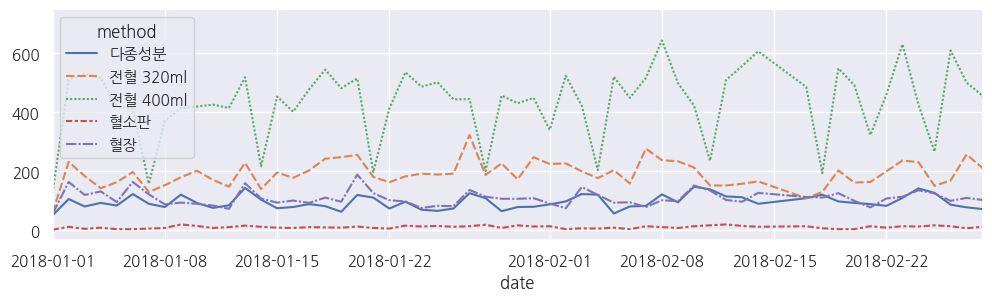

In [52]:
# 방법별로 구간 정해서 time-sereis plot
# 320ml & 남/녀, 400ml & 남/녀, 다종성분 & 남/녀, 혈소판 & 남/녀, 혈장 & 남/녀
# 남 & 320ml/400ml, 여 & 320ml/400ml
_, ax = plt.subplots(1, 1, figsize=(12, 3))

temp = daily_bd_df[daily_bd_df["region"] == "서울동부"].groupby(by=["date", "method"])["count"].sum().unstack()
sns.lineplot(data=temp, ax=ax)
ax.set_xlim([date(2018, 1, 1), date(2018, 2, 28)])
plt.show()

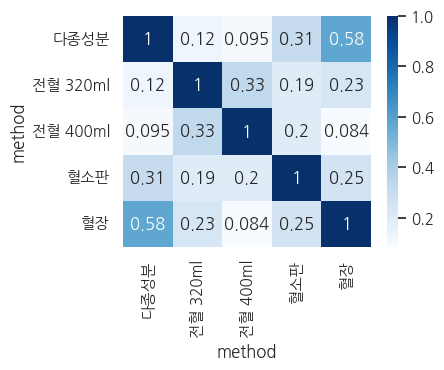

In [53]:
_, ax = plt.subplots(1, 1, figsize=(4, 3))
temp = daily_bd_df[daily_bd_df["region"] == "서울동부"].groupby(by=["date", "method"])["count"].sum().unstack()

sns.heatmap(temp.corr(), cmap="Blues", annot=True, ax=ax)
plt.show()
# 혈장/다종성분(혈소판 혈장) 간 corr.
# 전혈 400/320ml간 corr

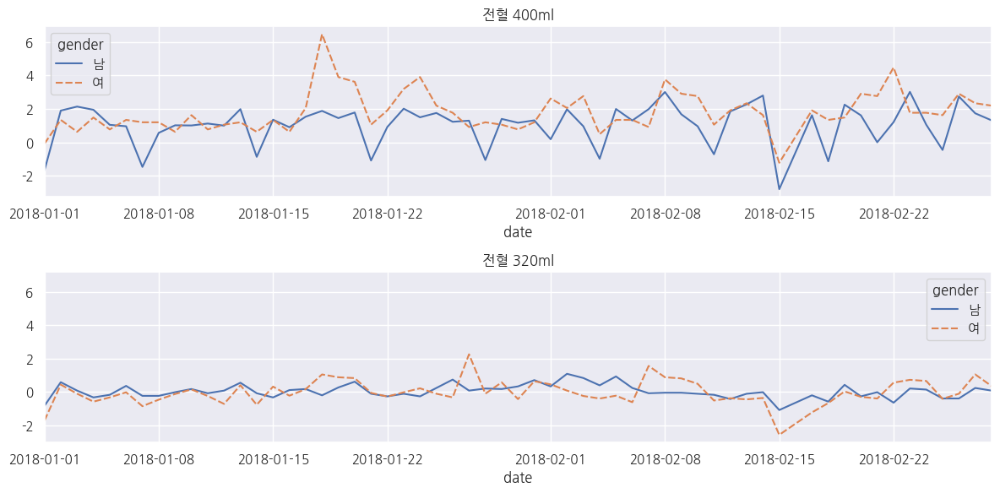

In [54]:
_, axs = plt.subplots(2, 1, figsize=(12, 6))

temp = daily_bd_df.groupby(by=["date", "region", "gender", "method"])["count"].sum() \
    .xs("서울동부", level="region").xs("전혈 400ml", level="method").reset_index() \
    .pivot(index="date", columns="gender", values="count")
mu, std = temp.mean(), temp.std()
sns.lineplot(data=(temp - mu) / std, ax=axs[0])
axs[0].set_title("전혈 400ml")
axs[0].set_xlim([date(2018, 1, 1), date(2018, 2, 28)])

temp = daily_bd_df.groupby(by=["date", "region", "gender", "method"])["count"].sum() \
    .xs("서울동부", level="region").xs("전혈 320ml", level="method").reset_index() \
    .pivot(index="date", columns="gender", values="count")
mu, std = temp.mean(), temp.std()
sns.lineplot(data=(temp - mu) / std, ax=axs[1])
axs[1].set_title("전혈 320ml")
axs[1].set_xlim([date(2018, 1, 1), date(2018, 2, 28)])

plt.tight_layout()
plt.show()

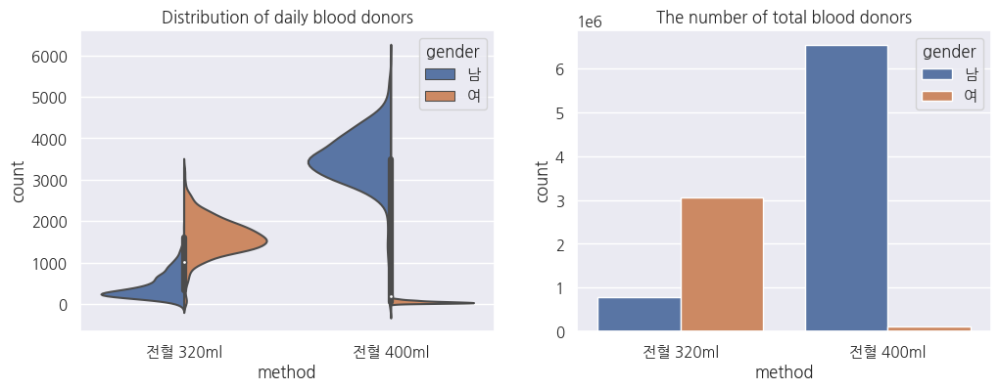

In [55]:
_, axs = plt.subplots(1, 2, figsize=(12, 4))

temp = daily_bd_df.groupby(by=["date", "gender", "method"])["count"].sum().reset_index()
temp = temp[temp["method"].isin(["전혈 400ml", "전혈 320ml"])]
temp["method"] = temp["method"].cat.remove_unused_categories()
temp = temp[temp["date"].dt.dayofweek < 5]
sns.violinplot(x="method", y="count", hue="gender", data=temp, ax=axs[0], scale="count", split=True)
axs[0].set_title("Distribution of daily blood donors")

temp = daily_bd_df.groupby(by=["gender", "method"])["count"].sum().reset_index()
temp = temp[temp["method"].isin(["전혈 400ml", "전혈 320ml"])]
temp["method"] = temp["method"].cat.remove_unused_categories()
sns.barplot(x="method", y="count", hue="gender", data=temp, ax=axs[1])
axs[1].set_title("The number of total blood donors")
plt.show()

Text(0.5, 1.0, '전혈|성별,요일')

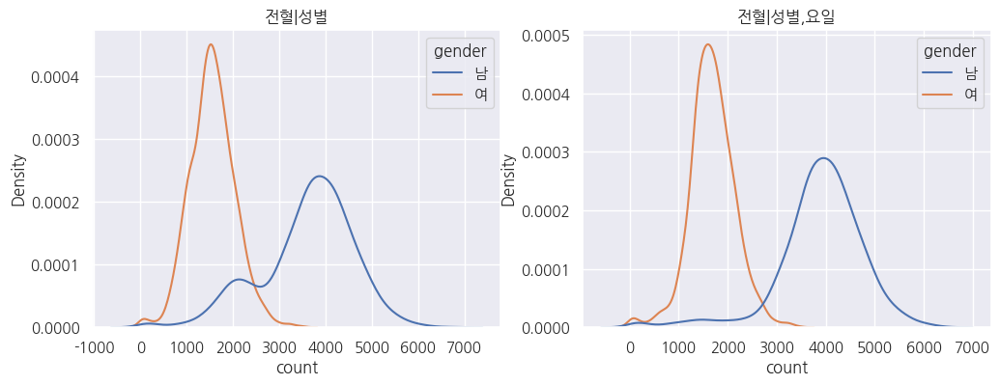

In [98]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

temp = daily_bd_df[daily_bd_df["method"].isin(["전혈 400ml", "전혈 320ml"])].groupby(by=["date", "gender"])[
    "count"].sum().reset_index()
sns.kdeplot(x="count", hue="gender", data=temp, ax=axs[0])
axs[0].set_title("전혈|성별")

temp = temp[temp["date"].dt.dayofweek < 5]  # 평일만
sns.kdeplot(x="count", hue="gender", data=temp, ax=axs[1])
axs[1].set_title("전혈|성별,요일")

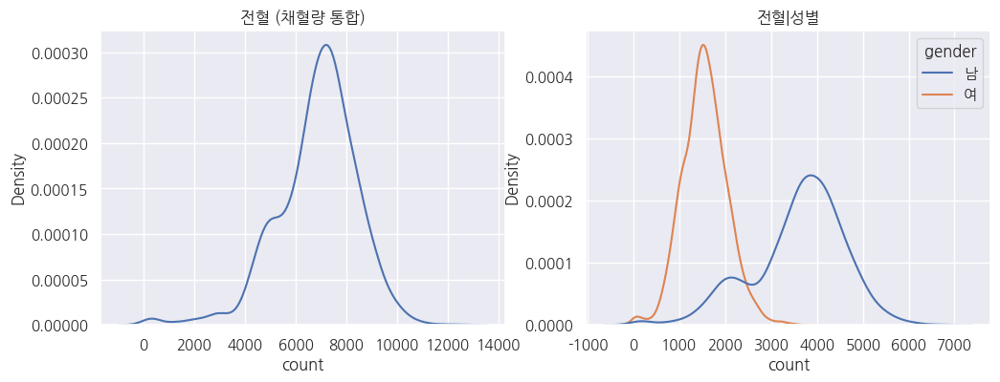

In [93]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

temp = daily_bd_df.groupby(by=["date"])["count"].sum().reset_index()
sns.kdeplot(x="count", data=temp, ax=axs[0])
axs[0].set_title("전혈 (채혈량 통합)")

temp = daily_bd_df[daily_bd_df["method"].isin(["전혈 400ml", "전혈 320ml"])].groupby(by=["date", "gender"])[
    "count"].sum().reset_index()
sns.kdeplot(x="count", hue="gender", data=temp, ax=axs[1])
axs[1].set_title("전혈|성별")

plt.show()

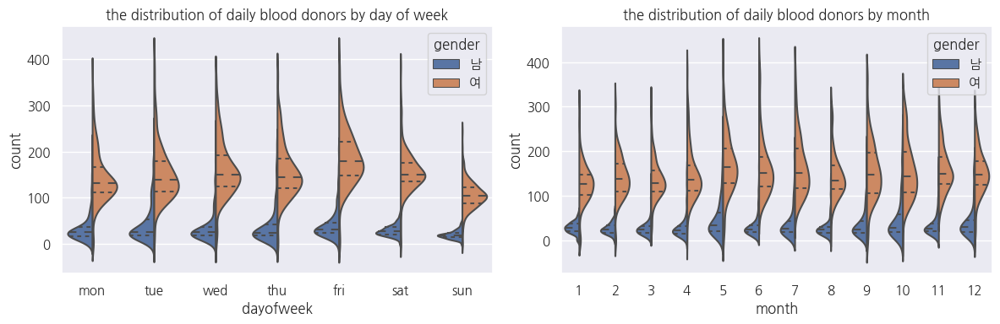

In [57]:
from statsmodels.graphics.tsaplots import month_plot

bd_seoul_count_df = pd.DataFrame({"count": bd_group, "dayofweek": dow, "holiday": holiday_sereis})

_, axs = plt.subplots(1, 2, figsize=(12, 4))

temp = daily_bd_df.groupby(by=["date", "region", "gender", "method"])["count"].sum() \
    .xs("서울동부", level="region").xs("전혈 320ml", level="method").reset_index()
temp["dayofweek"] = temp["date"].dt.dayofweek
temp["month"] = temp["date"].dt.month
sns.violinplot(x="dayofweek", y="count", hue="gender", data=temp, scale="count", split=True, ax=axs[0],
               inner="quartile")
axs[0].set_xticklabels(["mon", "tue", "wed", "thu", "fri", "sat", "sun"])
axs[0].set_title("the distribution of daily blood donors by day of week")

sns.violinplot(x="month", y="count", hue="gender", data=temp, scale="count", split=True, ax=axs[1],
               inner="quartile")
axs[1].set_title("the distribution of daily blood donors by month")
# month_plot(x=bd_seoul_count_df["count"].values, dates=bd_seoul_count_df.index, ax=axs[1])

plt.tight_layout()
plt.show()

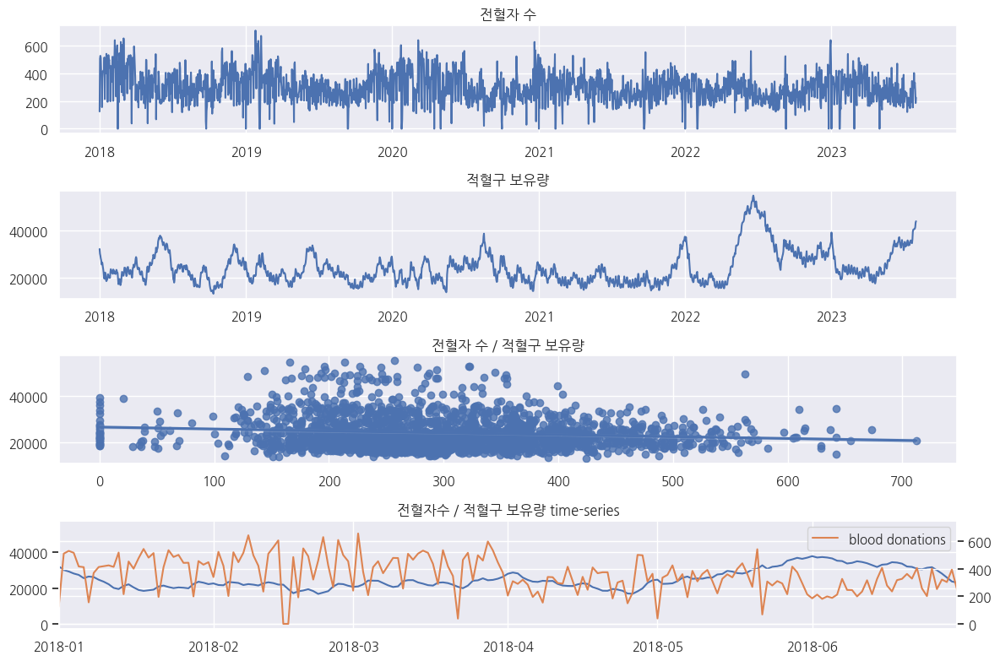

corr between bd and bs: -0.12584167319923328


In [58]:
_, axs = plt.subplots(4, 1, figsize=(12, 8))

bd_group_diff = bd_group.diff()[1:]
axs[0].plot(bd_group)
axs[0].set_title("전혈자 수")

bs_group = daily_bs_df[daily_bs_df["product"] == "적혈구"].groupby(by=["date"])["count"].sum()
bs_group_diff = bs_group.diff().reindex(pd.date_range(start="2017-12-31", end="2023-07-31", freq='D'))[:-1].fillna(0)
axs[1].plot(bs_group)
axs[1].set_title("적혈구 보유량")

sns.regplot(x=bd_group.values, y=bs_group.values, ax=axs[2])
axs[2].set_title("전혈자 수 / 적혈구 보유량")

axs[3].plot(bs_group.reindex(pd.date_range(start="2017-12-31", end="2023-07-31", freq='D'))[:-1].fillna(0),
            label="blood stock")
ax = axs[3].twinx()
# ax.plot(bd_group.resample('3d').mean(), color="C1", label="blood donations")
ax.plot(bd_group, color="C1", label="blood donations")
ax.legend()
ax.set_xlim([date(2018, 1, 1), date(2018, 6, 30)])
ax.set_title("전혈자수 / 적혈구 보유량 time-series")

plt.tight_layout()
plt.show()

corr = np.corrcoef(np.array([bd_group.values, bs_group.values]))[0, 1]
print(f"corr between bd and bs: {corr}")

# Blood Stock Data

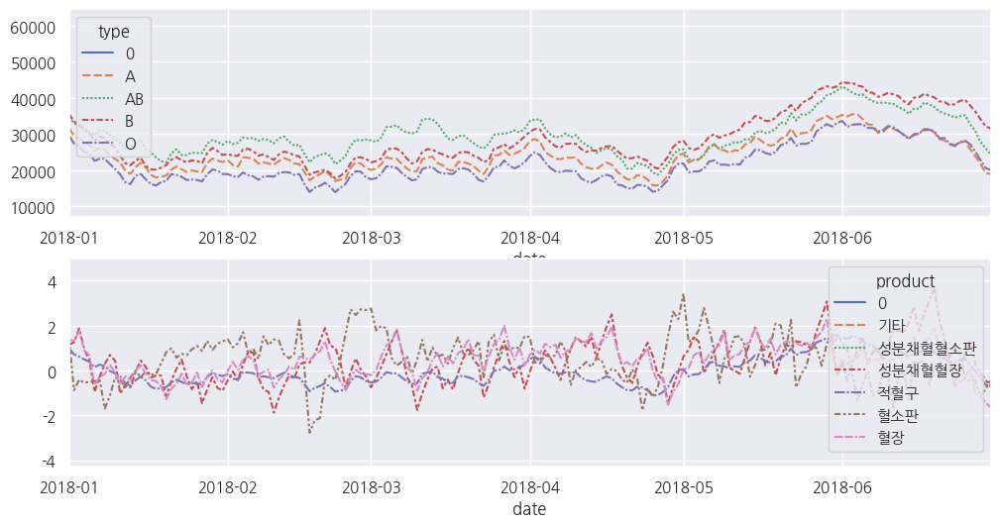

In [59]:
_, axs = plt.subplots(2, 1, figsize=(12, 6))

bs_group = daily_bs_df[daily_bs_df["product"] == "적혈구"][["type", "count"]] \
    .pivot(columns="type", values="count")

bs_group["A"] = bs_group["A"] / 0.33
bs_group["AB"] = bs_group["AB"] / 0.12
bs_group["B"] = bs_group["B"] / 0.27
bs_group["O"] = bs_group["O"] / 0.27
sns.lineplot(data=bs_group, ax=axs[0])

bs_group = daily_bs_df[daily_bs_df["type"] == "A"][["product", "count"]] \
    .pivot(columns="product", values="count")[["적혈구", "혈소판", "혈장", "성분채혈혈장"]]
mu, std = bs_group.mean(), bs_group.std()
sns.lineplot(data=(bs_group - mu) / std, ax=axs[1])

for ax in axs:
    ax.set_xlim([date(2018, 1, 1), date(2018, 6, 30)])
plt.show()

# Blood usage data

일간사용량/보유량변화 corr: -0.4668


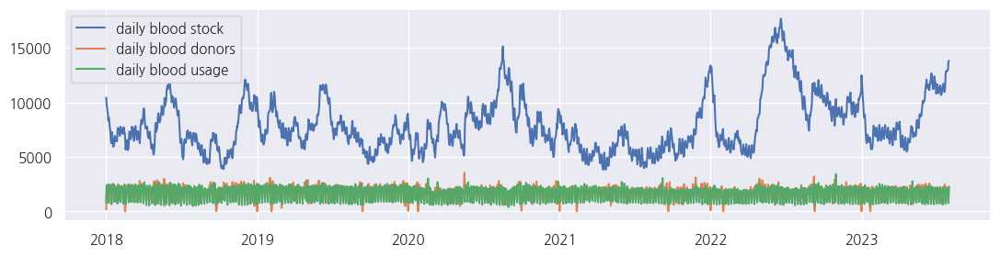

In [60]:
# 일별 적혈구 사용량
_, ax = plt.subplots(1, 1, figsize=(13, 3))
bs_temp = daily_bs_df[(daily_bs_df["product"] == "적혈구") & (daily_bs_df["type"] == "A")]["count"]
bu_temp = daily_bu_df["A"]
bd_temp = daily_bd_df[
    (daily_bd_df["type"] == "A") & ((daily_bd_df["method"] == "전혈 320ml") | (daily_bd_df["method"] == "전혈 400ml"))] \
    .groupby(by="date")["count"].sum().reindex(complete_date_range).fillna(0)
ax.plot(bs_temp, label="daily blood stock")
ax.plot(bd_temp, label="daily blood donors")
ax.plot(bu_temp, label="daily blood usage")
plt.legend()
plt.plot()

bs_diff_bu_corr = np.corrcoef(bs_temp.diff(1)[1:], bu_temp[1:])[0, 1]
print(f"일간사용량/보유량변화 corr: {bs_diff_bu_corr:.4f}")

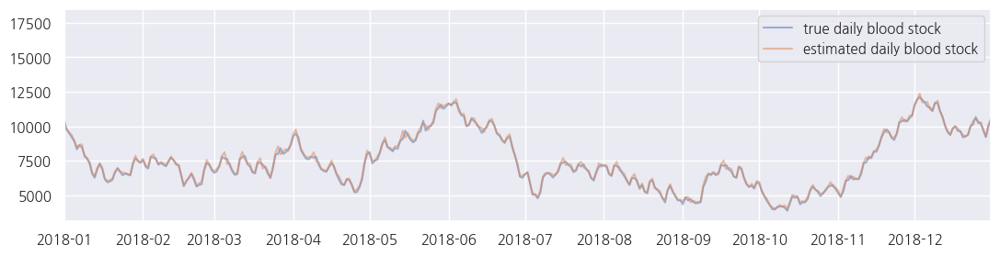

The correlation between the true blood stock and estimated blood stock: 0.9993


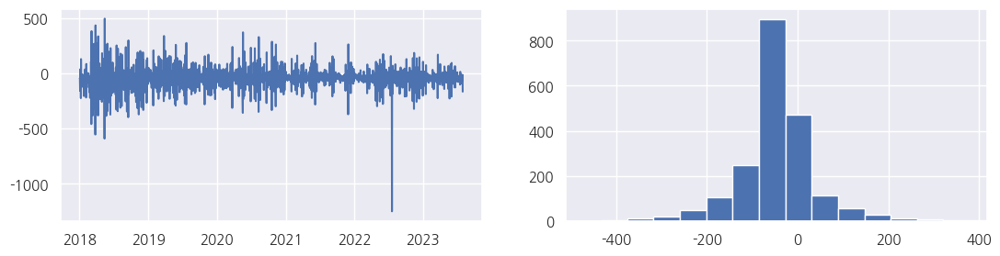

median of resid -46.0, std of resid: 92.96177199446215


In [61]:
# 보유량_t = 보유량_{t-1} - 사용량_{t-1} + 헌혈자수_{t-1}: 가설 test.
_, ax = plt.subplots(1, 1, figsize=(13, 3))
ax.plot(bs_temp, label="true daily blood stock", alpha=0.5)

bs_est = bs_temp - bu_temp + bd_temp
bs_est = pd.Series(index=bs_est.index[1:], data=bs_est.values[:-1])
ax.plot(bs_est, label="estimated daily blood stock", alpha=0.5)

ax.set_xlim([date(2018, 1, 1), date(2018, 12, 31)])
plt.legend()
plt.show()

corr_true_est = np.corrcoef(bs_temp[1:], bs_est)[0, 1]
print(f"The correlation between the true blood stock and estimated blood stock: {corr_true_est:.4f}")
resid = bs_temp[1:] - bs_est
med_res, std_res = np.median(resid), np.std(resid)

_, axs = plt.subplots(1, 2, figsize=(13, 3))
axs[0].plot(resid)
axs[1].hist(resid, bins=30)
axs[1].set_xlim([med_res - 5 * std_res, med_res + 5 * std_res])
plt.show()
print(f"median of resid {med_res}, std of resid: {std_res}")

~ 2020
mean of the number of daily blood donors: 1840.58
mean of the number of daily blood usage: 1789.11
difference between blood donors and usage: 51.47

2020 ~
mean of the number of daily blood donors: 1713.31
mean of the number of daily blood usage: 1665.97
difference between blood donors and usage: 47.34

전체 기간
mean of the number of daily blood donors: 1759.78
mean of the number of daily blood usage: 1710.56
difference between blood donors and usage: 49.22

In [26]:
# 연도별로 별하는 오차보정값, 계산방법은? (true blood stock과의 차이, 잔차?)

mean of the number of daily blood donors: 1759.78
mean of the number of daily blood usage: 1710.56
difference between blood donors and usage: 49.22


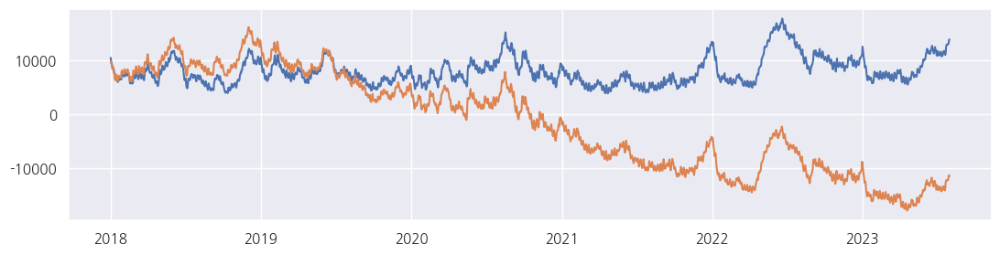

In [27]:
# 이전 기간동안의 bs의 daily diff의 평균이 bd - bu의 평균과 같아지도록? 연도별로 regime shift가 있나?
print(f"mean of the number of daily blood donors: {np.mean(bd_temp):.02f}")
print(f"mean of the number of daily blood usage: {np.mean(bu_temp):.02f}")
print(f"difference between blood donors and usage: {np.mean(bd_temp - bu_temp):.02f}")

_, ax = plt.subplots(1, 1, figsize=(13, 3))
ax.plot(bs_temp)
ax.plot(bs_temp[0] + (bd_temp - 60 - bu_temp).cumsum())

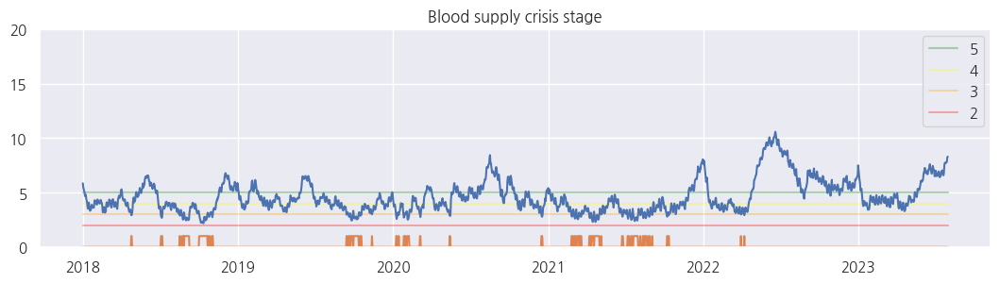

In [131]:
_, ax = plt.subplots(1, 1, figsize=(13, 3))

target_year = None

for i, c_name in zip(range(5, 1, -1), ["green", "yellow", "orange", "red"]):
    ax.plot([min(bs_temp.index), max(bs_temp.index)], [i, i], c=c_name, label=i, alpha=0.3)

blood_temp_df = pd.concat([bs_temp.rename("stock"), bu_temp.rename("usage")], axis=1)
blood_temp_df["dayofweek"] = blood_temp_df.index.dayofweek

year_usage_mean_df = blood_temp_df["usage"].groupby(lambda x: x.year).mean().to_dict()
previous_year_usage_mean_series = blood_temp_df.index.year.to_series().apply(
    lambda x: year_usage_mean_df[max(2018, x - 1)])
bd_crisis_status = blood_temp_df["stock"] / previous_year_usage_mean_series.values

# ax.plot(blood_temp_df["stock"] / blood_temp_df["usage"], label="stock/usage", alpha=0.5)
ax.plot(bd_crisis_status)
plt.plot(bd_crisis_status < 3)
if target_year:
    ax.set_xlim([date(target_year, 1, 1), date(target_year, 12, 31)])
ax.set_ylim([0, 20])
ax.legend()
ax.set_title("Blood supply crisis stage")
plt.show()

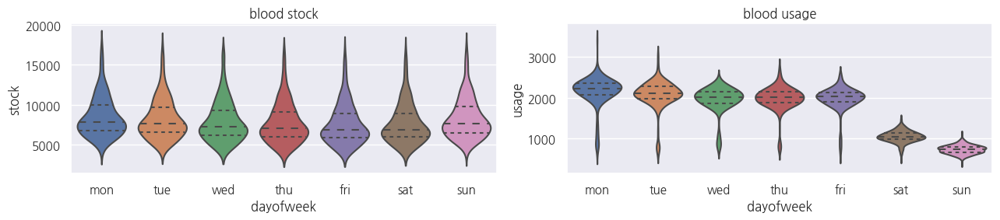

In [29]:
_, axs = plt.subplots(1, 2, figsize=(13, 3))
sns.violinplot(x="dayofweek", y="stock", data=blood_temp_df, scale="count", split=True, inner="quartile", ax=axs[0])
sns.violinplot(x="dayofweek", y="usage", data=blood_temp_df, scale="count", split=True, inner="quartile", ax=axs[1])
axs[0].set_title("blood stock")
axs[1].set_title("blood usage")

for ax in axs:
    ax.set_xticklabels(["mon", "tue", "wed", "thu", "fri", "sat", "sun"])

plt.tight_layout()
plt.show()

# Model Fitting

In [30]:
def draw_acf_pacf(data_dict: dict):
    _, axs = plt.subplots(len(data_dict), 3, figsize=(12, 3 * len(data_dict)))
    axs = axs.reshape((-1, 3))
    for ((key, data), ax_row) in zip(data_dict.items(), axs):
        ax_row[0].plot(data)
        ax_row[0].set_title(key)
        sgt.plot_acf(data, lags=40, zero=False, ax=ax_row[1])
        sgt.plot_pacf(data, lags=40, zero=False, ax=ax_row[2])
        ax_row[1].set_ylim([-0.5, 0.5])
        ax_row[2].set_ylim([-0.5, 0.5])
    plt.tight_layout()
    plt.show()


def make_fourier_terms(t, period, k):
    fourier_terms = []
    for i in range(1, k + 1):
        times = np.arange(t) + 1
        np.arange(k) + 1
        fourier_terms.append(np.sin(2 * i * np.pi * times / period))
        fourier_terms.append(np.cos(2 * i * np.pi * times / period))
    return np.array(fourier_terms).T

In [31]:
def arima_model(y_train, y_test, X_train, X_test, summary=False, plot=True, test_stats=True, arima_order=(1, 0, 3),
                target_year=2018):
    model = ARIMA(y_train, order=arima_order, seasonal_order=(1, 0, 1, 7), exog=X_train, trend="n")
    model.initialize_approximate_diffuse()
    model_fit = model.fit()

    if summary:
        print(model_fit.summary())

    if test_stats:
        print(f"AIC: {model_fit.aic}")

        y_train_predict = model_fit.predict().clip(lower=0)
        y_test_predict = model_fit.forecast(steps=len(y_test), exog=X_test).clip(lower=0)
        train_rmse = sm.tools.eval_measures.rmse(y_train, y_train_predict)
        test_rmse = sm.tools.eval_measures.rmse(y_test, y_test_predict)
        print(f"RMSE: {train_rmse}, {test_rmse}")

        ljung_box_p = np.squeeze(model_fit.test_serial_correlation(method="ljungbox", lags=[20]))[1]
        print(f"Ljung-Box p: {ljung_box_p}")

    if plot:
        _, axs = plt.subplots(2, 2, figsize=(12, 6))

        sgt.plot_acf(model_fit.resid, lags=40, zero=False, ax=axs[0][0])
        sgt.plot_pacf(model_fit.resid, lags=40, zero=False, ax=axs[0][1])
        for ax in axs[0]:
            ax.set_ylim([-0.15, 0.15])

        resid = model_fit.resid.values
        sns.histplot(np.concatenate([y_train, y_test]), kde=True, ax=axs[1][0], label="input")
        sns.histplot(resid, kde=True, ax=axs[1][0], label="resid")
        ax = axs[1][0].twinx()
        axs[1][0].legend()

        stats.probplot(resid, dist=stats.norm, plot=axs[1][1])

        plt.tight_layout()
        plt.show()

        _, ax = plt.subplots(1, 1, figsize=(12, 3))

        # plot prediction
        ax.plot(y_train, c="k")
        ax.plot(y_test, c="k")

        prediction = model_fit.get_prediction()
        predicted_mean = prediction.predicted_mean.clip(lower=0)

        ax.plot(predicted_mean)

        ci = prediction.conf_int(alpha=0.05)
        ax.fill_between(predicted_mean.index, ci.iloc[:, 0], ci.iloc[:, 1], alpha=0.1, color="C0")
        ci = prediction.conf_int(alpha=0.2)
        ax.fill_between(predicted_mean.index, ci.iloc[:, 0], ci.iloc[:, 1], alpha=0.3, color="C0")

        test_prediction = model_fit.get_forecast(steps=len(y_test), exog=X_test)
        test_predicted_mean = test_prediction.predicted_mean.clip(lower=0)

        ax.plot(test_predicted_mean)

        ci = test_prediction.conf_int(alpha=0.05)
        ax.fill_between(test_predicted_mean.index, ci.iloc[:, 0], ci.iloc[:, 1], alpha=0.1, color="C1")
        ci = test_prediction.conf_int(alpha=0.2)
        ax.fill_between(test_predicted_mean.index, ci.iloc[:, 0], ci.iloc[:, 1], alpha=0.3, color="C1")

        # ax.plot(holiday_sereis * max(y_train), alpha=0.3)  # holidays indicator
        # ax.plot(holiday_sereis.index, day_off_series.astype(int) * max(y_train))  # missing days indicator

        # ax.set_xlim([date(2018, 1, 1), date(2018, 4, 30)])
        ax.plot([min(predicted_mean.index), max(test_predicted_mean.index)], [0, 0], color="k", alpha=0.3)
        ax.set_xlim([date(target_year, 1, 1), date(target_year, 12, 31)])
        ax.set_ylim([min(y_train) - 1.5 * (np.std(y_train)), max(y_train) + 1.5 * (np.std(y_train))])
        plt.tight_layout()
        plt.show()
    return model_fit

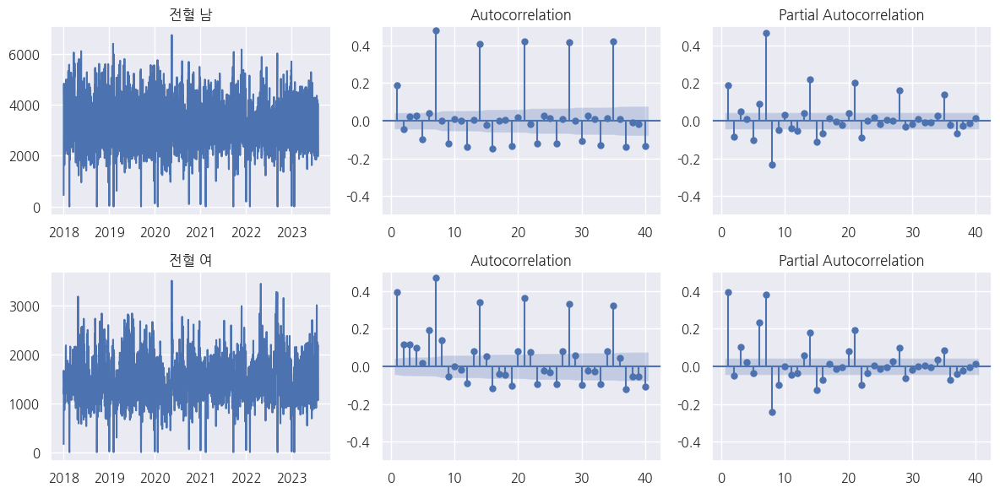

In [32]:
bd_gender_group = daily_bd_df[daily_bd_df["method"].isin(["전혈 400ml", "전혈 320ml"])] \
    .groupby(by=["date", "gender"])["count"].sum().reset_index().pivot(index="date", columns="gender",
                                                                       values="count").reindex(
    complete_date_range).fillna(0)

draw_acf_pacf({"전혈 남": bd_gender_group["남"],
               "전혈 여": bd_gender_group["여"]})

# Blood donors seasonality extraction

## 성별 통합

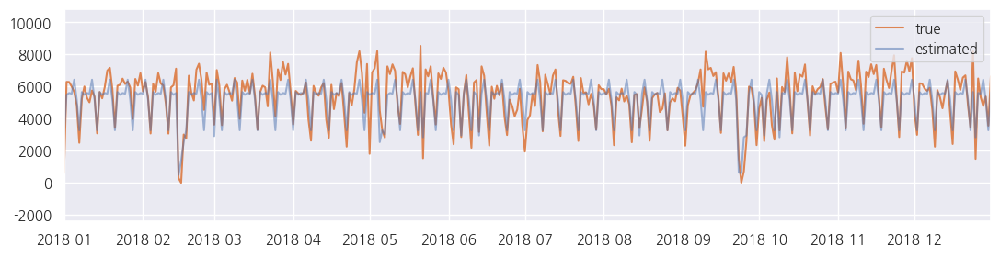

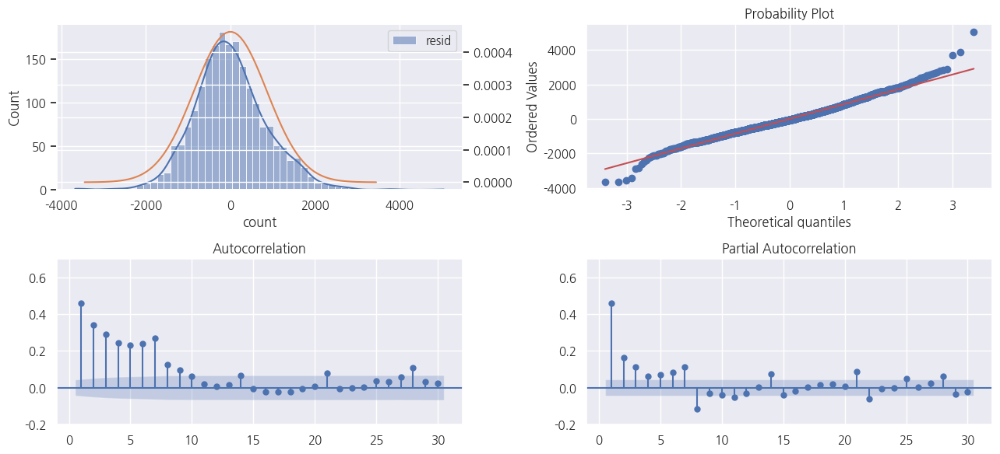

In [33]:
bd_temp = daily_bd_df[daily_bd_df["method"].isin(["전혈 400ml", "전혈 320ml"])] \
    .groupby(by="date")["count"].sum().reindex(complete_date_range).fillna(0)
bd_exog_vars = np.concatenate([dow_oh, holiday, missing_dates], axis=1)
weekly_bd_model_fit = sm.OLS(bd_temp, bd_exog_vars).fit()

_, ax = plt.subplots(1, 1, figsize=(13, 3))

target_year = 2018

weekly_bd_y_predict = weekly_bd_model_fit.predict(bd_exog_vars)
weekly_bd_resid = bd_temp - weekly_bd_y_predict
ax.plot(bd_temp, color="C1", label="true")
ax.plot(bd_temp.index, weekly_bd_y_predict, color="C0", label="estimated", alpha=0.5)

if target_year:
    ax.set_xlim([date(target_year, 1, 1), date(target_year, 12, 31)])
ax.legend(loc=1)
plt.show()

_, axs = plt.subplots(2, 2, figsize=(13, 6))
sns.histplot(weekly_bd_resid, kde=True, ax=axs[0][0], label="resid")
ax = axs[0][0].twinx()
mu, std = stats.norm.fit(weekly_bd_resid)
x_range = np.linspace(mu - std * 4, mu + std * 4, 100)
ax.plot(x_range, stats.norm.pdf(x_range, mu, std), c="C1", label=f"N({int(mu)}, {int(std)}^2)")
axs[0][0].legend()

stats.probplot(weekly_bd_resid, dist=stats.norm, plot=axs[0][1])

sgt.plot_acf(weekly_bd_resid, lags=30, zero=False, ax=axs[1][0])
sgt.plot_pacf(weekly_bd_resid, lags=30, zero=False, ax=axs[1][1])
for ax in axs[1]:
    ax.set_ylim([-0.2, 0.7])

plt.tight_layout()
plt.show()

## 성별 분리

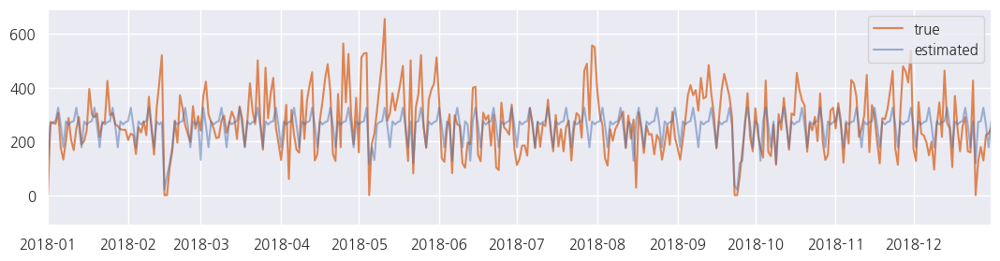

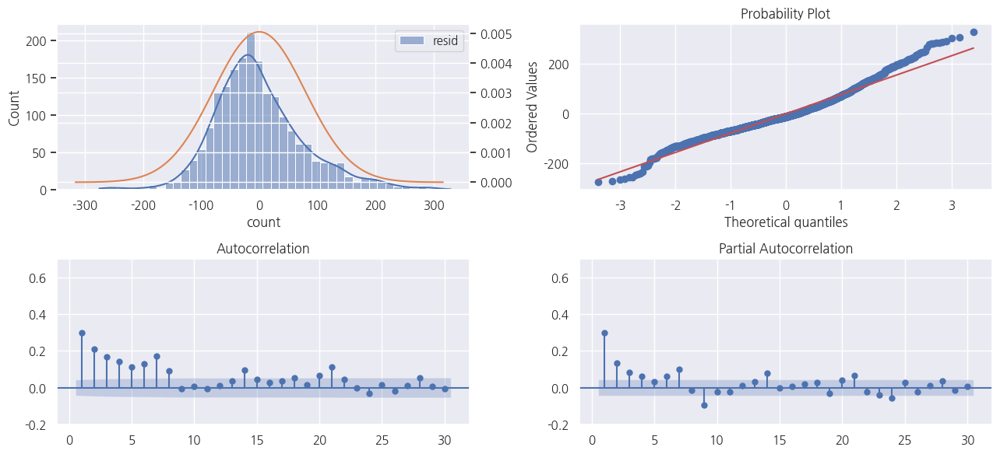

In [123]:
# 성별 분리 - 남

bd_temp = daily_bd_df[(daily_bd_df["method"].isin(["전혈 400ml", "전혈 320ml"])) & (daily_bd_df["gender"] == "남") & (
            daily_bd_df["region"] == "광주전남")] \
    .groupby(by="date")["count"].sum().reindex(complete_date_range).fillna(0)
bd_exog_vars = np.concatenate([dow_oh, holiday, missing_dates], axis=1)
weekly_bd_model_fit = sm.OLS(bd_temp, bd_exog_vars).fit()

_, ax = plt.subplots(1, 1, figsize=(13, 3))

target_year = 2018

weekly_bd_y_predict = weekly_bd_model_fit.predict(bd_exog_vars)
weekly_bd_resid = bd_temp - weekly_bd_y_predict
ax.plot(bd_temp, color="C1", label="true")
ax.plot(bd_temp.index, weekly_bd_y_predict, color="C0", label="estimated", alpha=0.5)

if target_year:
    ax.set_xlim([date(target_year, 1, 1), date(target_year, 12, 31)])
ax.legend(loc=1)
plt.show()

_, axs = plt.subplots(2, 2, figsize=(13, 6))
sns.histplot(weekly_bd_resid, kde=True, ax=axs[0][0], label="resid")
ax = axs[0][0].twinx()
mu, std = stats.norm.fit(weekly_bd_resid)
x_range = np.linspace(mu - std * 4, mu + std * 4, 100)
ax.plot(x_range, stats.norm.pdf(x_range, mu, std), c="C1", label=f"N({int(mu)}, {int(std)}^2)")
axs[0][0].legend()

stats.probplot(weekly_bd_resid, dist=stats.norm, plot=axs[0][1])

sgt.plot_acf(weekly_bd_resid, lags=30, zero=False, ax=axs[1][0])
sgt.plot_pacf(weekly_bd_resid, lags=30, zero=False, ax=axs[1][1])
for ax in axs[1]:
    ax.set_ylim([-0.2, 0.7])

plt.tight_layout()
plt.show()

In [124]:
n_fourier_terms = 7
fourier_terms = make_fourier_terms(len(weekly_bd_resid), 365.25, n_fourier_terms)
monthly_bd_model_fit = sm.OLS(weekly_bd_resid, fourier_terms).fit()
print(f"{n_fourier_terms}'s R^2: {monthly_bd_model_fit.rsquared:.3f}")

print(monthly_bd_model_fit.summary())

7's R^2: 0.032
                                 OLS Regression Results                                
Dep. Variable:                  count   R-squared (uncentered):                   0.032
Model:                            OLS   Adj. R-squared (uncentered):              0.026
Method:                 Least Squares   F-statistic:                              4.814
Date:                Fri, 22 Mar 2024   Prob (F-statistic):                    8.29e-09
Time:                        11:44:31   Log-Likelihood:                         -11766.
No. Observations:                2038   AIC:                                  2.356e+04
Df Residuals:                    2024   BIC:                                  2.364e+04
Df Model:                          14                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------

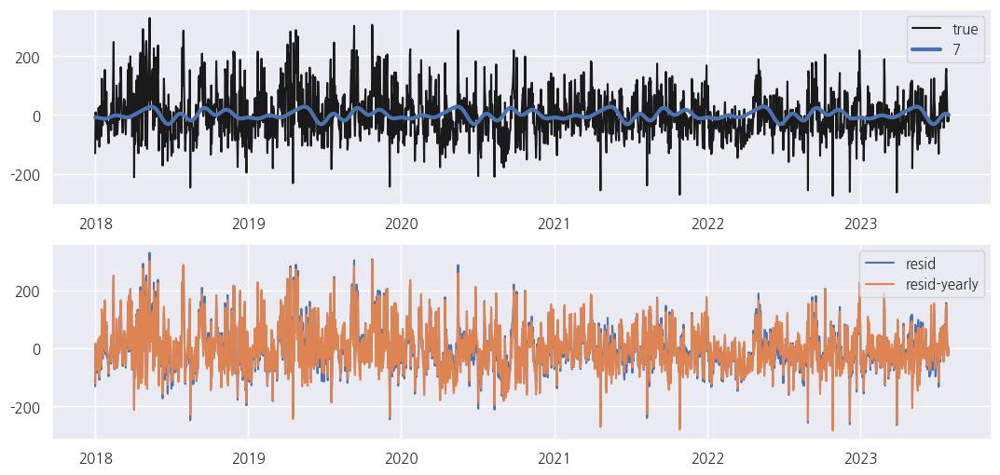

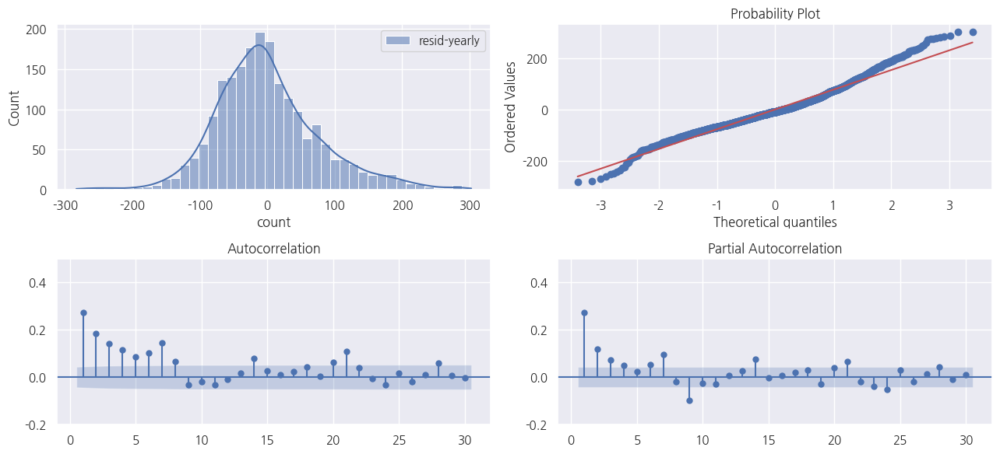

In [125]:
_, axs = plt.subplots(2, 1, figsize=(13, 6))

target_year = None

axs[0].plot(weekly_bd_resid, color="k", label="true")
# axs[0].plot(weekly_bd_resid.rolling(window=30).mean(), color="r", label="ma", alpha=0.5, linewidth=3)

monthly_bd_y_predict = monthly_bd_model_fit.predict(fourier_terms)
monthly_bd_resid = weekly_bd_resid - monthly_bd_y_predict

axs[0].plot(weekly_bd_resid.index, monthly_bd_y_predict, label=f"{n_fourier_terms}", linewidth=3)

axs[1].plot(weekly_bd_resid, label="resid")
axs[1].plot(monthly_bd_resid, label="resid-yearly")

if target_year:
    axs[0].set_xlim([date(target_year, 1, 1), date(target_year, 12, 31)])
    axs[1].set_xlim([date(target_year, 1, 1), date(target_year, 12, 31)])
axs[0].legend()
axs[1].legend()

plt.show()

_, axs = plt.subplots(2, 2, figsize=(13, 6))

# sns.histplot(weekly_bd_resid, kde=True, ax=axs[0][0], label="resid", alpha=0.5)
sns.histplot(monthly_bd_resid, kde=True, ax=axs[0][0], label="resid-yearly")
axs[0][0].legend()

stats.probplot(monthly_bd_resid, dist=stats.norm, plot=axs[0][1])

sgt.plot_acf(monthly_bd_resid, lags=30, zero=False, ax=axs[1][0])
sgt.plot_pacf(monthly_bd_resid, lags=30, zero=False, ax=axs[1][1])
for ax in axs[1]:
    ax.set_ylim([-0.2, 0.5])

plt.tight_layout()
plt.show()

                                     SARIMAX Results                                     
Dep. Variable:                             count   No. Observations:                 1826
Model:             ARIMA(1, 0, 2)x(1, 0, [1], 7)   Log Likelihood              -10482.930
Date:                           Fri, 22 Mar 2024   AIC                          20977.859
Time:                                   11:44:34   BIC                          21010.918
Sample:                               01-01-2018   HQIC                         20990.054
                                    - 12-31-2022                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7346      0.061     11.987      0.000       0.615       0.855
ma.L1         -0.5159      0.066     -7.824

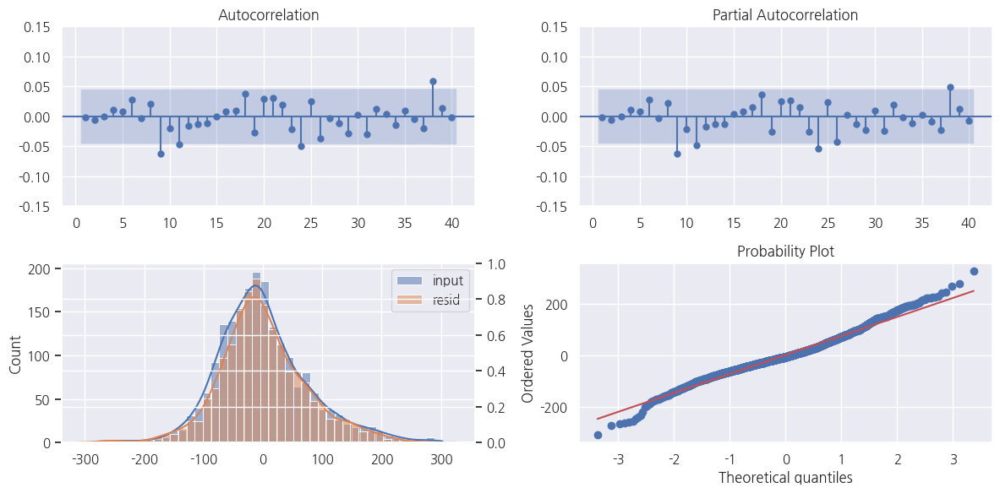

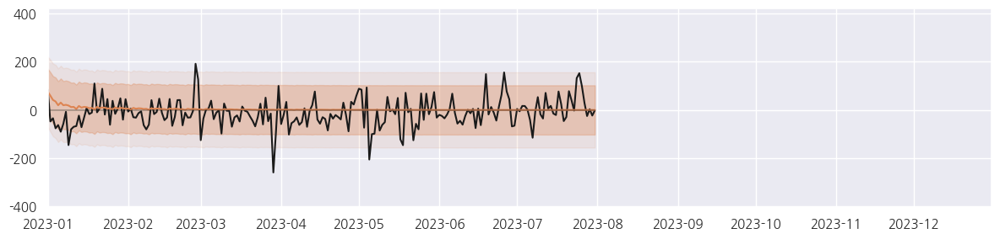

In [126]:
y_train = monthly_bd_resid[:"2022-12-31"]
y_test = monthly_bd_resid["2023-1-1":]

arima_model_fit = arima_model(y_train, y_test, None, None, summary=True, plot=True, arima_order=(1, 0, 2),
                              target_year=2023)
arima_y_predict = pd.concat([arima_model_fit.predict(), arima_model_fit.forecast(steps=len(y_test))])

ADF p value: 0.0


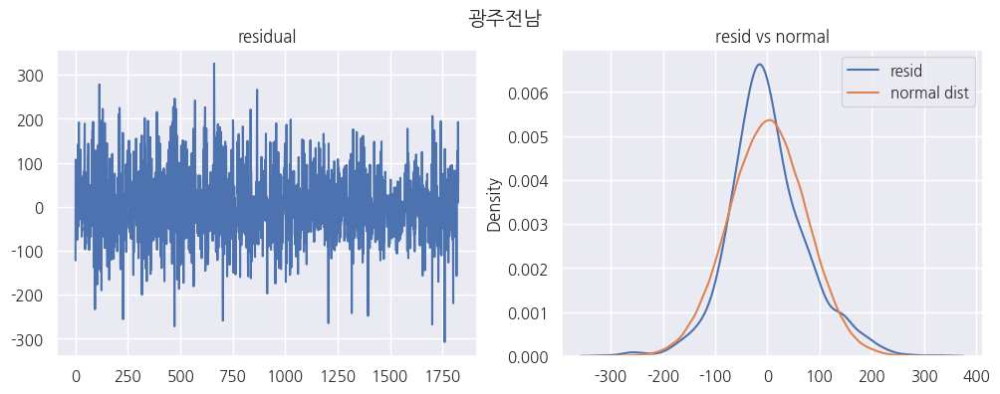

In [127]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

# seasonal + arima resid vs normal
arima_resid = arima_model_fit.resid.values
axs[0].plot(arima_resid)
axs[0].set_title("residual")

print(f"ADF p value: {adfuller(arima_resid)[1]}")

sns.kdeplot(arima_resid, label="resid", ax=axs[1])

normal_data = np.random.normal(np.mean(arima_resid), np.std(arima_resid), size=300_000)
sns.kdeplot(normal_data, label="normal dist", ax=axs[1])
axs[1].set_title("resid vs normal")

plt.legend()
fig.suptitle("광주전남")
plt.show()

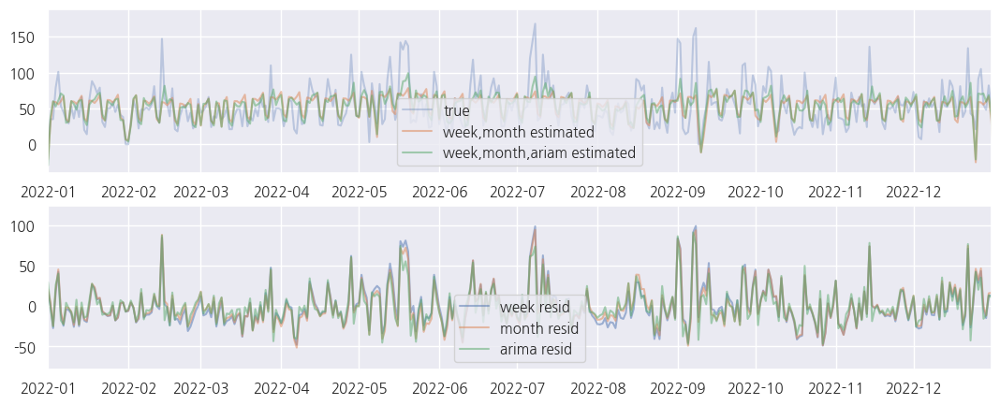

In [39]:
_, axs = plt.subplots(2, 1, figsize=(13, 5))

target_year = 2022

axs[0].plot(bd_temp, label="true", alpha=0.3)
bd_predict = weekly_bd_y_predict + monthly_bd_y_predict + arima_y_predict
# axs[0].plot(bd_temp.index, weekly_bd_y_predict, label="week estimated", alpha=0.5)
axs[0].plot(bd_temp.index, weekly_bd_y_predict + monthly_bd_y_predict, label="week,month estimated", alpha=0.5)
axs[0].plot(bd_temp.index, bd_predict, label="week,month,ariam estimated", alpha=0.5)

axs[1].plot(bd_temp.index, weekly_bd_resid, alpha=0.5, label="week resid")
axs[1].plot(bd_temp.index, monthly_bd_resid, alpha=0.5, label="month resid")
axs[1].plot(bd_temp.index, monthly_bd_resid.values - arima_y_predict.values, alpha=0.5, label="arima resid")

for ax in axs:
    if target_year:
        ax.set_xlim([date(target_year, 1, 1), date(target_year, 12, 31)])
    ax.legend(loc=8)
plt.show()

# Blood usage seasonality extraction

In [136]:
# blood donation <- blood usage

# bd vs bu 모델 잔차끼리 비교해야함.

bd_temp = daily_bd_df[daily_bd_df["method"].isin(["전혈 400ml", "전혈 320ml"])] \
    .groupby(by="date")["count"].sum().reindex(complete_date_range).fillna(0)
bu_temp = np.sum(daily_bu_df.values, axis=1).reshape(-1, 1)
exog_vars = np.concatenate([dow_oh, holiday, missing_dates], axis=1)
exog_vars_df = pd.DataFrame(exog_vars, columns=["mon", "tue", "wed", "thu", "fri", "sat", "sun", "holiday", "missing"],
                            index=bd_temp.index)

bd_model_fit = sm.OLS(bd_temp, exog_vars_df).fit()
# print(bd_model_fit.summary())

bu_model_fit = sm.OLS(bu_temp, exog_vars_df).fit()
# print(bu_model_fit.summary())

                            OLS Regression Results                            
Dep. Variable:                  count   R-squared:                       0.648
Model:                            OLS   Adj. R-squared:                  0.647
Method:                 Least Squares   F-statistic:                     467.6
Date:                Sat, 23 Mar 2024   Prob (F-statistic):               0.00
Time:                        12:24:58   Log-Likelihood:                -16668.
No. Observations:                2038   AIC:                         3.335e+04
Df Residuals:                    2029   BIC:                         3.340e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
mon         5655.0555     50.944    111.006      0.0

[[1.         0.47956093]
 [0.47956093 1.        ]]


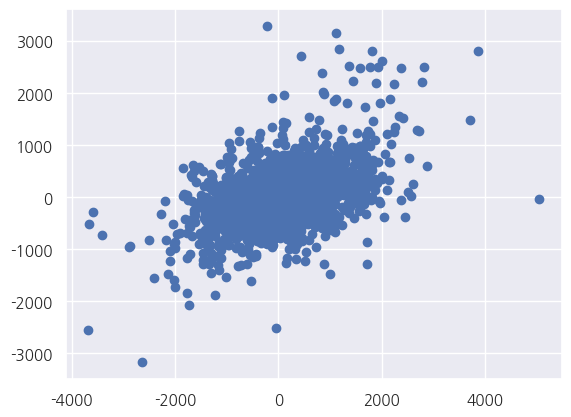

In [140]:
# bd bu 잔차간 correlation 0.5 -> 상관성
plt.scatter(bd_model_fit.resid.values, bu_model_fit.resid.values)

print(np.corrcoef(bd_model_fit.resid.values, bu_model_fit.resid.values))

In [84]:
# TODO: 이후 혈액보유상태 예측.

# 사용량 예측
bd_temp = daily_bd_df[(daily_bd_df["method"].isin(["전혈 400ml", "전혈 320ml"]))] \
    .groupby(by="date")["count"].sum().reindex(complete_date_range).fillna(0)
bd_exog_vars = np.concatenate([dow_oh, holiday, missing_dates], axis=1)
weekly_bd_model_fit = sm.OLS(bd_temp, bd_exog_vars).fit()

bu_exog_vars = np.concatenate([dow_oh, holiday, missing_dates], axis=1)
weekly_bu_model_fit = sm.OLS(bu_temp, bu_exog_vars).fit()

print(weekly_bu_model_fit.summary())

                            OLS Regression Results                            
Dep. Variable:                      A   R-squared:                       0.884
Model:                            OLS   Adj. R-squared:                  0.883
Method:                 Least Squares   F-statistic:                     1925.
Date:                Tue, 19 Mar 2024   Prob (F-statistic):               0.00
Time:                        21:14:24   Log-Likelihood:                -13724.
No. Observations:                2038   AIC:                         2.747e+04
Df Residuals:                    2029   BIC:                         2.752e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1          2220.0992     12.018    184.728      0.0

NameError: name 'weekly_bu_model_fit' is not defined

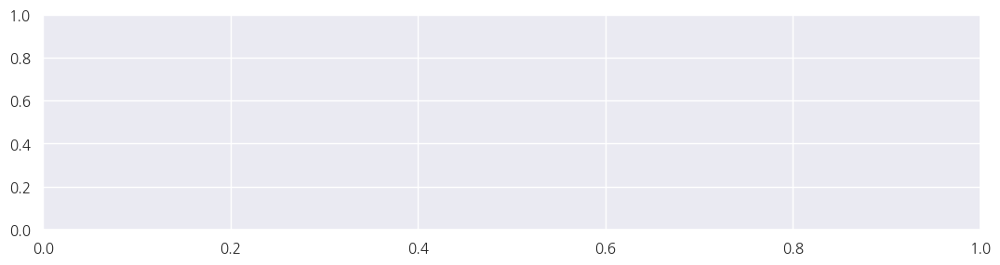

In [41]:
_, ax = plt.subplots(1, 1, figsize=(13, 3))

target_year = 2018

weekly_bu_y_predict = weekly_bu_model_fit.predict(bu_exog_vars)
weekly_bu_resid = bu_temp - weekly_bu_y_predict
ax.plot(bu_temp, color="C1", label="true")
ax.plot(bu_temp.index, weekly_bu_y_predict, color="C0", label="estimated", alpha=0.5)

if target_year:
    ax.set_xlim([date(target_year, 1, 1), date(target_year, 12, 31)])
ax.legend(loc=1)
plt.show()

_, axs = plt.subplots(2, 2, figsize=(13, 6))
sns.histplot(weekly_bu_resid, kde=True, ax=axs[0][0], label="resid")
ax = axs[0][0].twinx()
mu, std = stats.norm.fit(weekly_bu_resid)
x_range = np.linspace(mu - std * 4, mu + std * 4, 100)
ax.plot(x_range, stats.norm.pdf(x_range, mu, std), c="C1", label=f"N({int(mu)}, {int(std)}^2)")
axs[0][0].legend()

stats.probplot(weekly_bu_resid, dist=stats.norm, plot=axs[0][1])

sgt.plot_acf(weekly_bu_resid, lags=20, zero=False, ax=axs[1][0])
sgt.plot_pacf(weekly_bu_resid, lags=20, zero=False, ax=axs[1][1])
for ax in axs[1]:
    ax.set_ylim([-0.2, 0.7])

plt.tight_layout()
plt.show()

In [41]:
n_fourier_terms = 15
fourier_terms = make_fourier_terms(len(weekly_bu_resid), 365.25, n_fourier_terms)
monthly_bu_model_fit = sm.OLS(weekly_bu_resid, fourier_terms).fit()
print(f"{n_fourier_terms}'s R^2: {monthly_bu_model_fit.rsquared:.3f}")

15's R^2: 0.055


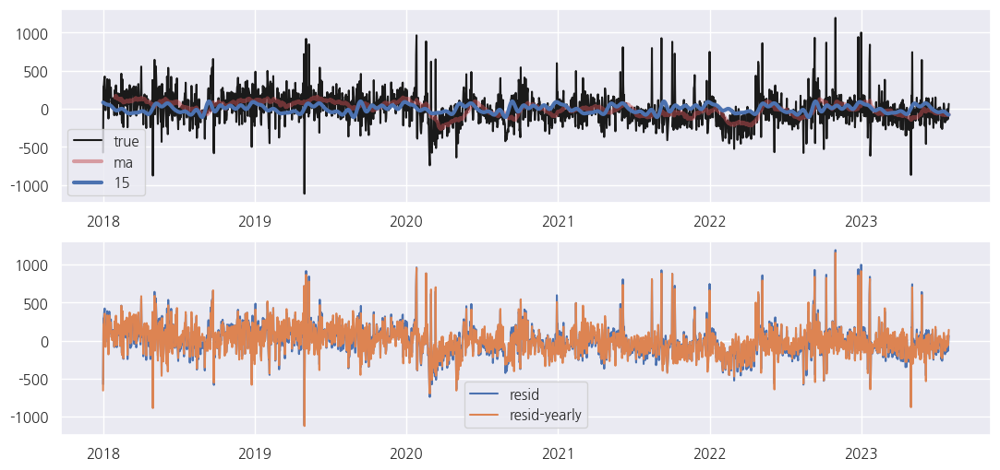

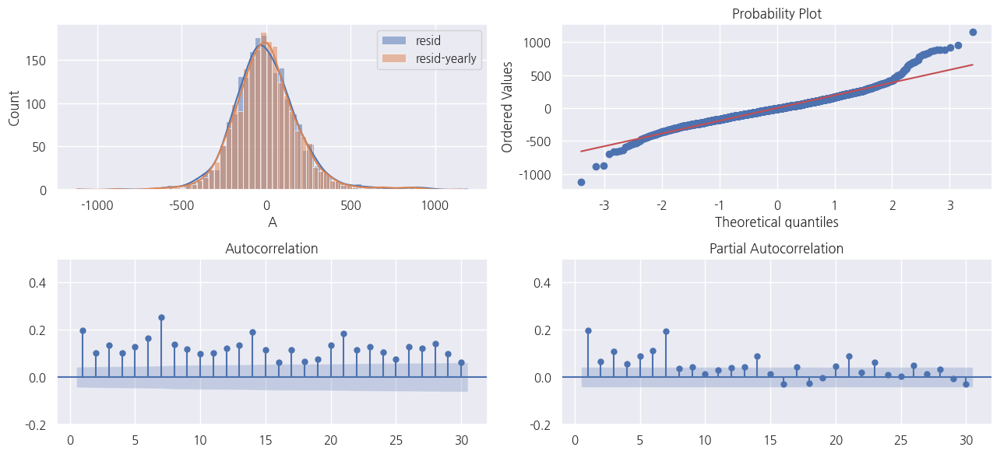

In [42]:
_, axs = plt.subplots(2, 1, figsize=(13, 6))

target_year = None

axs[0].plot(weekly_bu_resid, color="k", label="true")
axs[0].plot(weekly_bu_resid.rolling(window=30).mean(), color="r", label="ma", alpha=0.5, linewidth=3)

monthly_bu_y_predict = monthly_bu_model_fit.predict(fourier_terms)
monthly_bu_resid = weekly_bu_resid - monthly_bu_y_predict

axs[0].plot(weekly_bu_resid.index, monthly_bu_y_predict, label=f"{n_fourier_terms}", linewidth=3)

axs[1].plot(weekly_bu_resid, label="resid")
axs[1].plot(monthly_bu_resid, label="resid-yearly")

if target_year:
    axs[0].set_xlim([date(target_year, 1, 1), date(target_year, 12, 31)])
    axs[1].set_xlim([date(target_year, 1, 1), date(target_year, 12, 31)])
axs[0].legend()
axs[1].legend()

plt.show()

_, axs = plt.subplots(2, 2, figsize=(13, 6))

sns.histplot(weekly_bu_resid, kde=True, ax=axs[0][0], label="resid")
sns.histplot(monthly_bu_resid, kde=True, ax=axs[0][0], label="resid-yearly")
axs[0][0].legend()

stats.probplot(monthly_bu_resid, dist=stats.norm, plot=axs[0][1])

sgt.plot_acf(monthly_bu_resid, lags=30, zero=False, ax=axs[1][0])
sgt.plot_pacf(monthly_bu_resid, lags=30, zero=False, ax=axs[1][1])
for ax in axs[1]:
    ax.set_ylim([-0.2, 0.5])

plt.tight_layout()
plt.show()

D:\OneDrive\local\workspace\blood_donation\venv\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
D:\OneDrive\local\workspace\blood_donation\venv\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
D:\OneDrive\local\workspace\blood_donation\venv\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
D:\OneDrive\local\workspace\blood_donation\venv\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\OneDrive\local\workspace\blood_donation

AIC: 24241.01887914611
RMSE: 191.83707627651592, 192.3719313324688
Ljung-Box p: 0.8569492488845403


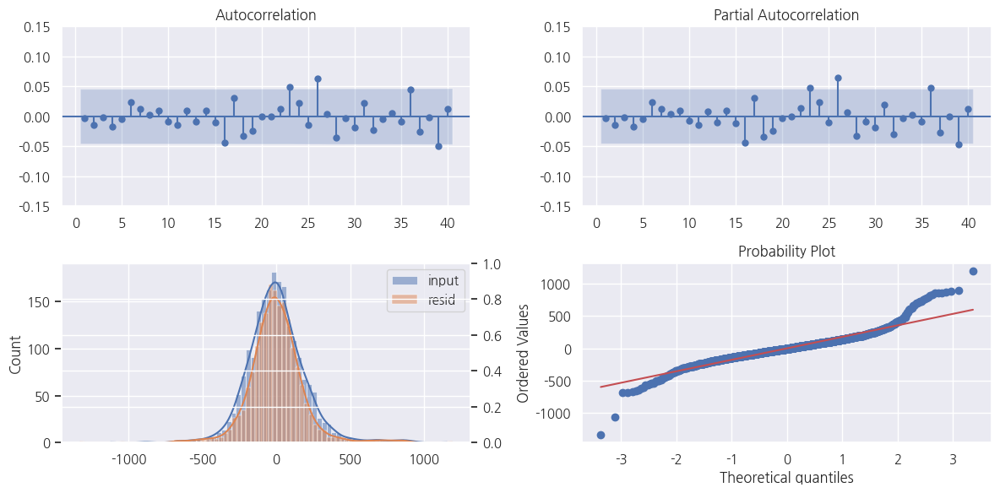

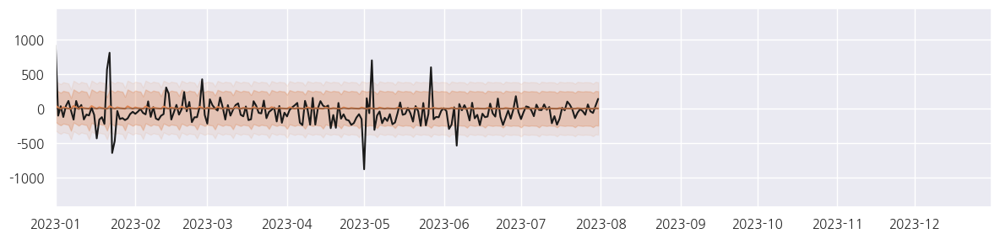

In [43]:
y_train = monthly_bu_resid[:"2022-12-31"]
y_test = monthly_bu_resid["2023-1-1":]

arima_model_fit = arima_model(y_train, y_test, None, None, summary=False, plot=True, arima_order=(3, 0, 3),
                              target_year=2023)
arima_y_predict = pd.concat([arima_model_fit.predict(), arima_model_fit.forecast(steps=len(y_test))])

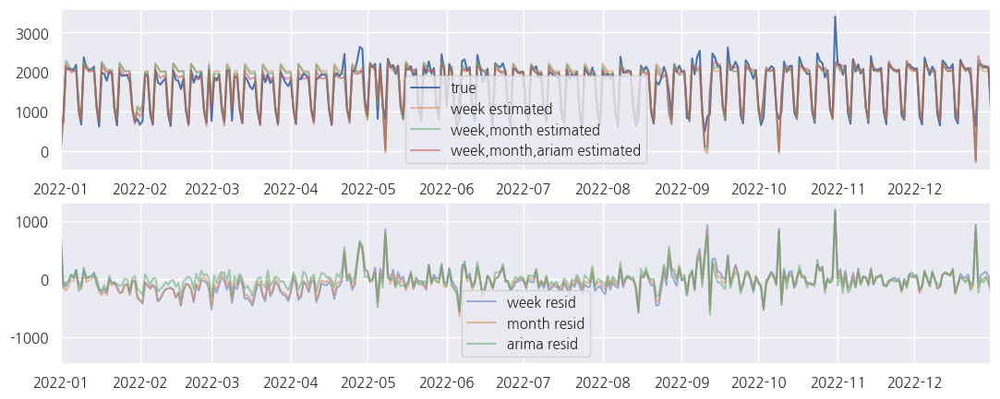

In [44]:
_, axs = plt.subplots(2, 1, figsize=(13, 5))

target_year = 2022

axs[0].plot(bu_temp, label="true")
bu_predict = weekly_bu_y_predict + monthly_bu_y_predict + arima_y_predict
axs[0].plot(bu_temp.index, weekly_bu_y_predict, label="week estimated", alpha=0.5)
axs[0].plot(bu_temp.index, weekly_bu_y_predict + monthly_bu_y_predict, label="week,month estimated", alpha=0.5)
axs[0].plot(bu_temp.index, bu_predict, label="week,month,ariam estimated", alpha=0.5)

axs[1].plot(bu_temp.index, weekly_bu_resid, alpha=0.5, label="week resid")
axs[1].plot(bu_temp.index, monthly_bu_resid, alpha=0.5, label="month resid")
axs[1].plot(bu_temp.index, monthly_bu_resid.values - arima_y_predict.values, alpha=0.5, label="arima resid")

for ax in axs:
    if target_year:
        ax.set_xlim([date(target_year, 1, 1), date(target_year, 12, 31)])
    ax.legend(loc=8)
plt.show()

# Compare usage / donors

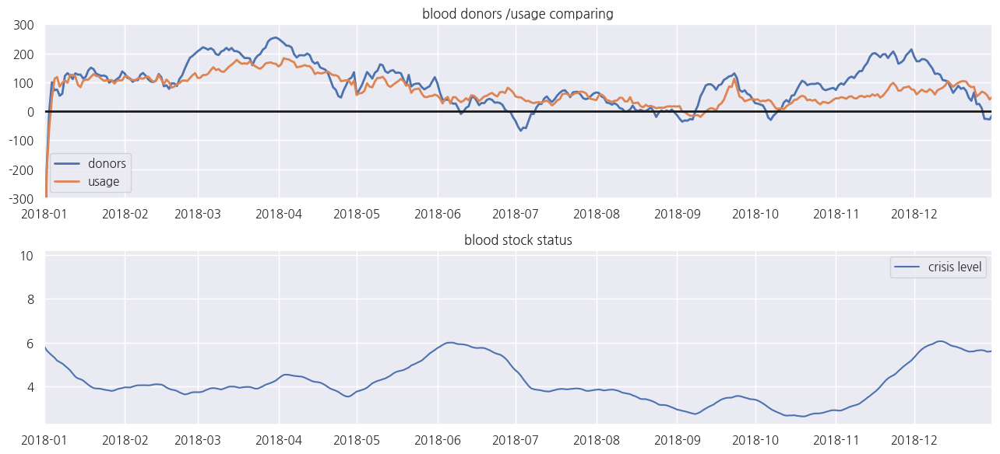

In [45]:
_, axs = plt.subplots(2, 1, figsize=(13, 6))

axs[0].plot((monthly_bd_resid - np.mean(monthly_bd_resid)).ewm(alpha=0.05).mean(), label="donors", linewidth=2)
axs[0].plot((monthly_bu_resid - np.mean(monthly_bu_resid)).ewm(alpha=0.05).mean(), label="usage", linewidth=2)

axs[0].plot([min(monthly_bu_resid.index), max(monthly_bu_resid.index)], [0, 0], color="k", linewidth=2)
axs[0].set_title("blood donors /usage comparing")
axs[0].legend()

axs[1].plot(bd_crisis_status.ewm(alpha=0.1).mean(), label="crisis level")
axs[1].set_title("blood stock status")
axs[1].legend()

target_year = 2018
if target_year:
    axs[0].set_xlim([date(target_year, 1, 1), date(target_year, 12, 31)])
    axs[0].set_ylim([-300, 300])
    axs[1].set_xlim([date(target_year, 1, 1), date(target_year, 12, 31)])

plt.tight_layout()
plt.show()

How can I find which element affected to the crisis level?

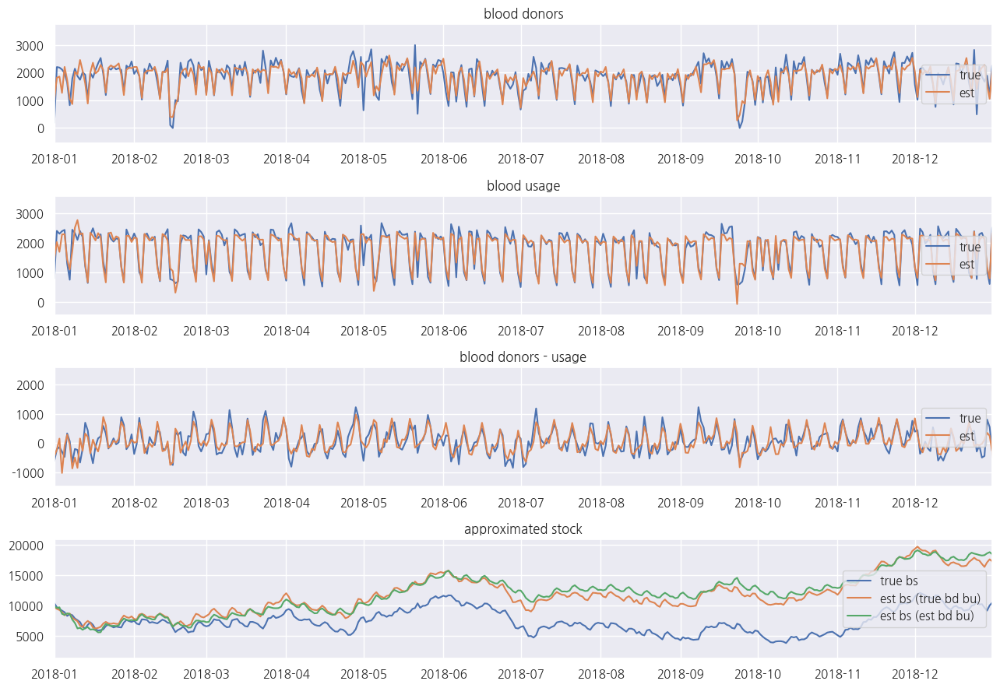

In [46]:
_, axs = plt.subplots(4, 1, figsize=(13, 9))

target_year = 2018

axs[0].plot(bd_temp.index, bd_temp, label="true")
axs[0].plot(bd_temp.index, bd_predict, label="est")
axs[1].plot(bd_temp.index, bu_temp, label="true")
axs[1].plot(bd_temp.index, bu_predict, label="est")
axs[2].plot(bd_temp.index, bd_temp - bu_temp, label="true")
axs[2].plot(bd_temp.index, bd_predict - bu_predict, label="est")
axs[3].plot(bs_temp, label="true bs")
axs[3].plot(bd_temp.index, bs_temp[0] + ((bd_temp - bu_temp) - np.mean((bd_temp - bu_temp))).cumsum(),
            label="est bs (true bd bu)")
axs[3].plot(bd_temp.index, bs_temp[0] + (bd_predict - bu_predict - np.mean((bd_predict - bu_predict))).cumsum(),
            label="est bs (est bd bu)")

axs[0].set_title("blood donors")
axs[1].set_title("blood usage")
axs[2].set_title("blood donors - usage")
axs[3].set_title("approximated stock")

for ax in axs:
    if target_year:
        ax.set_xlim([date(target_year, 1, 1), date(target_year, 12, 31)])
    ax.legend(loc=5)

plt.tight_layout()
plt.show()
# 일간 예측 너무 seansitive해서 오차의 영향 많이받아서 그럼? smooting
# 가까운 기간에 대해서는 잘 맞추나? 2023~ 1달정도는 잘 맞추는지 확인 (일간 데이터라 오차 누적되면 장기간에대해서는 엄청 커짐)

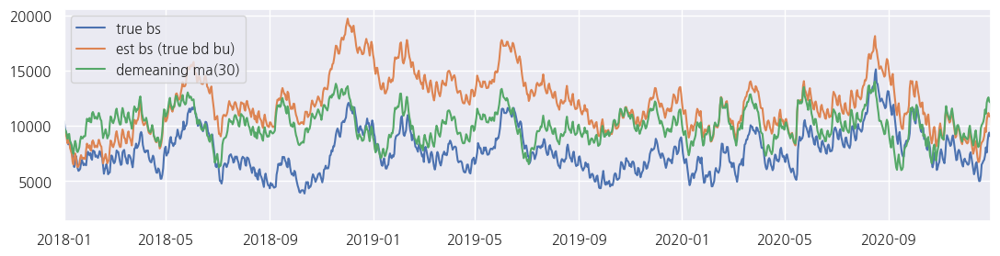

In [47]:
# moving average로 demeaning하는 방법이 더 잘맞는듯?
_, ax = plt.subplots(1, 1, figsize=(13, 3))
# diff_temp = (bd_temp-bu_temp) - (bd_temp-bu_temp).resample("m").mean().shift(-1).dropna().reindex(bs_temp.index).fillna(method='bfill')
diff_temp_2 = (bd_temp - bu_temp) - (bd_temp - bu_temp).rolling(30).mean().fillna(method='bfill')
ax.plot(bs_temp, label="true bs")
ax.plot(bd_temp.index, bs_temp[0] + ((bd_temp - bu_temp) - np.mean((bd_temp - bu_temp))).cumsum(),
        label="est bs (true bd bu)")
# ax.plot(bd_temp.index, bs_temp[0]+(diff_temp - np.mean(diff_temp)).cumsum(), label="demeaning month")
ax.plot(bd_temp.index, bs_temp[0] + (diff_temp_2).cumsum(), label="demeaning ma(30)")
ax.legend()
ax.set_xlim([date(2018, 1, 1), date(2020, 12, 31)])
plt.show()

TypeError: unsupported Type DatetimeIndex

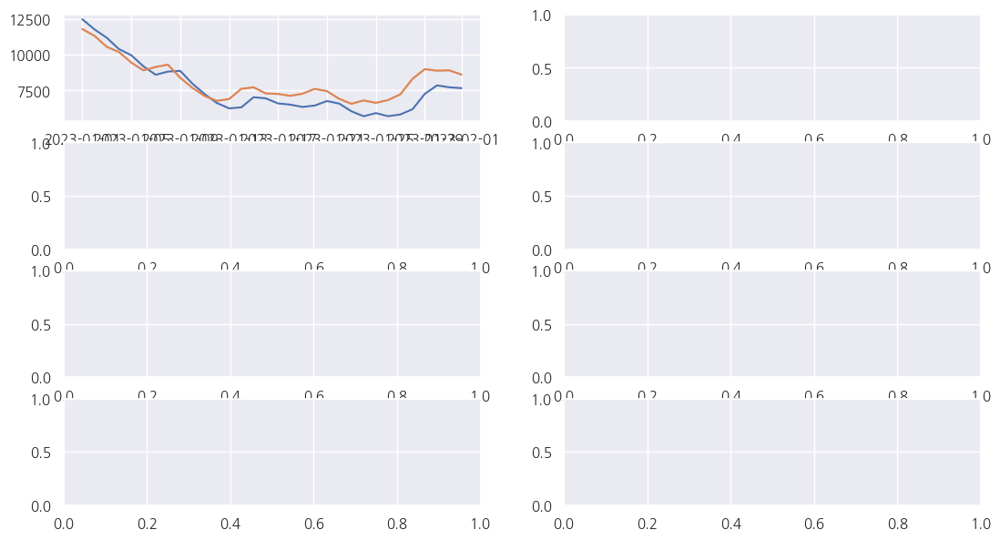

In [48]:
# TODO: 예측 시작시점 바꿔가면서 테스트

_, axs = plt.subplots(4, 2, figsize=(13, 7))

true_resid_mean_list = []
est_resid_mean_list = []
for m, ax in enumerate(axs.flatten(), start=1):
    if m > 7:
        break
    bs_true = bs_temp[f"2023-{m}-1":f"2023-{m + 1}-1"]
    ax.plot(bs_true, label="true bs")
    bs_diff_est_true = (bd_temp - bu_temp)[f"2023-{m}-1":f"2023-{m + 1}-1"]
    bs_est_true = bs_temp[f"2023-{m}-1"] + bs_diff_est_true.cumsum()
    ax.plot(bs_est_true, label="est bs (true bd bu)", alpha=0.3, color="C1")
    ax.plot(bs_est_true - 0.5 * (true_resid_mean_list[m - 2] if m > 1 else 0), label="est bs (true bd bu) w demeaning",
            color="C1")
    bs_diff_est_est = (bd_predict - bu_predict)[f"2023-{m}-1":f"2023-{m + 1}-1"]
    bs_est_est = bs_temp[f"2023-{m}-1"] + bs_diff_est_est.cumsum().to_timestamp()
    ax.plot(bs_est_est, label="est bs (est bd bu)", alpha=0.3, color="C2")
    ax.plot(bs_est_est - 0.5 * (est_resid_mean_list[m - 2] if m > 1 else 0), label="est bs (est bd bu) w demeaning",
            color="C2")
    ax.set_title(f"2023-{m} ~ 2023-{m + 1}")
    # ax.legend(loc=5, fontsize=10, framealpha=0.3)
    true_resid_mean_list.append(np.mean(bs_est_true - bs_true))
    est_resid_mean_list.append(np.mean(bs_est_est - bs_true))
plt.tight_layout()
plt.show()

예측값에서 이전달 잔차 평균 빼주면 좀더 정확한 값 얻을 수 있음 (momentum?)
이걸 좀더 dynamic하게 모델링 못하나?
주별?

(19358.0, 19388.0)

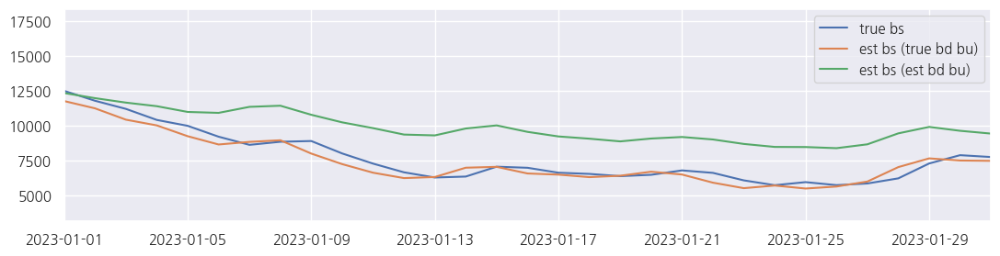

In [87]:
# 2023년 부터 예측 (단기간 예측 잘되는지 평가)
_, ax = plt.subplots(1, 1, figsize=(13, 3))
ax.plot(bs_temp, label="true bs")
bs_diff_est_true = (bd_temp - bu_temp)["2023-1-1":]
ax.plot(bd_temp["2023-1-1":].index, bs_temp["2023-1-1"] + (bs_diff_est_true - np.mean(bs_diff_est_true)).cumsum(),
        label="est bs (true bd bu)")
bs_diff_est_est = (bd_predict - bu_predict)["2023-1-1":]
ax.plot(bd_temp["2023-1-1":].index, bs_temp["2023-1-1"] + (bs_diff_est_est - np.mean(bs_diff_est_est)).cumsum(),
        label="est bs (est bd bu)")
ax.legend()

ax.set_xlim([date(2023, 1, 1), date(2023, 1, 31)])

가설: weekly seasonality의 구조가 시간에 따라 변한다면 weekly seasonlaity model의 잔차의 분산이 시간에 따라 변할 것
모든 요일에 대해 보면 구조가 잘 안보이니 개별 요일에 대해 확인.

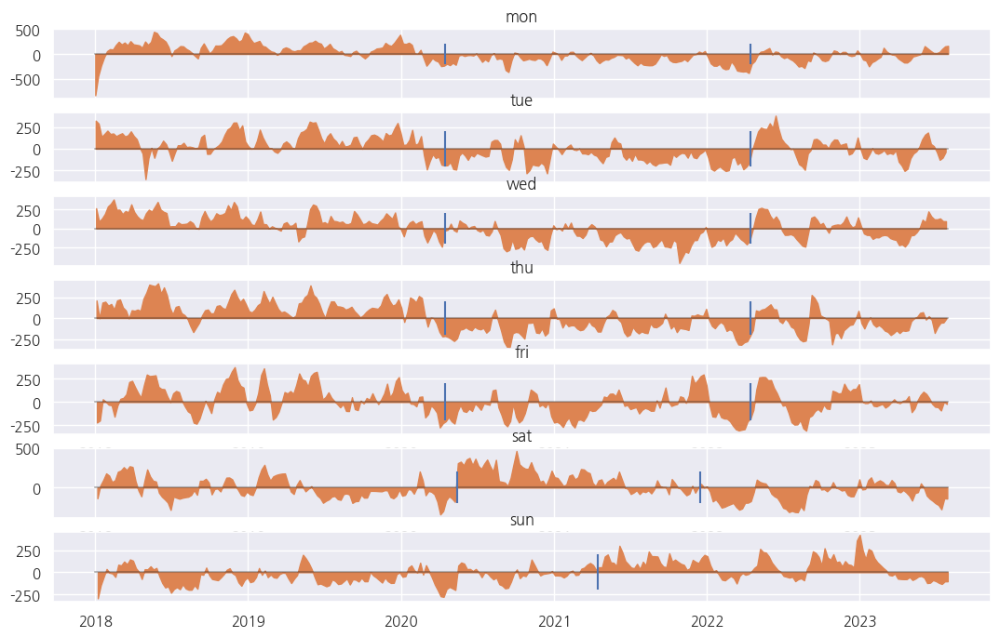

In [88]:
_, axs = plt.subplots(7, 1, figsize=(13, 8))

dow_name_list = ["mon", "tue", "wed", "thu", "fri", "sat", "sun"]

for i, ax in enumerate(axs):
    dow_resid = weekly_bd_resid[weekly_bd_resid.index.dayofweek == i]
    # ax.plot(dow_resid)
    ax.fill_between(dow_resid.index, dow_resid.ewm(3).mean(), color="C1")
    ax.plot([min(weekly_bd_resid.index), max(weekly_bd_resid.index)], [0, 0], color="k", alpha=0.3)
    # ax.vlines(x=date(2020, 1, 20), ymin=-200, ymax=200, color="r") # 판데믹 선언
    # ax.vlines(x=date(2022, 3, 1), ymin=-200, ymax=200, color="r") # 방역패스 해지
    # ax.vlines(x=date(2023, 5, 11), ymin=-200, ymax=200, color="r") # 비상사태 종료

    ax.set_title(dow_name_list[i])

for ax in axs[:5]:
    ax.vlines(x=date(2020, 4, 15), ymin=-200, ymax=200, color="b")  # week days (본격 확산 시작~)
    ax.vlines(x=date(2022, 4, 15), ymin=-200, ymax=200, color="b")  # week days (본격 확산 시작~)

axs[5].vlines(x=date(2020, 5, 15), ymin=-200, ymax=200, color="b")  # saturday (긴급재난지원금~)
axs[5].vlines(x=date(2021, 12, 15), ymin=-200, ymax=200, color="b")  # saturday (3차접종 ~)

axs[6].vlines(x=date(2021, 4, 15), ymin=-200, ymax=200, color="b")  # sunday (~예방접종 예약)

# TODO: 구간별 계수차이 비교

# 2020 이전에 평일에 많던 사람이 2020 covid 이후로 토요일로 이동한듯?
# 월~토 데이터 구조는 2020년 초반에 한번 변했고,일요일은 2021년 초반쯤 한번 변한듯
# 요일별 data structure가 평일, 토요일, 일요일 3분되는듯?
plt.show()

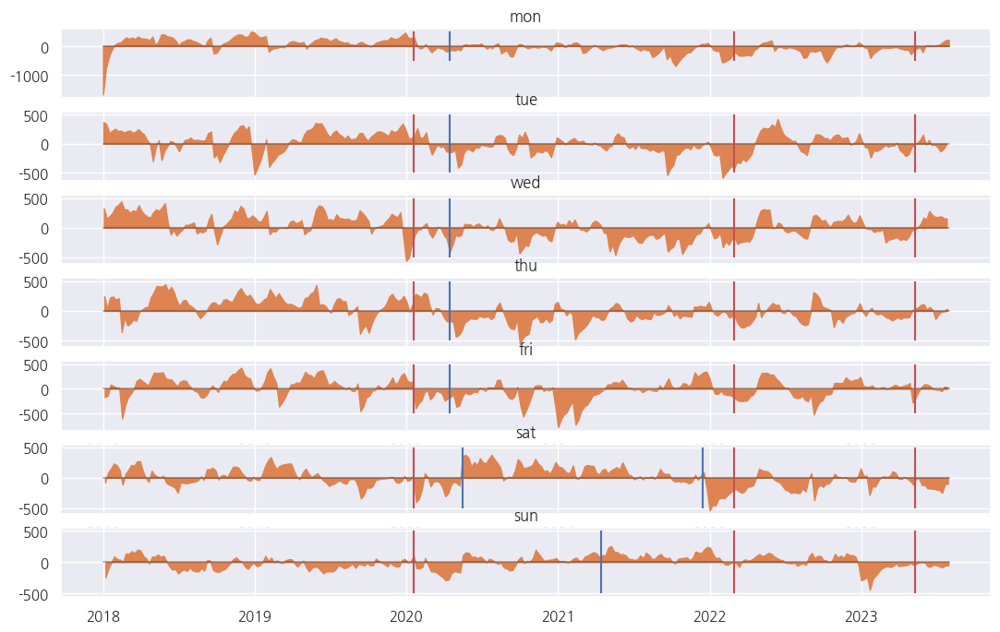

In [89]:
# 잔차대신 원 시계열에 대한 그래프
_, axs = plt.subplots(7, 1, figsize=(13, 8))

dow_name_list = ["mon", "tue", "wed", "thu", "fri", "sat", "sun"]

for i, ax in enumerate(axs):
    bd_temp_dow = bd_temp[bd_temp.index.dayofweek == i]
    bd_temp_dow = bd_temp_dow - np.mean(bd_temp_dow)
    # ax.plot(bd_temp_dow)
    ax.fill_between(bd_temp_dow.index, bd_temp_dow.ewm(3).mean(), color="C1")
    ax.plot([min(bd_temp.index), max(bd_temp.index)], [0, 0], color="k", alpha=0.3)
    ax.vlines(x=date(2020, 1, 20), ymin=-500, ymax=500, color="r")  # 판데믹 선언
    ax.vlines(x=date(2022, 3, 1), ymin=-500, ymax=500, color="r")  # 방역패스 해지
    ax.vlines(x=date(2023, 5, 11), ymin=-500, ymax=500, color="r")  # 비상사태 종료

    ax.set_title(dow_name_list[i])

for ax in axs[:5]:
    ax.vlines(x=date(2020, 4, 15), ymin=-500, ymax=500, color="b")  # week days (본격 확산 시작~)

axs[5].vlines(x=date(2020, 5, 15), ymin=-500, ymax=500, color="b")  # saturday (긴급재난지원금~)
axs[5].vlines(x=date(2021, 12, 15), ymin=-500, ymax=500, color="b")  # saturday (3차접종 ~)

axs[6].vlines(x=date(2021, 4, 15), ymin=-500, ymax=500, color="b")  # sunday (~예방접종 예약)

plt.show()

In [90]:
covid_effects = np.multiply(
    np.expand_dims((("2020-01-20" < bd_group.index) & (bd_group.index < "2022-03-01")).astype(int), axis=1),
    bd_exog_vars[:, :7])
bd_exog_vars_w_covid = np.concatenate([bd_exog_vars, covid_effects], axis=1)
weekly_bd_covid_model_fit = sm.OLS(bd_temp, bd_exog_vars_w_covid).fit()
print(weekly_bd_covid_model_fit.summary())

                            OLS Regression Results                            
Dep. Variable:                  count   R-squared:                       0.664
Model:                            OLS   Adj. R-squared:                  0.661
Method:                 Least Squares   F-statistic:                     266.2
Date:                Sat, 20 Jan 2024   Prob (F-statistic):               0.00
Time:                        12:47:54   Log-Likelihood:                -14442.
No. Observations:                2038   AIC:                         2.892e+04
Df Residuals:                    2022   BIC:                         2.901e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1          2005.6247     21.619     92.771      0.0

In [91]:
# TODO: 요일, 기간별 구분 다시해서 fit 해보기.
covid_weekday = np.multiply(
    np.expand_dims((("2020-04-15" < bd_group.index) & (bd_group.index < "2022-04-15")).astype(int), axis=1),
    bd_exog_vars[:, :5])  # 평일 with covid

covid_saturday = np.expand_dims((("2020-05-15" < bd_group.index) & (bd_group.index < "2021-12-15")).astype(int), axis=1) \
                 * np.expand_dims(bd_exog_vars[:, 5], axis=1)  # 토요일 with covid

covid_sunday = np.expand_dims(("2021-04-15" < bd_group.index).astype(int), axis=1) \
               * np.expand_dims(bd_exog_vars[:, 6], axis=1)  # 일요일 after covid

covid_effects = np.column_stack([covid_weekday, covid_saturday, covid_sunday])

In [92]:
# 요일별 임의로 구간설정했을 때
bd_exog_vars_w_covid = np.concatenate([bd_exog_vars, covid_effects], axis=1)
weekly_bd_covid_model_fit = sm.OLS(bd_temp, bd_exog_vars_w_covid).fit()
print(weekly_bd_covid_model_fit.summary())

                            OLS Regression Results                            
Dep. Variable:                  count   R-squared:                       0.669
Model:                            OLS   Adj. R-squared:                  0.667
Method:                 Least Squares   F-statistic:                     272.7
Date:                Sat, 20 Jan 2024   Prob (F-statistic):               0.00
Time:                        12:47:56   Log-Likelihood:                -14426.
No. Observations:                2038   AIC:                         2.888e+04
Df Residuals:                    2022   BIC:                         2.897e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1          2005.0594     21.113     94.970      0.0

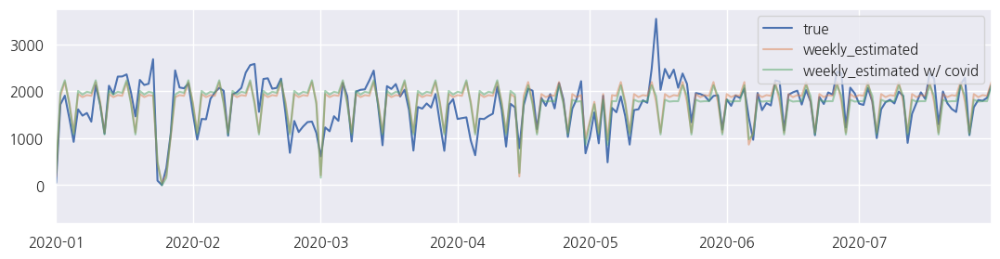

<Figure size 640x480 with 0 Axes>

In [93]:
_, ax = plt.subplots(1, 1, figsize=(13, 3))

target_year = 2020

weekly_bd_covid_y_predict = weekly_bd_covid_model_fit.predict(bd_exog_vars_w_covid)
ax.plot(bd_temp, label="true")
ax.plot(bd_temp.index, weekly_bd_y_predict, label="weekly_estimated", alpha=0.5)
ax.plot(bd_temp.index, weekly_bd_covid_y_predict, label="weekly_estimated w/ covid", alpha=0.5)

if target_year:
    ax.set_xlim([date(target_year, 1, 1), date(target_year, 7, 31)])

ax.legend(loc=1)
plt.show()

plt.tight_layout()
plt.show()

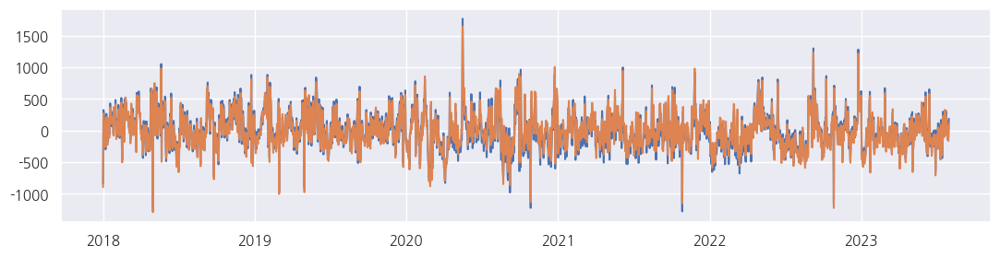

In [94]:
_, ax = plt.subplots(1, 1, figsize=(13, 3))

weekly_bd_covid_resid = bd_temp - weekly_bd_covid_y_predict

ax.plot(bd_temp.index, weekly_bd_resid)
ax.plot(bd_temp.index, weekly_bd_covid_resid)

plt.show()

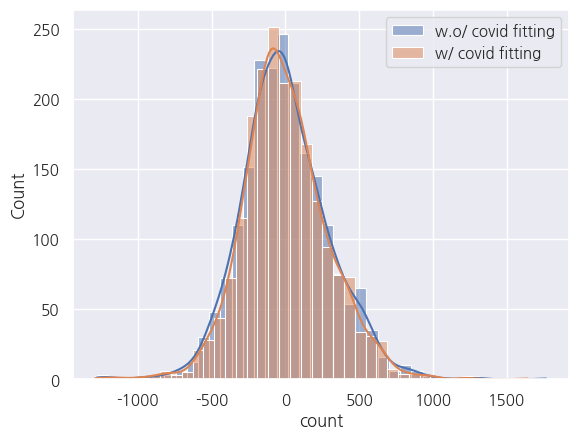

In [95]:
sns.histplot(weekly_bd_resid, label="w.o/ covid fitting", bins=40, kde=True)
sns.histplot(weekly_bd_covid_resid, label="w/ covid fitting", bins=40, kde=True)
plt.legend()
plt.show()

0.0~0.1: -1288 < x < -325, mean: -474.00
0.1~0.2: -325 < x < -220, mean: -266.88
0.2~0.3: -220 < x < -141, mean: -179.33
0.3~0.4: -141 < x < -83, mean: -114.24
0.4~0.5: -83 < x < -23, mean: -55.66
0.5~0.6: -23 < x < 46, mean: 11.93
0.6~0.7: 46 < x < 120, mean: 82.91
0.7~0.8: 120 < x < 222, mean: 166.22
0.8~0.9: 222 < x < 380, mean: 290.61
0.9~1.0: 380 < x < 1642, mean: 537.10


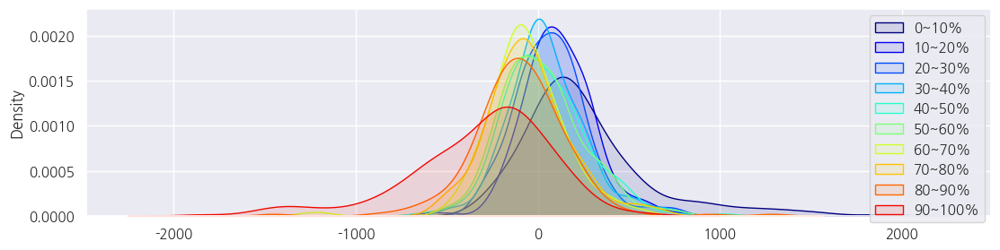

In [96]:
# 전날 대비 변화 분포
# t 시점에 낮은 값이면 t+1 은 높은 값 나올 확률이 평균적으로 높음.
_, ax = plt.subplots(1, 1, figsize=(13, 3))
cmap = plt.get_cmap('jet')
percent_list = np.linspace(0, 0.9, 10)

for percent in percent_list:
    quantile_1 = np.quantile(weekly_bd_covid_resid, percent)
    quantile_2 = np.quantile(weekly_bd_covid_resid, percent + 0.1)
    quantile_dummy = ((quantile_1 < weekly_bd_covid_resid[:-1]) & (weekly_bd_covid_resid[:-1] < quantile_2)).values
    print(
        f"{percent:.1f}~{percent + 0.1:.1f}: {int(quantile_1)} < x < {int(quantile_2)}, mean: {np.mean(weekly_bd_covid_resid[:-1].values[quantile_dummy]):.2f}")
    sns.kdeplot((weekly_bd_covid_resid[1:].values - weekly_bd_covid_resid[:-1].values)[quantile_dummy],
                label=f"{int(percent * 100)}~{int((percent + 0.1) * 100)}%", ax=ax, color=cmap(percent), fill=True,
                alpha=0.1)

plt.legend()
plt.show()

0.0~0.1: -1622 < x < -279, mean: -425.20
0.1~0.2: -279 < x < -176, mean: -219.97
0.2~0.3: -176 < x < -116, mean: -145.14
0.3~0.4: -116 < x < -64, mean: -91.42
0.4~0.5: -64 < x < -22, mean: -43.15
0.5~0.6: -22 < x < 33, mean: 7.15
0.6~0.7: 33 < x < 95, mean: 63.93
0.7~0.8: 95 < x < 162, mean: 127.61
0.8~0.9: 162 < x < 285, mean: 214.24
0.9~1.0: 285 < x < 1679, mean: 445.04


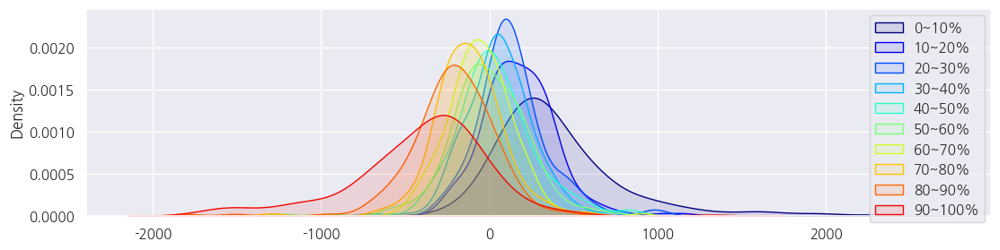

In [97]:
bd_arima_resid = bd_temp - bd_predict.values

# 전날 대비 변화 분포
# t 시점에 낮은 값이면 t+1 은 높은 값 나올 확률이 평균적으로 높음.
_, ax = plt.subplots(1, 1, figsize=(13, 3))
cmap = plt.get_cmap('jet')
percent_list = np.linspace(0, 0.9, 10)

for percent in percent_list:
    quantile_1 = np.quantile(bd_arima_resid, percent)
    quantile_2 = np.quantile(bd_arima_resid, percent + 0.1)
    quantile_dummy = ((quantile_1 < bd_arima_resid[:-1]) & (bd_arima_resid[:-1] < quantile_2)).values
    print(
        f"{percent:.1f}~{percent + 0.1:.1f}: {int(quantile_1)} < x < {int(quantile_2)}, mean: {np.mean(bd_arima_resid[:-1].values[quantile_dummy]):.2f}")
    sns.kdeplot((bd_arima_resid[1:].values - bd_arima_resid[:-1].values)[quantile_dummy],
                label=f"{int(percent * 100)}~{int((percent + 0.1) * 100)}%", ax=ax, color=cmap(percent), fill=True,
                alpha=0.1)

plt.legend()
plt.show()

                                 OLS Regression Results                                
Dep. Variable:                  count   R-squared (uncentered):                   0.166
Model:                            OLS   Adj. R-squared (uncentered):              0.141
Method:                 Least Squares   F-statistic:                              6.579
Date:                Sat, 20 Jan 2024   Prob (F-statistic):                    2.70e-45
Time:                        12:48:09   Log-Likelihood:                         -14240.
No. Observations:                2038   AIC:                                  2.860e+04
Df Residuals:                    1978   BIC:                                  2.894e+04
Df Model:                          60                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

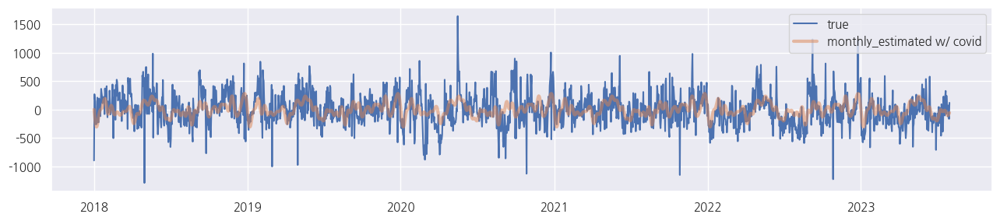

In [98]:
# 월별
fourier_terms = make_fourier_terms(len(bd_temp), 365.25, 30)

monthly_bd_covid_model_fit = sm.OLS(weekly_bd_covid_resid, fourier_terms).fit()
print(monthly_bd_covid_model_fit.summary())

_, ax = plt.subplots(1, 1, figsize=(13, 3))

target_year = None

monthly_bd_covid_y_predict = monthly_bd_covid_model_fit.predict(fourier_terms)
ax.plot(weekly_bd_covid_resid, label="true")
ax.plot(bd_temp.index, monthly_bd_covid_y_predict, label="monthly_estimated w/ covid", alpha=0.5, linewidth=3)

if target_year:
    ax.set_xlim([date(target_year, 1, 1), date(target_year, 12, 31)])
ax.legend(loc=1)

plt.tight_layout()
plt.show()

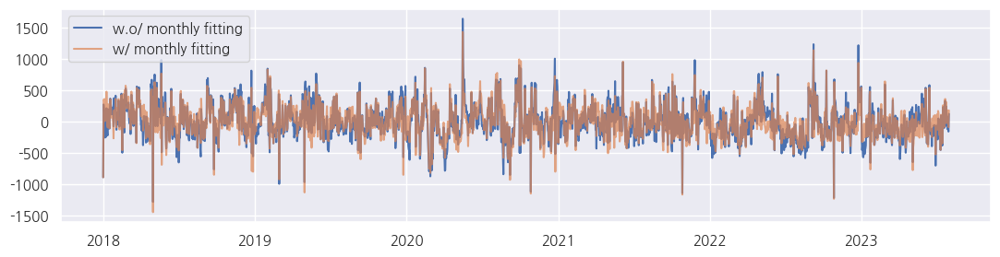

In [99]:
# monthly 제거 후 resid
_, ax = plt.subplots(1, 1, figsize=(13, 3))

monthly_bd_covid_resid = weekly_bd_covid_resid - monthly_bd_covid_y_predict
ax.plot(weekly_bd_covid_resid, label="w.o/ monthly fitting")
ax.plot(monthly_bd_covid_resid, label="w/ monthly fitting", alpha=0.7)
ax.legend()
plt.show()

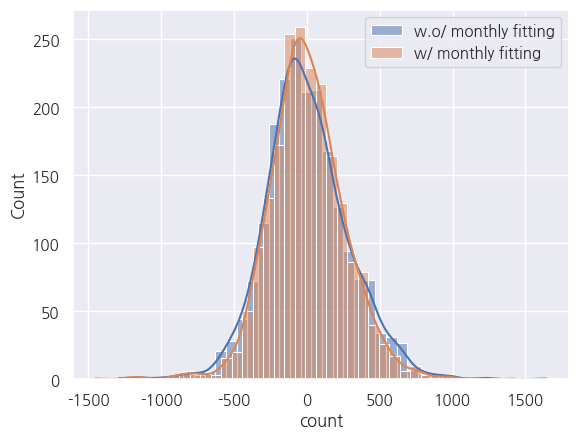

In [100]:
sns.histplot(weekly_bd_covid_resid, label="w.o/ monthly fitting", bins=40, kde=True)
sns.histplot(monthly_bd_covid_resid, label="w/ monthly fitting", bins=40, kde=True)
plt.legend()
plt.show()

[]

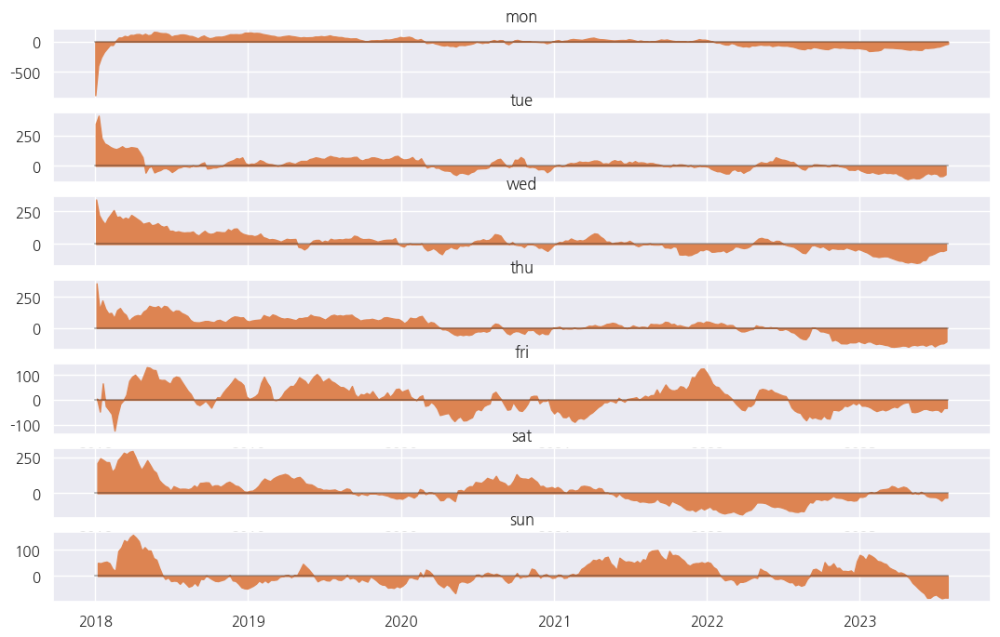

In [101]:
_, axs = plt.subplots(7, 1, figsize=(13, 8))

dow_name_list = ["mon", "tue", "wed", "thu", "fri", "sat", "sun"]

for i, ax in enumerate(axs):
    dow_resid = monthly_bd_covid_resid[monthly_bd_covid_resid.index.dayofweek == i]
    # ax.plot(dow_resid)
    ax.fill_between(dow_resid.index, dow_resid.ewm(alpha=0.05).mean(), color="C1")
    ax.plot([min(monthly_bd_covid_resid.index), max(monthly_bd_covid_resid.index)], [0, 0], color="k", alpha=0.3)

    ax.set_title(dow_name_list[i])
plt.plot()

In [102]:
# w/ or w.o/ covid dummy
n_fourier_terms = 10
fourier_terms = make_fourier_terms(len(bd_temp), 365.25, n_fourier_terms)
# fourier_terms = np.concatenate([np.ones([len(bd_temp), 1]), fourier_terms], axis=1)
monthly_bd_model_fit = sm.OLS(bd_temp, fourier_terms).fit()

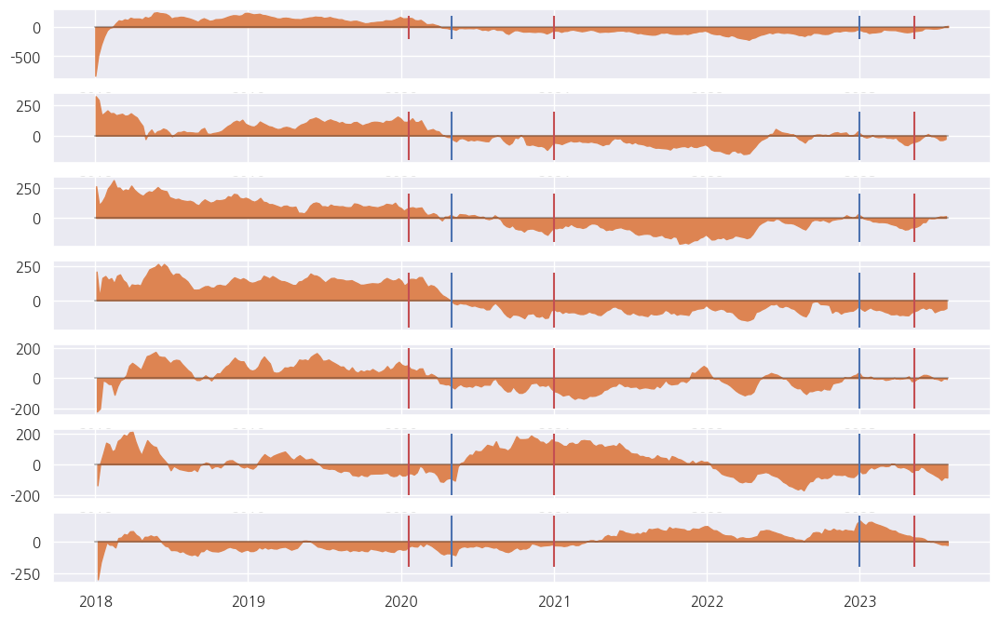

In [103]:
# index.dayofweek # 0: mon
_, axs = plt.subplots(7, 1, figsize=(13, 8))

for i, ax in enumerate(axs):
    dow_resid = weekly_bd_resid[weekly_bd_resid.index.dayofweek == i]
    # ax.plot(dow_resid)
    ax.fill_between(dow_resid.index, dow_resid.ewm(alpha=0.05).mean(), color="C1")
    ax.plot([min(weekly_bd_resid.index), max(weekly_bd_resid.index)], [0, 0], color="k", alpha=0.3)
    ax.vlines(x=date(2020, 1, 20), ymin=-200, ymax=200, color="r")
    ax.vlines(x=date(2021, 1, 1), ymin=-200, ymax=200, color="r")
    ax.vlines(x=date(2023, 5, 11), ymin=-200, ymax=200, color="r")

    ax.vlines(x=date(2020, 5, 1), ymin=-200, ymax=200, color="b")
    ax.vlines(x=date(2023, 1, 1), ymin=-200, ymax=200, color="b")

## frequency 확인

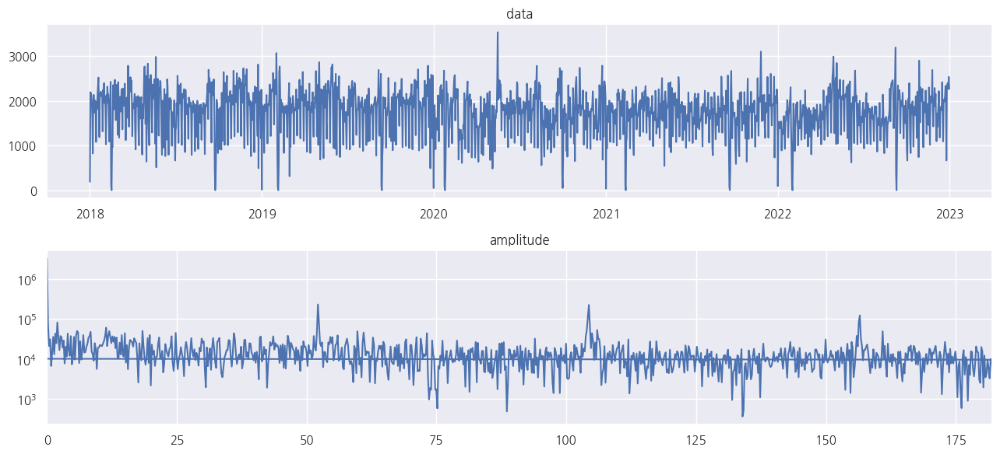

In [104]:
_, axs = plt.subplots(2, 1, figsize=(13, 6))

fft_result = scipy.fft.fft((bd_temp[:1826]).values)
sampling_freq = 1 / 365
x_range = scipy.fft.fftfreq(len(bd_temp[:1826]), sampling_freq)
amp = abs(fft_result)

axs[0].plot((bd_temp[:1826]))
axs[0].set_title("data")

axs[1].plot(x_range, amp)
axs[1].set_title("amplitude")
axs[1].set_yscale("log")

axs[1].set_xlim([0, 365 // 2])

plt.tight_layout()
plt.show()

[   6.99616858    3.49808429    2.33205619    3.50479846    2.33503836
  182.6           6.96946565 1826.            3.49139579   32.03508772
    3.44528302    3.51153846   19.84782609   62.96551724   30.43333333]
[   2    3    6   19   30   32   62  182 1826]


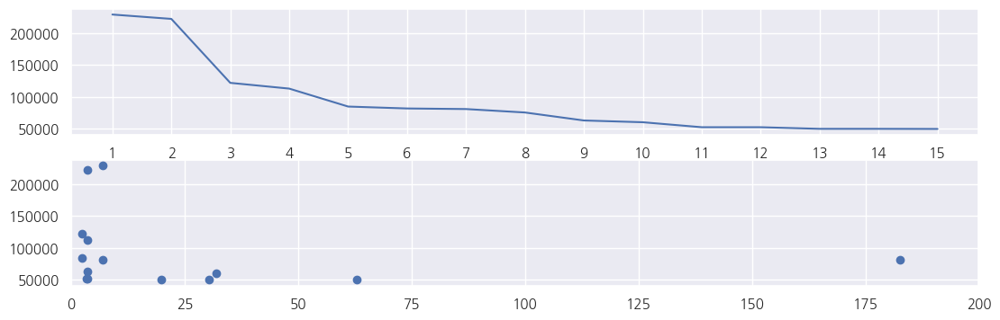

In [105]:
_, axs = plt.subplots(2, 1, figsize=(13, 4))

fft_result_amp = np.column_stack([x_range, amp])
fft_result_amp = fft_result_amp[:len(fft_result_amp) // 2]
fft_result_amp = fft_result_amp[(-fft_result_amp[:, 1]).argsort()]

n_list = 15
axs[0].plot(range(1, n_list + 1), fft_result_amp[1:n_list + 1, 1])
axs[0].set_xticks(range(1, n_list + 1))

axs[1].scatter((fft_result_amp[1:n_list + 1, 0] ** (-1) * 365), fft_result_amp[1:n_list + 1, 1])
axs[1].set_xlim([0, 200])
print((fft_result_amp[1:n_list + 1, 0] ** (-1) * 365))
print(np.unique((fft_result_amp[1:n_list + 1, 0] ** (-1) * 365).astype(int)))

# 7, 3.5, 2.33 값들은 전부 weekly seasonality,

In [106]:
dg_promo_df = promotion_bd_df[promotion_bd_df["region"] == "대구경북"]

dg_promo_dow_oh = np.concatenate([ohe.fit_transform(np.expand_dims(dg_promo_df.index.dayofweek, axis=1)),
                                  np.expand_dims(dg_promo_df["promotion"].values.astype(int), axis=1)],
                                 axis=1)  # measure promotion's coef

dg_promo_bd_model_fit = sm.OLS(dg_promo_df["count"].values, dg_promo_dow_oh).fit()
print(dg_promo_bd_model_fit.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.374
Model:                            OLS   Adj. R-squared:                  0.369
Method:                 Least Squares   F-statistic:                     78.39
Date:                Sat, 20 Jan 2024   Prob (F-statistic):           4.41e-89
Time:                        12:48:15   Log-Likelihood:                -5666.3
No. Observations:                 927   AIC:                         1.135e+04
Df Residuals:                     919   BIC:                         1.139e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1           464.0625     10.339     44.886      0.0

In [107]:
# 요일/휴일 효과 제거한 분포 비교
promo_dow_oh = ohe.fit_transform(np.expand_dims(promotion_bd_df.index.dayofweek, axis=1))

promo_bd_model_fit = sm.OLS(promotion_bd_df["count"].values, promo_dow_oh).fit()
print(promo_bd_model_fit.summary())
promo_bd_resid = promotion_bd_df["count"].values - promo_bd_model_fit.predict(promo_dow_oh)
promotion_bd_df["resid"] = promo_bd_resid

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.121
Model:                            OLS   Adj. R-squared:                  0.121
Method:                 Least Squares   F-statistic:                     318.5
Date:                Sat, 20 Jan 2024   Prob (F-statistic):               0.00
Time:                        12:48:15   Log-Likelihood:                -89491.
No. Observations:               13876   AIC:                         1.790e+05
Df Residuals:                   13869   BIC:                         1.790e+05
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1           348.5147      3.443    101.232      0.0

C:\Users\dgkim\AppData\Local\Temp\ipykernel_13300\2729158152.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_promo_df["year"] = temp_promo_df.index.to_period('Q').copy()


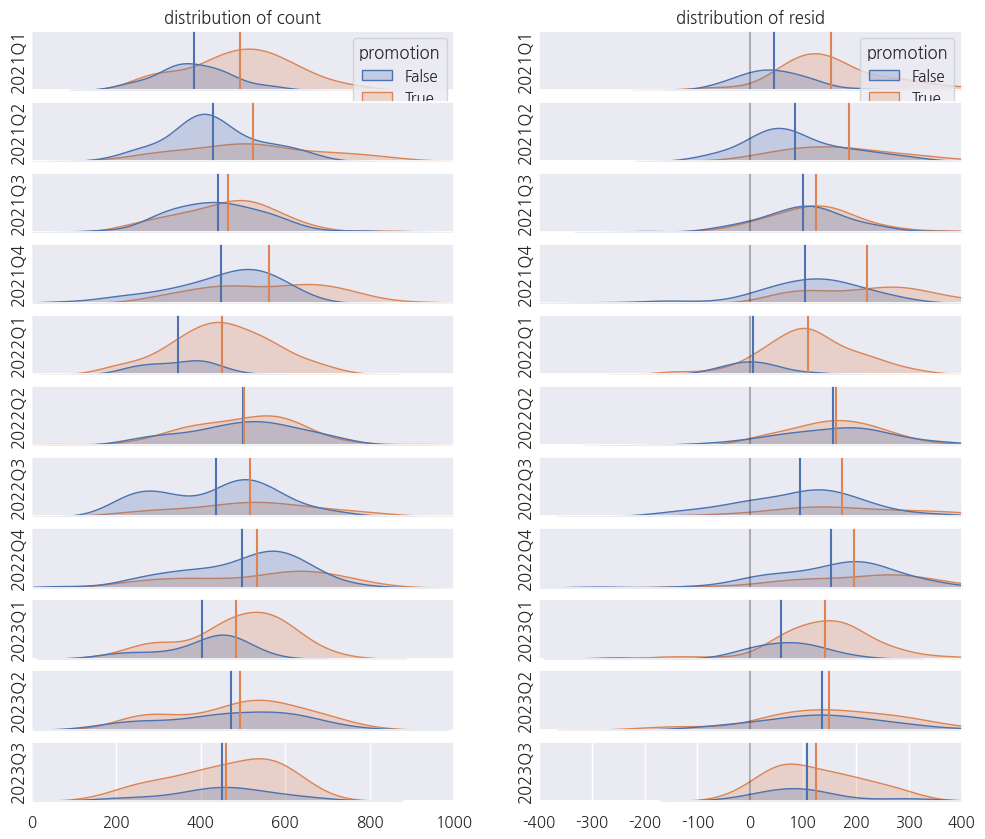

In [108]:
_, axs = plt.subplots(11, 2, figsize=(12, 10))

temp_promo_df = promotion_bd_df[promotion_bd_df["region"] == "대구경북"]
temp_promo_df["year"] = temp_promo_df.index.to_period('Q').copy()

for i, year in enumerate(temp_promo_df["year"].unique()):
    # raw data
    ax_row = axs[i]
    for j, col_name in enumerate(["count", "resid"]):
        sns.kdeplot(temp_promo_df[temp_promo_df["year"] == year], x=col_name, hue="promotion", ax=ax_row[j],
                    legend=True if i == 0 else False, fill=True)
        mean = np.mean(temp_promo_df[(temp_promo_df["year"] == year) & (temp_promo_df["promotion"] == False)][col_name])
        ax_row[j].plot([mean, mean], [0, 0.003 if col_name == "count" else 0.005], color="C0")
        mean = np.mean(temp_promo_df[(temp_promo_df["year"] == year) & (temp_promo_df["promotion"] == True)][col_name])
        ax_row[j].plot([mean, mean], [0, 0.003 if col_name == "count" else 0.005], color="C1")

        ax_row[j].plot([0, 0], [0, 0.003 if col_name == "count" else 0.005], color="k", alpha=0.3)
        ax_row[j].set_xlim([0, 1000] if col_name == "count" else [-400, 400])
        ax_row[j].set_ylim([0, 0.003] if col_name == "count" else [0, 0.005])
        ax_row[j].set_yticks([])
        ax_row[j].set_ylabel(year)
        ax_row[j].set_xlabel("")
        ax_row[j].set_title(f"distribution of {col_name}" if i == 0 else "")
        if i < len(axs) - 1:
            ax_row[j].set_xticks([])

plt.show()

C:\Users\dgkim\AppData\Local\Temp\ipykernel_13300\2848288778.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_promo_df["year"] = temp_promo_df.index.to_period('Q').copy()
C:\Users\dgkim\AppData\Local\Temp\ipykernel_13300\2848288778.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_promo_df["year"] = temp_promo_df.index.to_period('Q').copy()
C:\Users\dgkim\AppData\Local\Temp\ipykernel_13300\2848288778.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFr

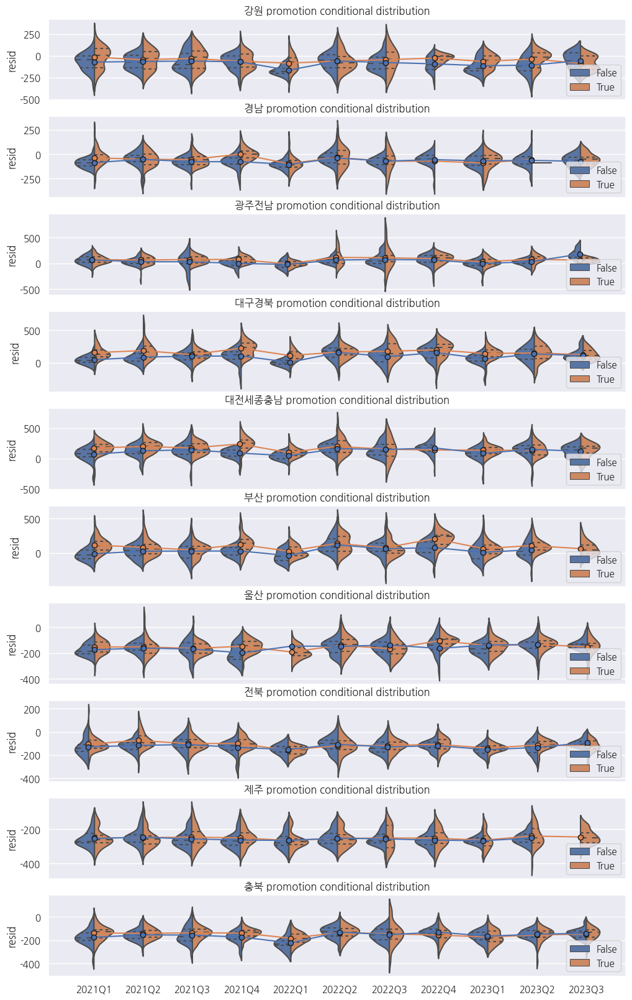

In [109]:
_, axs = plt.subplots(10, 1, figsize=(12, 20))

region_list = ["강원", "경남", "광주전남", "대구경북", "대전세종충남", "부산", "울산", "전북", "제주", "충북"]

for i, (ax, region) in enumerate(zip(axs, region_list)):
    temp_promo_df = promotion_bd_df[promotion_bd_df["region"] == region]
    temp_promo_df["year"] = temp_promo_df.index.to_period('Q').copy()

    sns.violinplot(x="year", y="resid", hue="promotion", data=temp_promo_df, split=True, inner="quart", ax=ax,
                   alpha=0.5)

    # mean of with promotion
    promo_mean = temp_promo_df.groupby(by=["year", "promotion"])["resid"].mean()
    ax.plot(promo_mean.xs(True, level="promotion").values, marker="o", color="C1", mec="k")
    ax.plot(promo_mean.xs(False, level="promotion").values, marker="o", color="C0", mec="k")

    ax.set_title(f"{region} promotion conditional distribution")
    ax.legend(loc=4)
    ax.set_xlabel("")
    if i < len(axs) - 1:
        ax.set_xticks([])
plt.show()

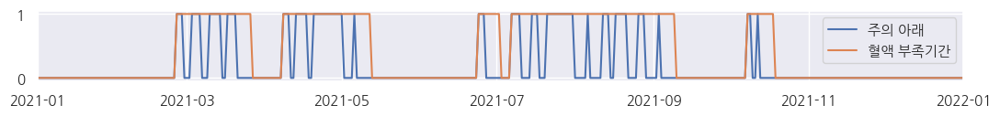

In [217]:
_, ax = plt.subplots(1, 1, figsize=(13, 1))

crisis_lack_dummy = pd.concat(
    [(bd_crisis_status < 3)] + [(bd_crisis_status < 3).shift(i, fill_value=0).astype(int) for i in range(1, 7)],
    axis=1).sum(axis=1)
crisis_lack_dummy = crisis_lack_dummy.apply(lambda x: min(x, 1))

ax.plot(bd_crisis_status < 3, label="주의 아래")
ax.plot(crisis_lack_dummy, label="혈액 부족기간")
ax.set_xlim([date(2021, 1, 1), date(2022, 1, 1)])
ax.legend()
plt.show()

In [265]:
n_fourier_terms = 5
fourier_terms = make_fourier_terms(len(bd_temp), 365.25, n_fourier_terms)

fourier_columns = []
for i in range(1, n_fourier_terms+1):
    fourier_columns.append(f"sin_{i}")
    fourier_columns.append(f"cos_{i}")
print(fourier_columns)

['sin_1', 'cos_1', 'sin_2', 'cos_2', 'sin_3', 'cos_3', 'sin_4', 'cos_4', 'sin_5', 'cos_5']


In [266]:
# 보유상태 -> 공급량
bd_temp = daily_bd_df[(daily_bd_df["method"].isin(["전혈 400ml", "전혈 320ml"])) & (daily_bd_df["gender"] == "남")] \
    .groupby(by="date")["count"].sum().reindex(complete_date_range).fillna(0)

poly = PolynomialFeatures(2, include_bias=False)
bd_dg_exog_vars = np.concatenate([bd_exog_vars, np.expand_dims(crisis_lack_dummy, axis=1)], axis=1)
bd_dg_exog_vars = pd.DataFrame(bd_dg_exog_vars,
                               columns=["mon", "tue", "wed", "thu", "fri", "sat", "sun", "holiday", "missing",
                                        "crisis"], index=bd_temp.index)

covid_period = (("2020-01-20" < bd_group.index) & (bd_group.index < "2022-03-01")).astype(int)
weekday_weekend = np.concatenate([np.sum(bd_exog_vars[:, :5], axis=1).reshape(-1, 1), bd_exog_vars[:, 5:7]], axis=1)
covid_effects = np.multiply(np.expand_dims(covid_period, axis=1), weekday_weekend)
covid_effects_df = pd.DataFrame(covid_effects, columns=["cov_weekday", "cov_sat", "cov_sun"],
                                index=bd_dg_exog_vars.index)

fourier_terms_df = pd.DataFrame(fourier_terms, columns=fourier_columns, index=bd_dg_exog_vars.index)

bd_dg_model_fit = sm.OLS(bd_temp, pd.concat([bd_dg_exog_vars, covid_effects_df, fourier_terms_df], axis=1)).fit()
print(bd_dg_model_fit.summary())

                            OLS Regression Results                            
Dep. Variable:                  count   R-squared:                       0.679
Model:                            OLS   Adj. R-squared:                  0.675
Method:                 Least Squares   F-statistic:                     193.7
Date:                Mon, 25 Mar 2024   Prob (F-statistic):               0.00
Time:                        16:15:04   Log-Likelihood:                -15875.
No. Observations:                2038   AIC:                         3.180e+04
Df Residuals:                    2015   BIC:                         3.192e+04
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
mon          4103.7398     37.006    110.894      

In [267]:
print(
    f"감소한 헌혈자 비율: {((bd_dg_model_fit.params.values[10] * 5) + np.sum(bd_dg_model_fit.params.values[11:13])) / np.sum(bd_dg_model_fit.params.values[:7]):.2%}")

감소한 헌혈자 비율: -4.67%


In [268]:
# 보유상태 -> 사용량

bu_temp = np.sum(daily_bu_df.values, axis=1).reshape(-1, 1)

bu_model_fit = sm.OLS(bu_temp, pd.concat([bd_dg_exog_vars, covid_effects_df, fourier_terms_df], axis=1)).fit()
print(bu_model_fit.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.902
Model:                            OLS   Adj. R-squared:                  0.901
Method:                 Least Squares   F-statistic:                     841.7
Date:                Mon, 25 Mar 2024   Prob (F-statistic):               0.00
Time:                        16:15:13   Log-Likelihood:                -15681.
No. Observations:                2038   AIC:                         3.141e+04
Df Residuals:                    2015   BIC:                         3.154e+04
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
mon          6575.8416     33.660    195.361      

In [246]:
print(
    f"감소한 사용량 비율: {((bu_model_fit.params.values[10] * 5) + np.sum(bu_model_fit.params.values[11:13])) / np.sum(bu_model_fit.params.values[:7]):.2%}")

감소한 사용량 비율: -4.26%


In [283]:
weather_df[weather_df["location"] == "강원"][["temp", "rainfall"]].reindex(bd_dg.index).fillna(0)

,temp,rainfall
date,,
2018-01-01,-4.5,0.0
2018-01-02,-3.5,0.0
2018-01-03,-5.6,0.0
2018-01-04,-6.1,0.0
2018-01-05,-4.2,0.0
...,...,...
2023-07-27,27.7,0.1
2023-07-28,28.0,0.0
2023-07-29,27.9,0.0


In [292]:
# 기상
weather_model_result_list = []
region_list = list(daily_bd_df["region"].unique())
for region in region_list:
    if region[:2] == "서울":
        region_location = "서울"
    else:
        region_location = region
    bd_dg = daily_bd_df[(daily_bd_df["region"] == region) & (
            (daily_bd_df["method"] == "전혈 320ml") | (daily_bd_df["method"] == "전혈 400ml"))] \
        .groupby(by="date")["count"].sum().reindex(complete_date_range).fillna(0)

    weather_temp = weather_df[weather_df["location"] == region_location][["temp", "rainfall"]].reindex(bd_dg.index).fillna(0)

    poly = PolynomialFeatures(2, include_bias=False)
    # weather_poly_exog = poly.fit_transform(weather_temp.values)  # temp, rainfall, temp^2, temp*rainfall, rainfall^2
    bd_dg_exog_vars = np.concatenate([bd_exog_vars, weather_temp.values], axis=1)
    bd_dg_exog_vars = pd.DataFrame(bd_dg_exog_vars,
                                   columns=["mon", "tue", "wed", "thu", "fri", "sat", "sun", "holiday", "missing", "temp",
                                            "rain"], index=bd_dg.index)

    bd_dg_model_fit = sm.OLS(bd_dg, bd_dg_exog_vars).fit()
    # print(bd_dg_model_fit.summary())
    region_weather_dict = {
        "region": region,
        "temp_coef": bd_dg_model_fit.params.values[-2],
        "rain_coef": bd_dg_model_fit.params.values[-1],
        "temp_pval": bd_dg_model_fit.pvalues.values[-2],
        "rain_pval": bd_dg_model_fit.pvalues.values[-1]
    }

    weather_model_result_list.append(region_weather_dict)
pd.DataFrame(weather_model_result_list)

[{'region': '강원', 'temp_coef': 0.2806108636269676, 'rain_coef': -0.227195798403223, 'temp_pval': 0.11389513209024266, 'rain_pval': 0.11151325035394576}, {'region': '부산', 'temp_coef': 0.5714615727074401, 'rain_coef': -0.8966885163452403, 'temp_pval': 0.10241697586550642, 'rain_pval': 2.6068844757364458e-08}, {'region': '서울동부', 'temp_coef': -1.9904315925596212, 'rain_coef': -1.044897206677163, 'temp_pval': 1.8325533656138793e-15, 'rain_pval': 1.0248193197414388e-07}, {'region': '제주', 'temp_coef': 0.28570981860333894, 'rain_coef': -0.16307995923194318, 'temp_pval': 0.0004866232236579019, 'rain_pval': 9.392934087312997e-06}, {'region': '충북', 'temp_coef': 0.4628858590345656, 'rain_coef': -0.2540158284046948, 'temp_pval': 6.799957736440212e-05, 'rain_pval': 0.004758157890953448}, {'region': '경기', 'temp_coef': -0.6321414563742462, 'rain_coef': -0.6401039337825435, 'temp_pval': 0.009465631308400009, 'rain_pval': 0.00016858046071050156}, {'region': '경남', 'temp_coef': 0.020645880127774283, 'rain

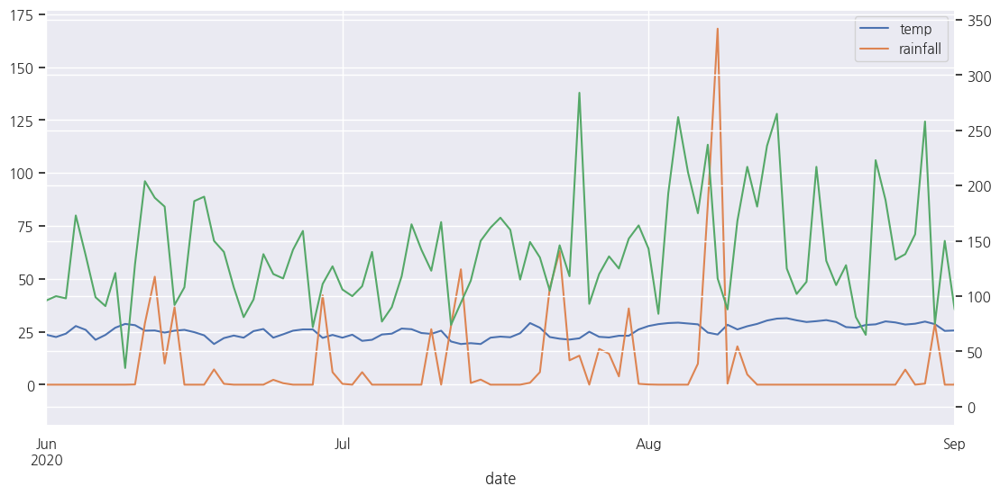

In [112]:
_, ax = plt.subplots(1, 1, figsize=(13, 6))
weather_df.plot(ax=ax)
ax.legend()
twin_ax = ax.twinx()
twin_ax.plot(bd_dg, color="C2")
twin_ax.set_xlim([date(2020, 6, 1), date(2020, 9, 1)])
plt.show()

## 정규화 + 지역별 계수비교

2018-01-01    0
2018-01-02    0
2018-01-03    0
2018-01-04    0
2018-01-05    0
             ..
2023-07-27    0
2023-07-28    0
2023-07-29    0
2023-07-30    0
2023-07-31    0
Freq: D, Name: crisis, Length: 2038, dtype: int64

In [319]:
from sklearn.preprocessing import StandardScaler

std_scaler = StandardScaler()

region_list = list(daily_bd_df["region"].unique())
bs_std = bs_temp.rename("stock").reset_index(drop=True)
bs_std.update(std_scaler.fit_transform(bs_std.values.reshape(-1, 1)).reshape(-1))

region_model_fit_dict = {}
for region in region_list:
    conditions = (daily_bd_df["region"] == region) & (
            (daily_bd_df["method"] == "전혈 320ml") | (daily_bd_df["method"] == "전혈 400ml"))
    bd_region = daily_bd_df[conditions].groupby(by="date")["count"].sum().reindex(complete_date_range).fillna(0)
    bd_region = std_scaler.fit_transform(bd_region.values.reshape(-1, 1))

    crisis_dummy_df = pd.Series(crisis_lack_dummy, index=bd_dg.index, name="crisis")
    bd_exog_vars_df = pd.DataFrame(bd_exog_vars, index=bd_dg.index, columns=["mon", "tue", "wed", "thu", "fri", "sat", "sun", "holiday", "missing"])
    if region[:2] == "서울":
        region_name = "서울"
    else:
        region_name = region
    region_weather_df = weather_df[weather_df["location"] == region_name][["temp", "rainfall"]].reindex(bd_dg.index).fillna(0)
    region_model_fit = sm.OLS(bd_region, pd.concat([bd_exog_vars_df, crisis_dummy_df, covid_effects_df, fourier_terms_df, region_weather_df], axis=1)).fit()
    # region_model_fit = sm.OLS(bd_region, pd.concat([bd_exog_vars_df, covid_effects_df, bs_std], axis=1)).fit()
    region_model_fit_dict[region] = region_model_fit

region_coef_list = list(map(lambda item: item[1].params.rename(item[0]), region_model_fit_dict.items()))
region_p_value_list = list(map(lambda item: item[1].pvalues.rename(item[0]), region_model_fit_dict.items()))

In [320]:
pd.concat(region_p_value_list, axis=1).iloc[:13]

,강원,부산,서울동부,제주,충북,경기,경남,광주전남,대구경북,대전세종충남,서울남부,서울중앙,울산,인천,전북
mon,7.125753e-22,8.204819e-03,3.185611e-05,1.913069e-01,2.565353e-08,2.089193e-06,1.564307e-07,5.545356e-03,9.714776e-05,2.653573e-04,7.492412e-17,1.868477e-05,1.896236e-08,5.138850e-05,7.323773e-11
tue,1.768405e-18,1.872910e-02,3.806869e-05,3.222360e-01,1.067402e-07,6.496192e-03,4.502265e-05,5.759360e-02,2.094380e-03,1.456428e-02,4.053217e-12,4.687902e-04,9.763325e-04,1.089621e-02,7.035171e-04
wed,3.283675e-17,7.274630e-02,4.145834e-06,6.496434e-01,5.395938e-11,1.703816e-03,1.993699e-07,2.036608e-03,6.536446e-05,2.333692e-05,2.228357e-13,1.296717e-05,5.751961e-05,1.127716e-02,3.503791e-08
thu,2.619220e-20,1.502631e-02,5.302302e-06,1.210029e-01,3.518253e-11,5.493044e-02,1.312452e-06,1.095958e-03,2.475422e-04,1.453973e-01,8.288712e-14,1.248915e-04,5.095951e-04,3.390915e-02,6.235513e-09
fri,3.138853e-42,1.416419e-08,1.579225e-27,1.822617e-05,2.535959e-26,8.644161e-22,3.660366e-14,6.545894e-16,5.425243e-16,5.316631e-19,9.512134e-38,3.590644e-29,3.751275e-13,8.956080e-24,2.384990e-24
sat,1.026603e-18,3.403587e-05,8.051317e-03,2.957914e-10,9.386026e-01,4.330788e-02,8.461997e-01,2.454218e-01,3.912158e-02,7.601622e-01,1.011675e-01,4.263712e-10,8.225881e-10,9.071726e-03,4.931934e-02
sun,5.782967e-100,2.838827e-03,1.378901e-24,2.271019e-15,1.848762e-42,1.003872e-33,3.179399e-39,1.657282e-18,6.562833e-17,2.516567e-57,4.098441e-24,9.443044e-23,4.147428e-11,4.117301e-14,3.202139e-43
holiday,6.278161e-98,1.272338e-17,1.820877e-51,1.682880e-36,1.898586e-54,5.701496e-101,4.576817e-80,1.237351e-66,5.227370e-45,4.385530e-68,6.366790e-72,3.950668e-70,7.970272e-58,7.520596e-58,8.839238e-62
missing,2.431222e-08,5.374131e-19,7.788416e-44,1.899490e-10,2.294274e-12,3.984879e-16,5.918076e-06,1.418859e-11,3.679236e-20,1.100968e-15,4.765006e-18,1.683418e-15,1.957620e-09,5.658367e-13,9.726114e-09
crisis,4.575597e-03,1.072351e-01,8.503150e-05,9.983089e-01,2.085150e-02,1.800976e-02,9.736438e-02,4.192587e-02,2.190130e-03,5.844625e-07,8.266876e-05,5.315543e-02,9.517596e-01,1.147272e-03,4.920889e-04


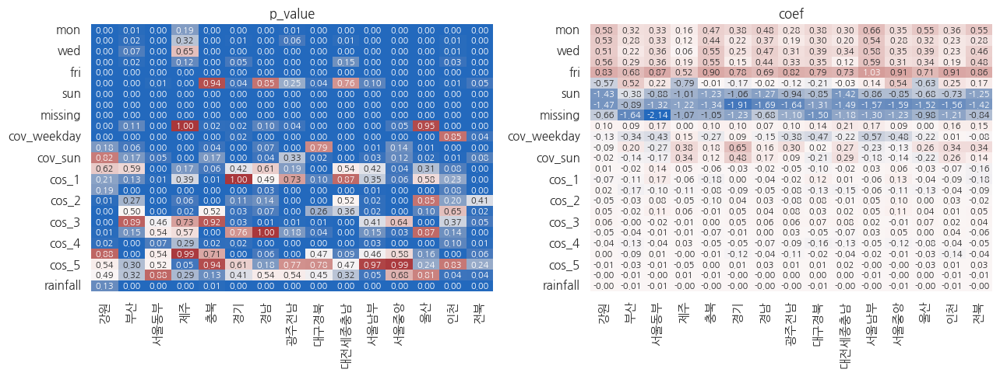

In [322]:
_, axs = plt.subplots(1, 2, figsize=(13, 5))
sns.heatmap(pd.concat(region_p_value_list, axis=1), annot=True, fmt=".2f", annot_kws={"fontsize": 8}, cbar=False,
            cmap="vlag", vmin=0, vmax=1, ax=axs[0])
axs[0].set_title("p_value")
sns.heatmap(pd.concat(region_coef_list, axis=1), annot=True, fmt=".2f", annot_kws={"fontsize": 8}, cbar=False,
            cmap="vlag", center=0, ax=axs[1])
axs[1].set_title("coef")
plt.tight_layout()
plt.show()

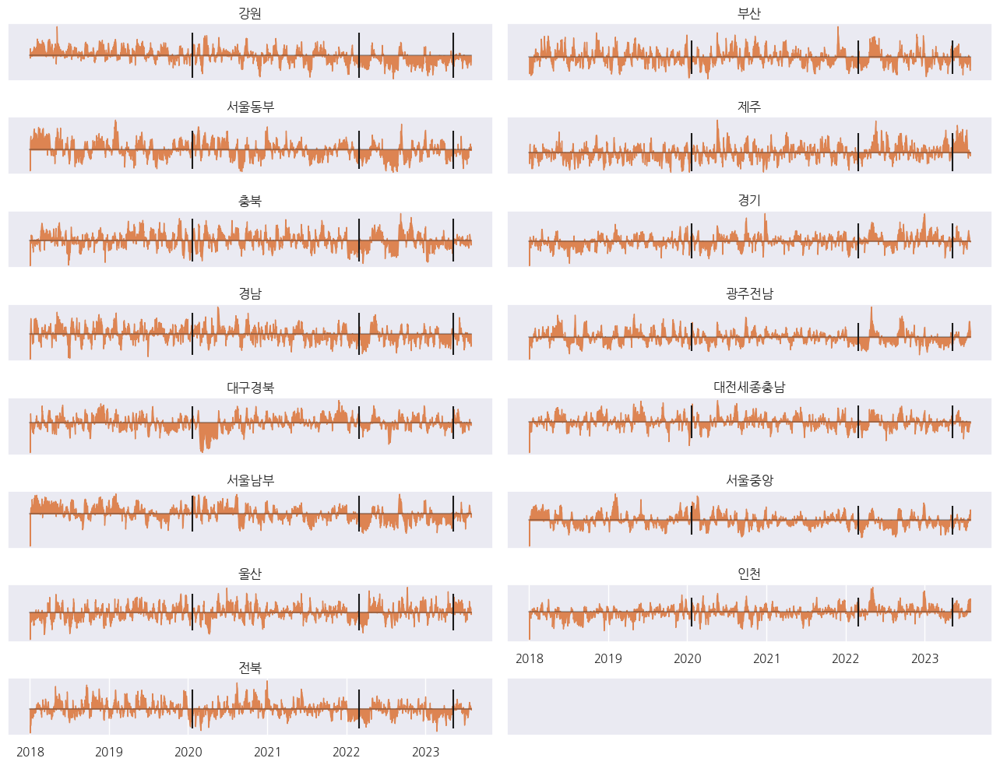

In [192]:
_, axs = plt.subplots(len(region_list) // 2 + 1, 2, figsize=(13, 10))

for i, (ax, region) in enumerate(zip(axs.flatten()[:-1], region_list)):
    ax.fill_between(bd_temp.index, region_model_fit_dict[region].resid.ewm(3).mean(), color="C1")
    ax.plot([min(bd_temp.index), max(bd_temp.index)], [0, 0], color="k", alpha=0.3)
    ax.set_title(region)
    ax.vlines(x=date(2020, 1, 20), ymin=-1, ymax=1, color="k")  # 판데믹 선언
    ax.vlines(x=date(2022, 3, 1), ymin=-1, ymax=1, color="k")  # 방역패스 해지
    ax.vlines(x=date(2023, 5, 11), ymin=-1, ymax=1, color="k")  # 비상사태 종료
    if i < len(region_list) - 2:
        ax.set_xticks([])
    ax.set_yticks([])
axs.flatten()[-1].set_xticks([])
axs.flatten()[-1].set_yticks([])

# for ax in axs[:5]:
#     ax.vlines(x=date(2020, 4, 15), ymin=-1, ymax=1, color="b") # week days (본격 확산 시작~)
#
# axs[5].vlines(x=date(2020, 5, 15), ymin=-1, ymax=1, color="b") # saturday (긴급재난지원금~)
# axs[5].vlines(x=date(2021, 12, 15), ymin=-1, ymax=1, color="b") # saturday (3차접종 ~)
#
# axs[6].vlines(x=date(2021, 4, 15), ymin=-1, ymax=1, color="b") # sunday (~예방접종 예약)

plt.tight_layout()
plt.show()

충북


D:\OneDrive\local\workspace\blood_donation\venv\lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
D:\OneDrive\local\workspace\blood_donation\venv\lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


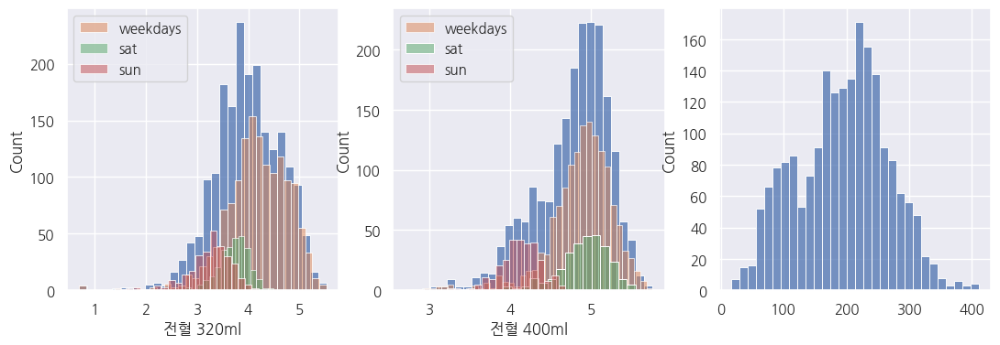

In [168]:
region = region_list[4]
print(region)
conditions = (daily_bd_df["region"] == region) & (
            (daily_bd_df["method"] == "전혈 320ml") | (daily_bd_df["method"] == "전혈 400ml"))

bd_region = daily_bd_df[conditions].groupby(by=["date", "method"])["count"].sum().reset_index().pivot(index="date",
                                                                                                      columns="method",
                                                                                                      values="count")

_, axs = plt.subplots(1, 3, figsize=(13, 4))

sns.histplot(np.log(bd_region["전혈 320ml"]), ax=axs[0], bins=30)
sns.histplot(np.log(bd_region["전혈 320ml"][bd_region.index.dayofweek < 5]), ax=axs[0], label="weekdays", alpha=0.5)
sns.histplot(np.log(bd_region["전혈 320ml"][bd_region.index.dayofweek == 5]), ax=axs[0], label="sat", alpha=0.5)
sns.histplot(np.log(bd_region["전혈 320ml"][bd_region.index.dayofweek == 6]), ax=axs[0], label="sun", alpha=0.5)

sns.histplot(np.log(bd_region["전혈 400ml"]), ax=axs[1], bins=30)
sns.histplot(np.log(bd_region["전혈 400ml"][bd_region.index.dayofweek < 5]), ax=axs[1], label="weekdays", alpha=0.5)
sns.histplot(np.log(bd_region["전혈 400ml"][bd_region.index.dayofweek == 5]), ax=axs[1], label="sat", alpha=0.5)
sns.histplot(np.log(bd_region["전혈 400ml"][bd_region.index.dayofweek == 6]), ax=axs[1], label="sun", alpha=0.5)

sns.histplot(bd_region.sum(axis=1), ax=axs[2], bins=30)
axs[0].legend()
axs[1].legend()

광주전남


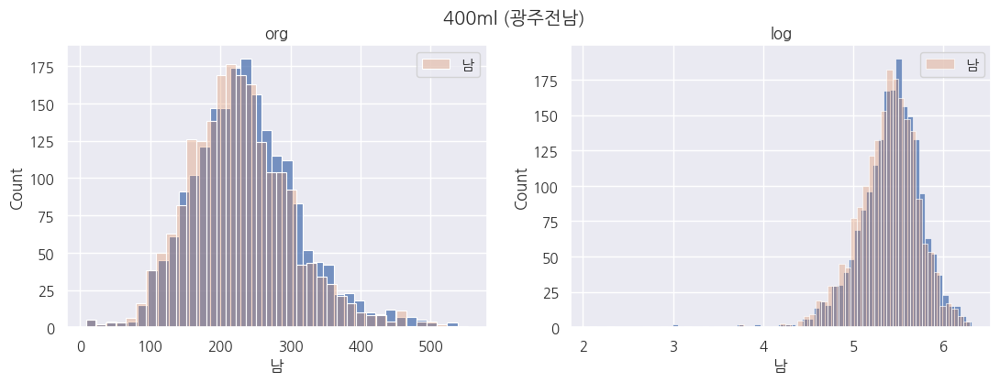

In [161]:
fig, axs = plt.subplots(1, 2, figsize=(13, 4))

region = region_list[7]
print(region)
bd_region = daily_bd_df[
    (daily_bd_df["region"] == region) & (daily_bd_df["method"] == "전혈 400ml")].groupby(
    by=["date", "gender"])["count"].sum().reset_index().pivot(index="date", columns="gender", values="count")

sns.histplot(bd_region.sum(axis=1), ax=axs[0])
sns.histplot(bd_region["남"], label="남", alpha=0.3, ax=axs[0])
# sns.histplot(bd_region["여"], label="여", alpha=0.3, ax=axs[0])
axs[0].set_title("org")
axs[0].legend()

sns.histplot(np.log(bd_region.sum(axis=1)), ax=axs[1])
sns.histplot(np.log(bd_region["남"]), label="남", alpha=0.3, ax=axs[1])
# sns.histplot(np.log(bd_region["여"]), label="여", alpha=0.3, ax=axs[1])
axs[1].set_title("log")
axs[1].legend()

fig.suptitle(f"400ml ({region})")
plt.show()

서울중앙


D:\OneDrive\local\workspace\blood_donation\venv\lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
D:\OneDrive\local\workspace\blood_donation\venv\lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


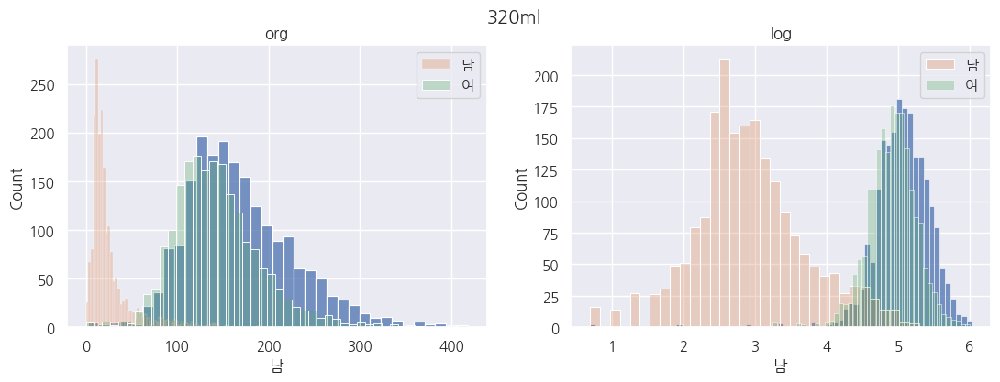

In [144]:
fig, axs = plt.subplots(1, 2, figsize=(13, 4))

region = region_list[11]
print(region)
bd_region = daily_bd_df[
    (daily_bd_df["region"] == region) & (daily_bd_df["method"] == "전혈 320ml")].groupby(
    by=["date", "gender"])["count"].sum().reset_index().pivot(index="date", columns="gender", values="count")

# bd_region.sum(axis=1)
sns.histplot(bd_region.sum(axis=1), ax=axs[0])
sns.histplot(bd_region["남"], label="남", alpha=0.3, ax=axs[0])
sns.histplot(bd_region["여"], label="여", alpha=0.3, ax=axs[0])
axs[0].set_title("org")
axs[0].legend()

sns.histplot(np.log(bd_region.sum(axis=1)), ax=axs[1])
sns.histplot(np.log(bd_region["남"]), label="남", alpha=0.3, ax=axs[1])
sns.histplot(np.log(bd_region["여"]), label="여", alpha=0.3, ax=axs[1])
axs[1].set_title("log")
axs[1].legend()

fig.suptitle("320ml")
plt.show()

  0%|          | 0/15 [00:00<?, ?it/s]

                                     SARIMAX Results                                     
Dep. Variable:                             count   No. Observations:                 1826
Model:             ARIMA(3, 0, 3)x(1, 0, [1], 7)   Log Likelihood               -1488.667
Date:                           Sat, 20 Jan 2024   AIC                           3027.334
Time:                                   13:14:12   BIC                           3165.081
Sample:                               01-01-2018   HQIC                          3078.145
                                    - 12-31-2022                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
mon            4.2692      0.060     71.476      0.000       4.152       4.386
tue            4.3041      0.047     91.344

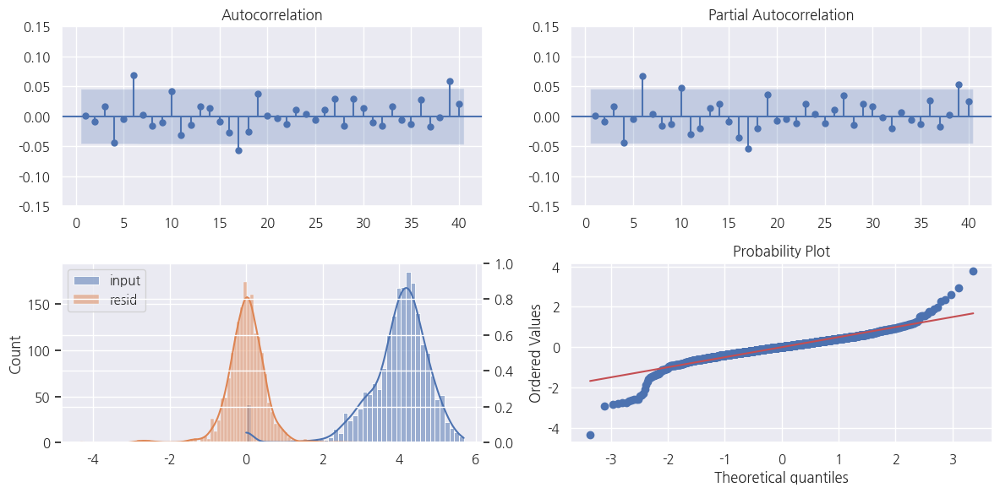

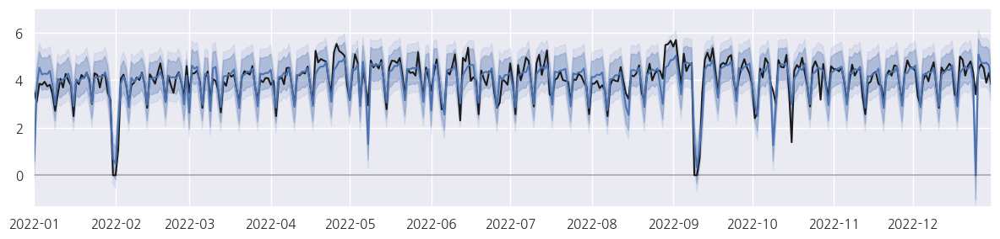

  7%|▋         | 1/15 [00:10<02:31, 10.80s/it]

                                     SARIMAX Results                                     
Dep. Variable:                             count   No. Observations:                 1826
Model:             ARIMA(3, 0, 3)x(1, 0, [1], 7)   Log Likelihood                -998.519
Date:                           Sat, 20 Jan 2024   AIC                           2047.037
Time:                                   13:14:20   BIC                           2184.784
Sample:                               01-01-2018   HQIC                          2097.848
                                    - 12-31-2022                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
mon            5.0986      0.043    119.925      0.000       5.015       5.182
tue            5.0743      0.043    116.781

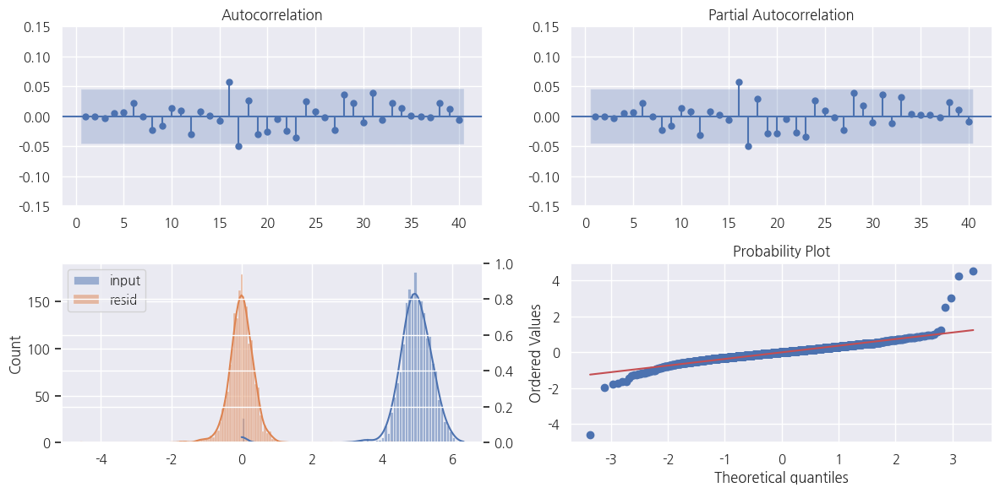

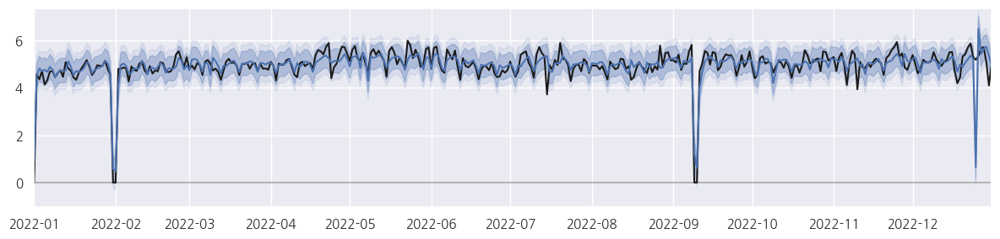

 13%|█▎        | 2/15 [00:18<01:53,  8.76s/it]

                                     SARIMAX Results                                     
Dep. Variable:                             count   No. Observations:                 1826
Model:             ARIMA(3, 0, 3)x(1, 0, [1], 7)   Log Likelihood                -492.118
Date:                           Sat, 20 Jan 2024   AIC                           1034.235
Time:                                   13:14:27   BIC                           1171.982
Sample:                               01-01-2018   HQIC                          1085.046
                                    - 12-31-2022                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
mon            5.2741      0.032    167.251      0.000       5.212       5.336
tue            5.3179      0.029    182.830

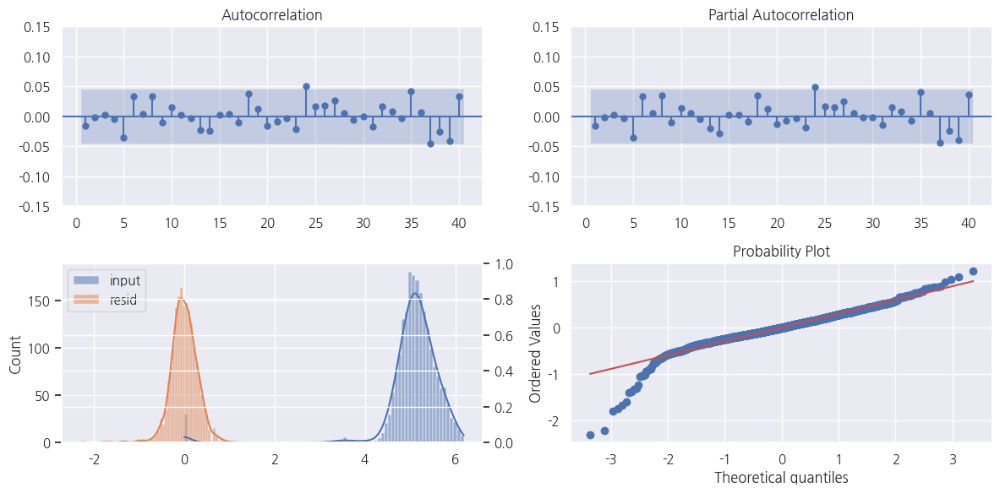

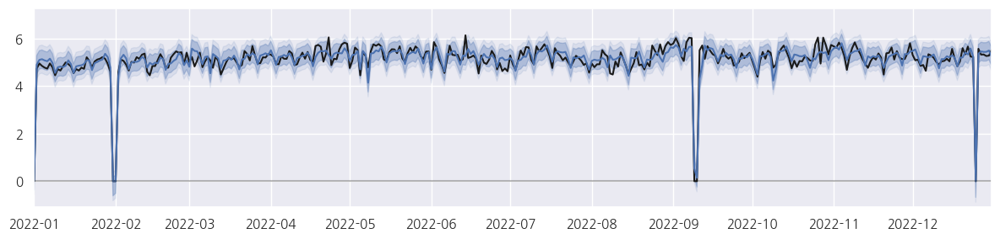

 20%|██        | 3/15 [00:25<01:35,  7.99s/it]

                                     SARIMAX Results                                     
Dep. Variable:                             count   No. Observations:                 1826
Model:             ARIMA(3, 0, 3)x(1, 0, [1], 7)   Log Likelihood               -1795.498
Date:                           Sat, 20 Jan 2024   AIC                           3640.996
Time:                                   13:14:34   BIC                           3778.743
Sample:                               01-01-2018   HQIC                          3691.807
                                    - 12-31-2022                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
mon            3.4401      0.049     69.618      0.000       3.343       3.537
tue            3.4351      0.048     71.430

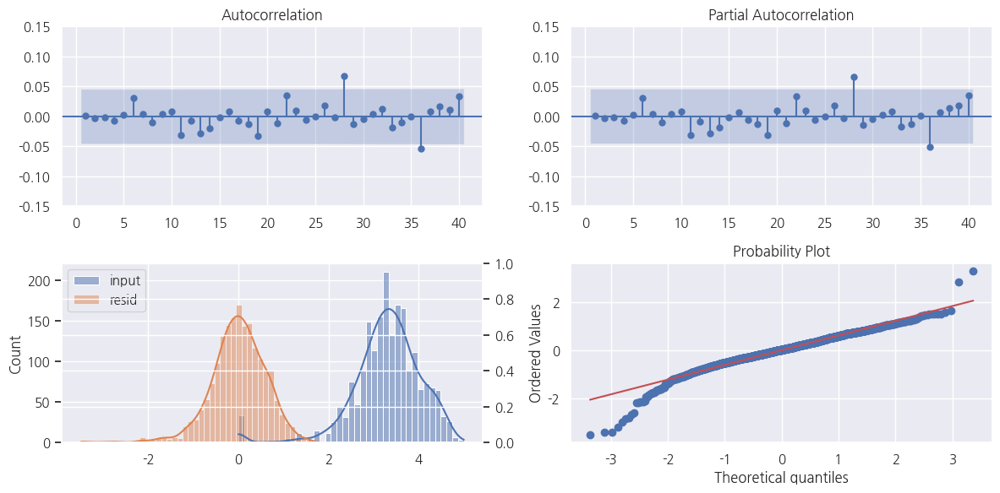

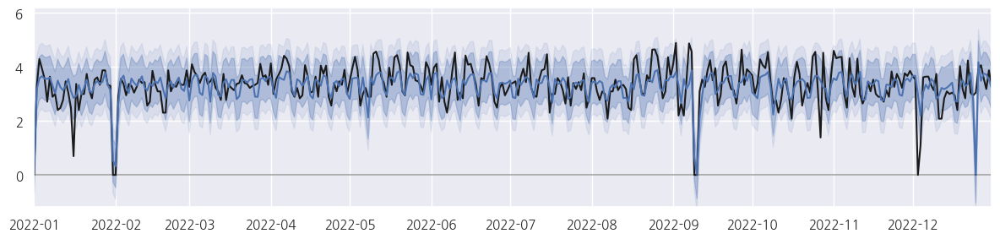

 27%|██▋       | 4/15 [00:32<01:25,  7.76s/it]

                                     SARIMAX Results                                     
Dep. Variable:                             count   No. Observations:                 1826
Model:             ARIMA(3, 0, 3)x(1, 0, [1], 7)   Log Likelihood               -1473.751
Date:                           Sat, 20 Jan 2024   AIC                           2997.502
Time:                                   13:14:41   BIC                           3135.249
Sample:                               01-01-2018   HQIC                          3048.313
                                    - 12-31-2022                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
mon            4.1630      0.060     69.131      0.000       4.045       4.281
tue            4.2083      0.052     80.176

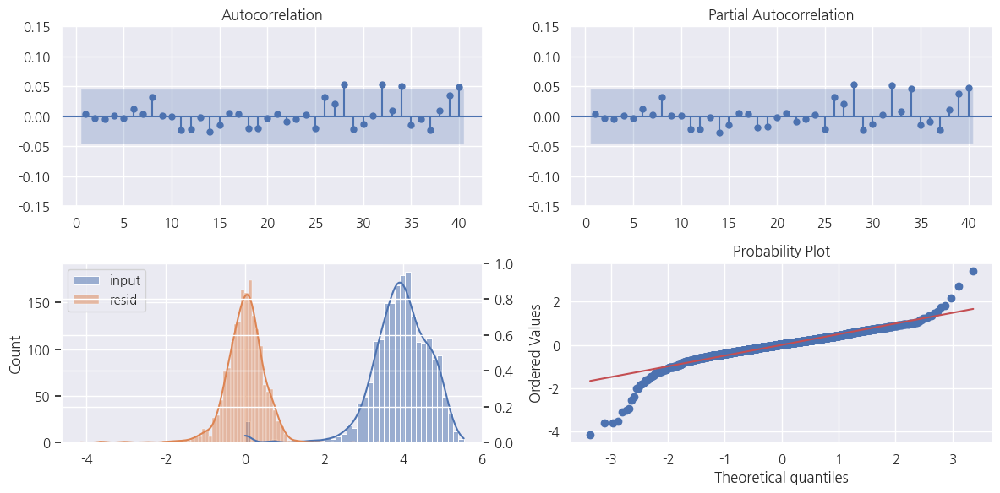

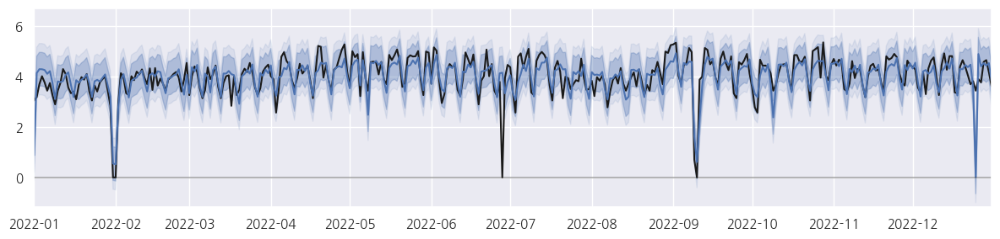

 33%|███▎      | 5/15 [00:39<01:15,  7.52s/it]

                                     SARIMAX Results                                     
Dep. Variable:                             count   No. Observations:                 1826
Model:             ARIMA(3, 0, 3)x(1, 0, [1], 7)   Log Likelihood               -1817.612
Date:                           Sat, 20 Jan 2024   AIC                           3685.224
Time:                                   13:14:48   BIC                           3822.971
Sample:                               01-01-2018   HQIC                          3736.035
                                    - 12-31-2022                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
mon            5.1961      0.069     74.983      0.000       5.060       5.332
tue            5.1092      0.059     86.321

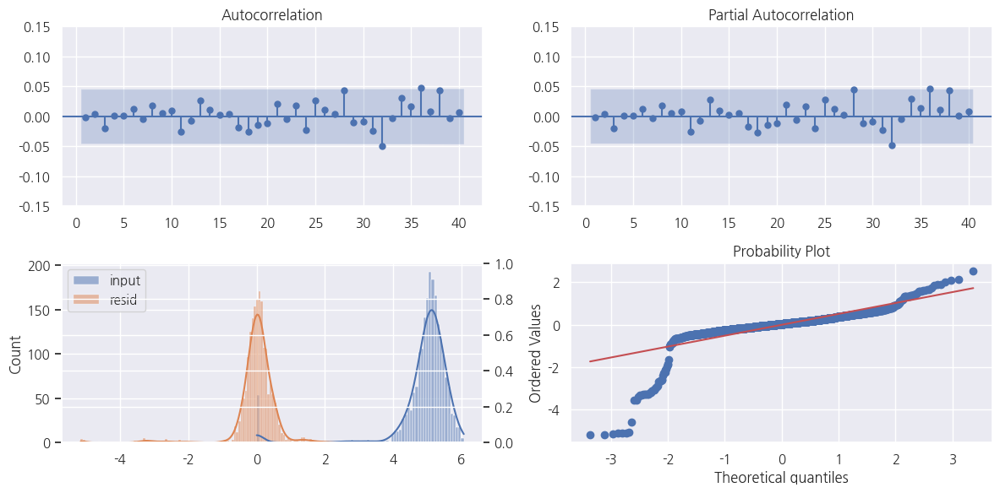

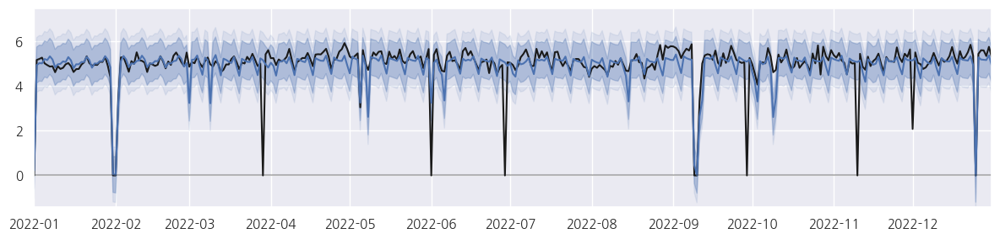

 40%|████      | 6/15 [00:46<01:06,  7.36s/it]

                                     SARIMAX Results                                     
Dep. Variable:                             count   No. Observations:                 1826
Model:             ARIMA(3, 0, 3)x(1, 0, [1], 7)   Log Likelihood               -1885.871
Date:                           Sat, 20 Jan 2024   AIC                           3821.742
Time:                                   13:14:55   BIC                           3959.489
Sample:                               01-01-2018   HQIC                          3872.553
                                    - 12-31-2022                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
mon            4.8437      0.066     73.699      0.000       4.715       4.973
tue            4.6168      0.054     85.628

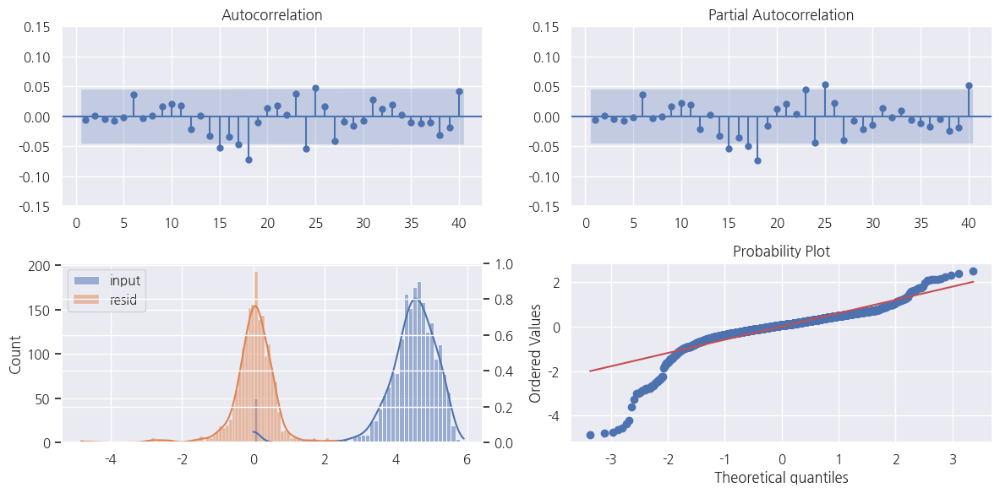

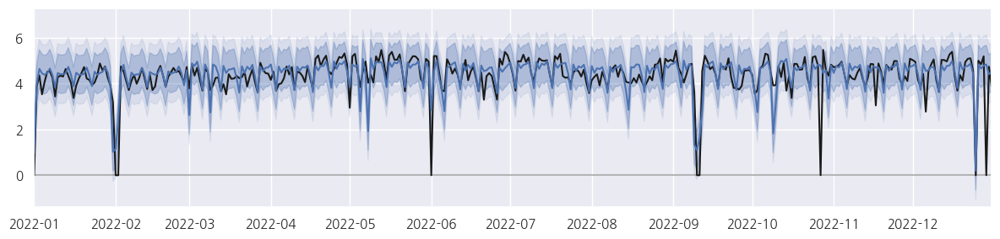

 47%|████▋     | 7/15 [00:53<00:57,  7.15s/it]

                                     SARIMAX Results                                     
Dep. Variable:                             count   No. Observations:                 1826
Model:             ARIMA(3, 0, 3)x(1, 0, [1], 7)   Log Likelihood               -1563.721
Date:                           Sat, 20 Jan 2024   AIC                           3177.442
Time:                                   13:15:02   BIC                           3315.190
Sample:                               01-01-2018   HQIC                          3228.253
                                    - 12-31-2022                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
mon            5.1692      0.056     92.128      0.000       5.059       5.279
tue            5.1631      0.067     76.981

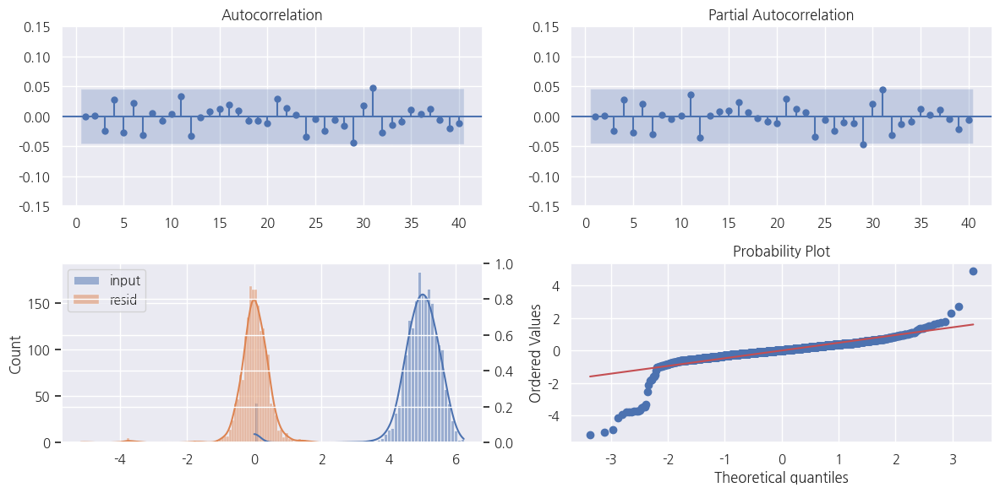

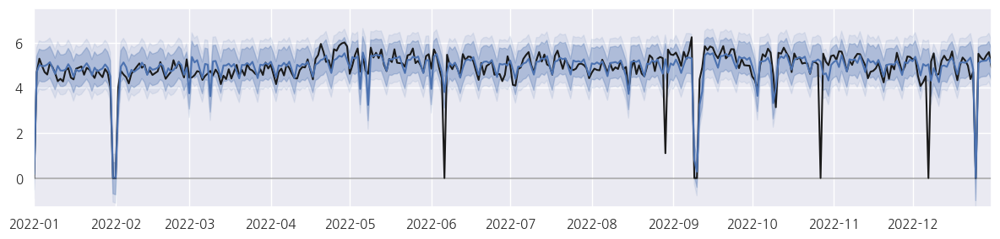

 53%|█████▎    | 8/15 [01:00<00:50,  7.17s/it]

                                     SARIMAX Results                                     
Dep. Variable:                             count   No. Observations:                 1826
Model:             ARIMA(3, 0, 3)x(1, 0, [1], 7)   Log Likelihood               -1456.546
Date:                           Sat, 20 Jan 2024   AIC                           2963.093
Time:                                   13:15:10   BIC                           3100.840
Sample:                               01-01-2018   HQIC                          3013.904
                                    - 12-31-2022                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
mon            5.3433      0.075     71.489      0.000       5.197       5.490
tue            5.2672      0.064     81.786

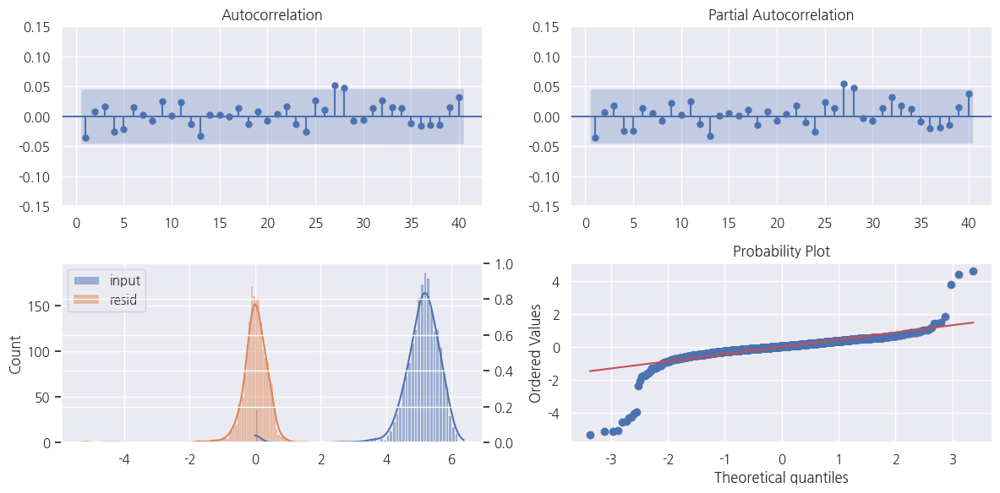

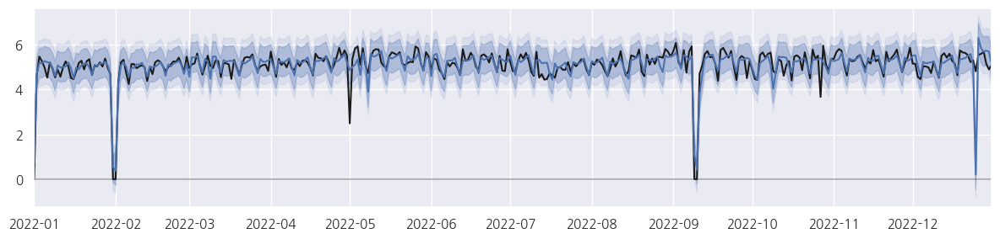

 60%|██████    | 9/15 [01:07<00:43,  7.17s/it]

                                     SARIMAX Results                                     
Dep. Variable:                             count   No. Observations:                 1826
Model:             ARIMA(3, 0, 3)x(1, 0, [1], 7)   Log Likelihood               -1541.637
Date:                           Sat, 20 Jan 2024   AIC                           3133.273
Time:                                   13:15:16   BIC                           3271.020
Sample:                               01-01-2018   HQIC                          3184.084
                                    - 12-31-2022                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
mon            5.4100      0.061     88.724      0.000       5.290       5.529
tue            5.3822      0.064     84.151

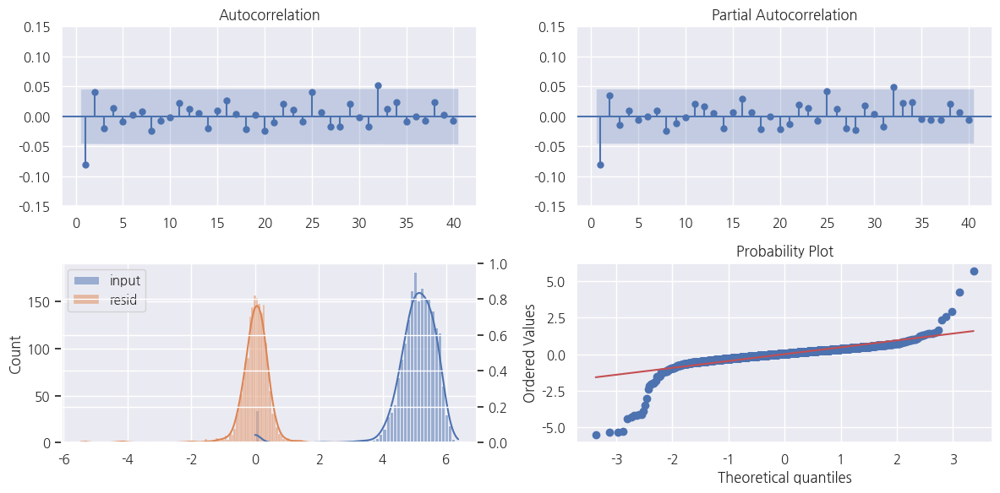

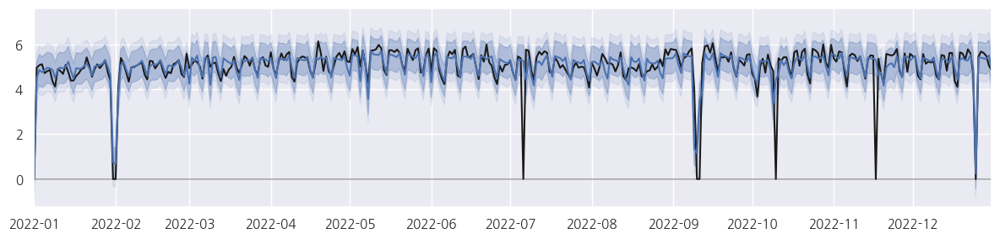

 67%|██████▋   | 10/15 [01:14<00:35,  7.06s/it]

                                     SARIMAX Results                                     
Dep. Variable:                             count   No. Observations:                 1826
Model:             ARIMA(3, 0, 3)x(1, 0, [1], 7)   Log Likelihood               -1274.693
Date:                           Sat, 20 Jan 2024   AIC                           2599.386
Time:                                   13:15:23   BIC                           2737.133
Sample:                               01-01-2018   HQIC                          2650.197
                                    - 12-31-2022                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
mon            4.9628      0.045    109.797      0.000       4.874       5.051
tue            4.9386      0.042    118.570

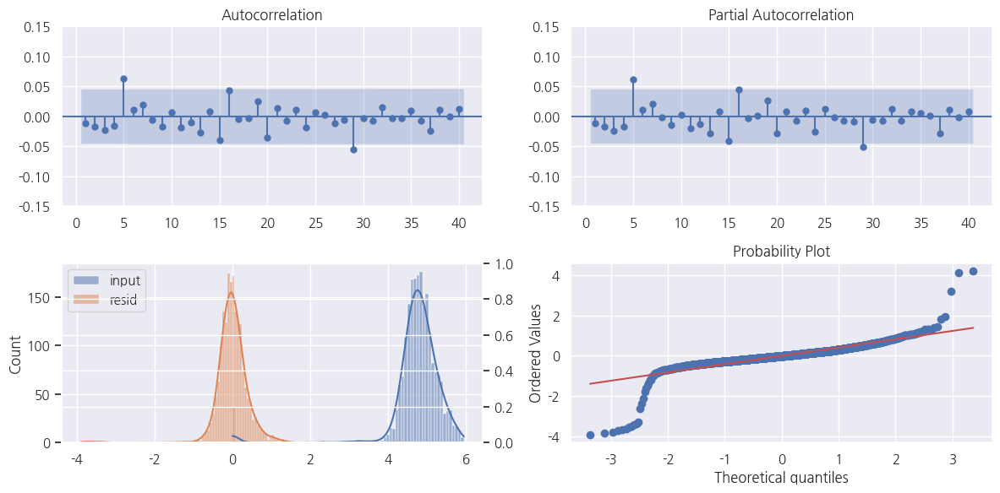

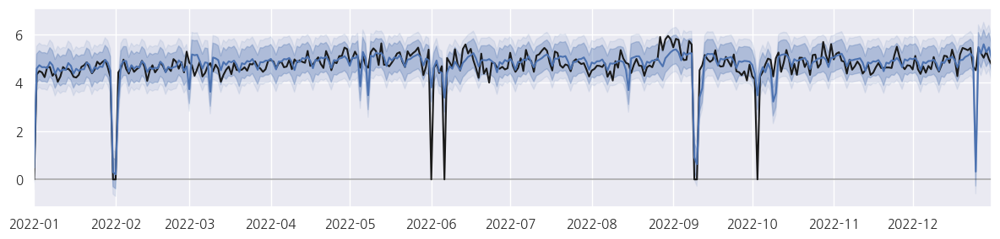

 73%|███████▎  | 11/15 [01:21<00:28,  7.02s/it]

                                     SARIMAX Results                                     
Dep. Variable:                             count   No. Observations:                 1826
Model:             ARIMA(3, 0, 3)x(1, 0, [1], 7)   Log Likelihood               -1351.037
Date:                           Sat, 20 Jan 2024   AIC                           2752.073
Time:                                   13:15:30   BIC                           2889.820
Sample:                               01-01-2018   HQIC                          2802.884
                                    - 12-31-2022                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
mon            5.1716      0.051    100.768      0.000       5.071       5.272
tue            5.1423      0.048    107.588

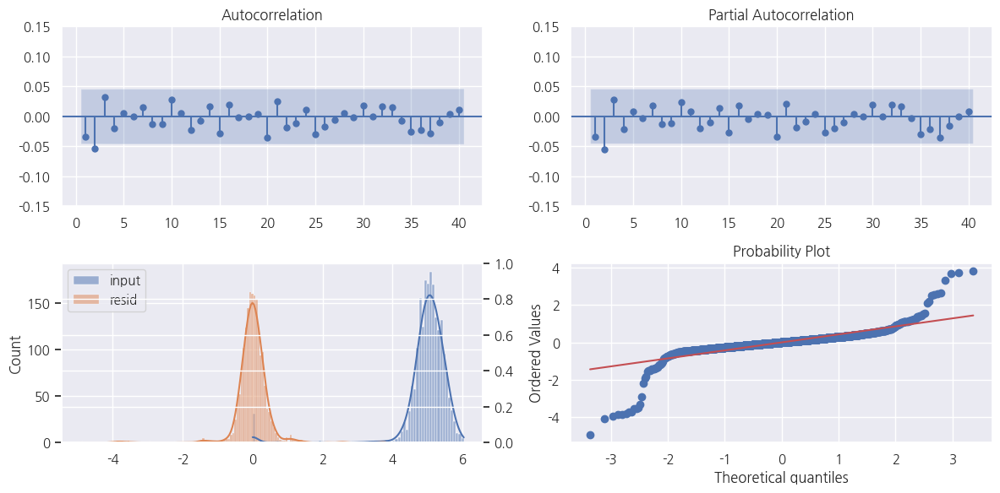

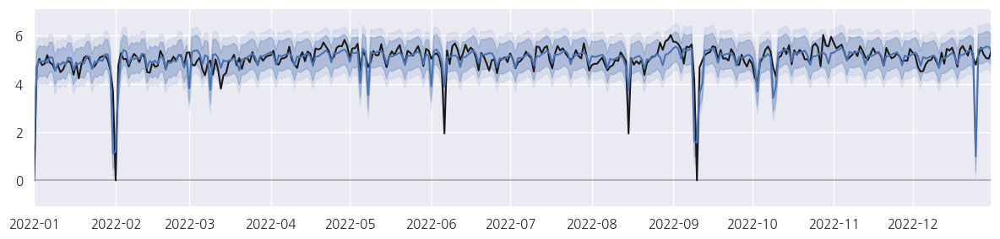

 80%|████████  | 12/15 [01:29<00:21,  7.22s/it]

                                     SARIMAX Results                                     
Dep. Variable:                             count   No. Observations:                 1826
Model:             ARIMA(3, 0, 3)x(1, 0, [1], 7)   Log Likelihood               -1730.133
Date:                           Sat, 20 Jan 2024   AIC                           3510.266
Time:                                   13:15:38   BIC                           3648.013
Sample:                               01-01-2018   HQIC                          3561.077
                                    - 12-31-2022                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
mon            4.4788      0.065     69.282      0.000       4.352       4.606
tue            4.2308      0.058     72.449

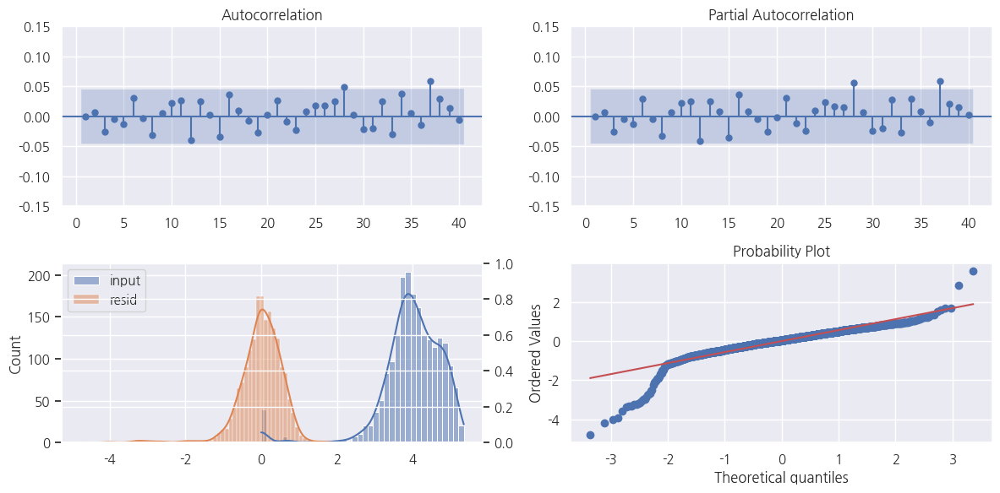

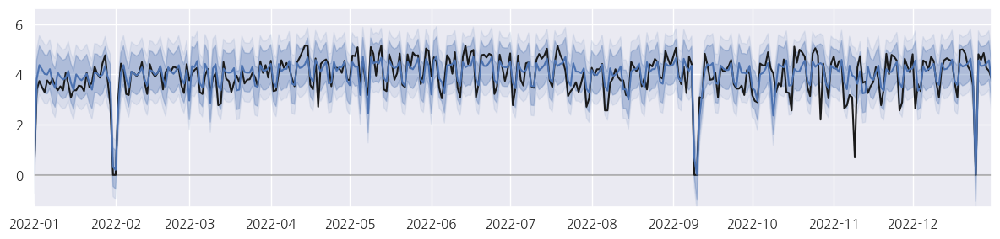

 87%|████████▋ | 13/15 [01:36<00:14,  7.10s/it]D:\OneDrive\local\workspace\blood_donation\venv\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


                                     SARIMAX Results                                     
Dep. Variable:                             count   No. Observations:                 1826
Model:             ARIMA(3, 0, 3)x(1, 0, [1], 7)   Log Likelihood               -1881.183
Date:                           Sat, 20 Jan 2024   AIC                           3812.367
Time:                                   13:15:45   BIC                           3950.114
Sample:                               01-01-2018   HQIC                          3863.178
                                    - 12-31-2022                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
mon            5.1333      0.860      5.967      0.000       3.447       6.819
tue            5.1946      0.866      5.996

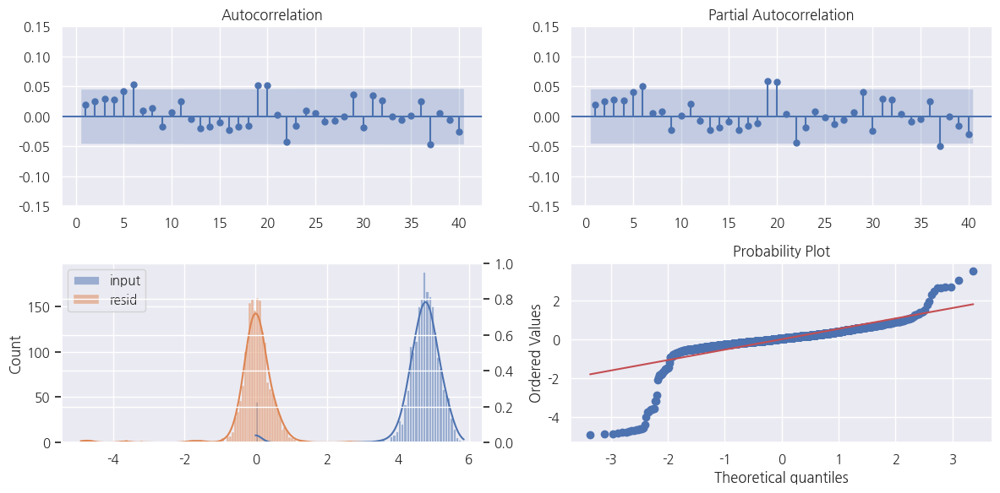

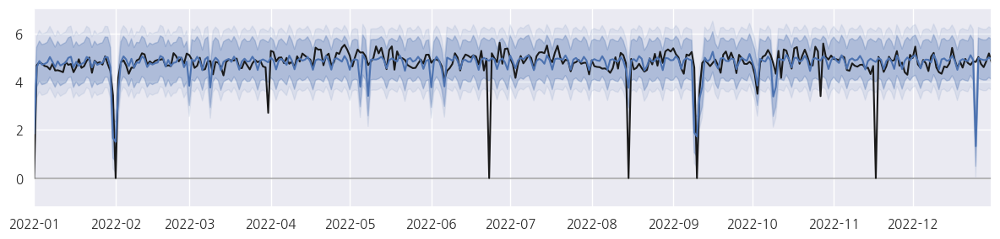

 93%|█████████▎| 14/15 [01:43<00:07,  7.08s/it]

                                     SARIMAX Results                                     
Dep. Variable:                             count   No. Observations:                 1826
Model:             ARIMA(3, 0, 3)x(1, 0, [1], 7)   Log Likelihood               -1694.949
Date:                           Sat, 20 Jan 2024   AIC                           3439.897
Time:                                   13:15:52   BIC                           3577.644
Sample:                               01-01-2018   HQIC                          3490.708
                                    - 12-31-2022                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
mon            4.4954      0.065     68.754      0.000       4.367       4.624
tue            4.4402      0.057     77.251

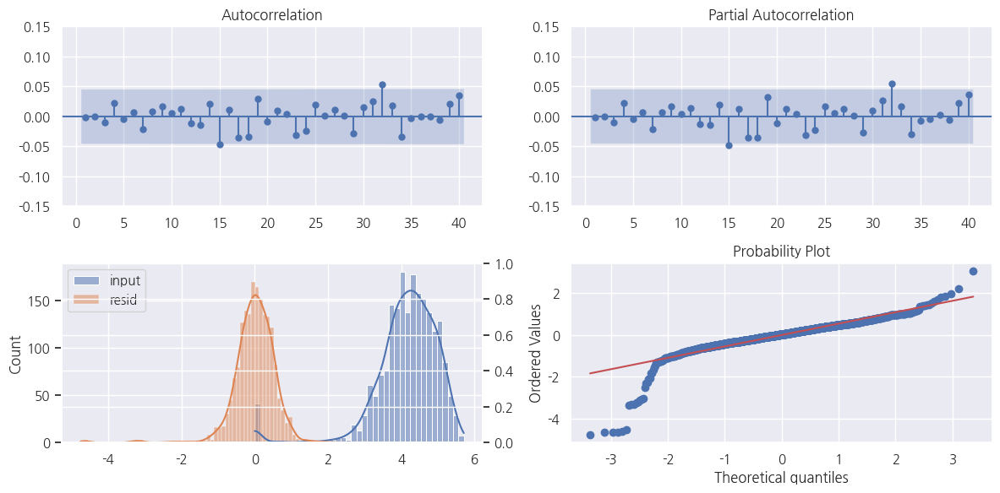

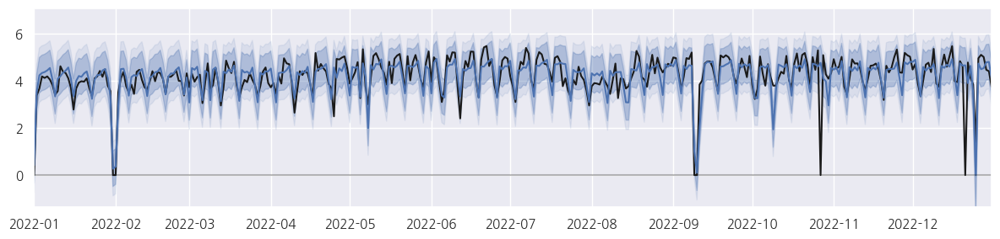

100%|██████████| 15/15 [01:50<00:00,  7.34s/it]


In [180]:
# 지역별 예측치 합쳐서 전체 추정
region_model_fit_dict = {}
region_exog_vars = pd.concat([bd_exog_vars_df, covid_effects_df], axis=1).set_index(complete_date_range)

bd_region_x_train = region_exog_vars[:"2022-12-31"]
bd_region_x_test = region_exog_vars["2023-1-1":]

for region in tqdm(region_list):
    conditions = (daily_bd_df["region"] == region) & (daily_bd_df["method"] == "전혈 320ml")
    bd_region = daily_bd_df[conditions].groupby(by="date")["count"].sum().reindex(complete_date_range).fillna(
        0).replace(0, 1).apply(np.log)

    bd_region_y_train = bd_region[:"2022-12-31"]
    bd_region_y_test = bd_region["2023-1-1":]

    arima_model_fit = arima_model(bd_region_y_train, bd_region_y_test, bd_region_x_train, bd_region_x_test,
                                  summary=True, plot=True, test_stats=True, arima_order=(3, 0, 3), target_year=2022)
    region_model_fit_dict[region] = arima_model_fit

In [182]:
conditions = (daily_bd_df["method"] == "전혈 320ml")
daily_bd_df[conditions].groupby(by="date")["count"].sum().reindex(complete_date_range).fillna(0)

2018-01-01     173.0
2018-01-02    2124.0
2018-01-03    1923.0
2018-01-04    1683.0
2018-01-05    1620.0
               ...  
2023-07-27    2210.0
2023-07-28    2432.0
2023-07-29    1786.0
2023-07-30    1150.0
2023-07-31    2387.0
Freq: D, Name: count, Length: 2038, dtype: float64

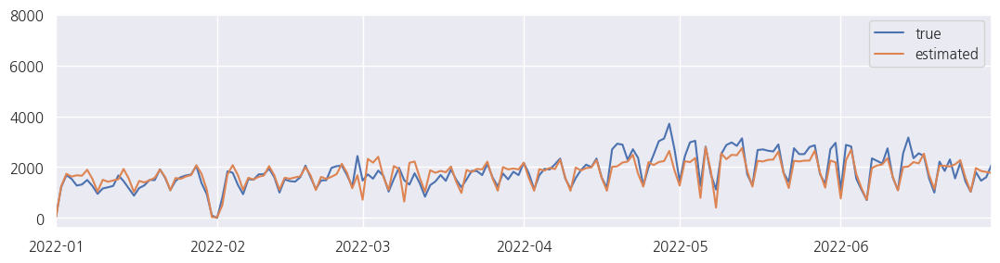

In [189]:
_, ax = plt.subplots(1, 1, figsize=(13, 3))
target_year = 2022

conditions = (daily_bd_df["method"] == "전혈 320ml")
bd_region = daily_bd_df[conditions].groupby(by="date")["count"].sum().reindex(complete_date_range).fillna(0)
ax.plot(bd_region, label="true")

bd_total = np.sum(
    [pd.concat([model.predict(), model.forecast(exog=bd_region_x_test, steps=len(bd_region_x_test))]).apply(np.exp)
     for region, model in region_model_fit_dict.items()], axis=0)
bd_total = pd.Series(bd_total, index=region_exog_vars.index)
ax.plot(bd_total, label="estimated")
if target_year:
    ax.set_xlim([date(target_year, 1, 1), date(target_year, 6, 30)])

ax.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


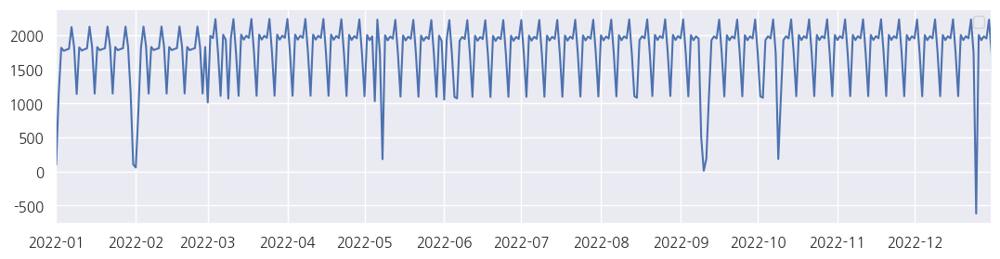

In [149]:
_, ax = plt.subplots(1, 1, figsize=(13, 3))
target_year = 2022
bd_total = np.sum([region_model_fit_dict[region].predict() for region in region_list], axis=0)
bd_total = pd.Series(bd_total, index=bd_region.index)
ax.plot(bd_total)
if target_year:
    ax.set_xlim([date(target_year, 1, 1), date(target_year, 12, 31)])

# ARIMA with gender

In [ ]:
# 남녀통합

y_train = bd_group[:"2022-12-31"]
y_test = bd_group["2023-1-1":]
exog_vars = np.concatenate([dow_oh, holiday, missing_dates], axis=1)
X_train = exog_vars[:len(y_train)]
X_test = exog_vars[len(y_train):]

arima_model(y_train, y_test, X_train, X_test, True)

In [ ]:
bd_gender_group = daily_bd_df.groupby(by=["date", "region", "gender", "method"])["count"].sum() \
    .xs("서울동부", level="region").xs("전혈 400ml", level="method").reset_index() \
    .pivot(index="date", columns="gender", values="count").reindex(complete_date_range).fillna(0)

y_train = bd_gender_group[:"2022-12-31"]
y_test = bd_gender_group["2023-1-1":]
exog_vars = np.concatenate([dow_oh, holiday, missing_dates], axis=1)
X_train = exog_vars[:len(y_train)]
X_test = exog_vars[len(y_train):]

# Male
arima_model(y_train["남"], y_test["남"], X_train, X_test, True)

# Female
arima_model(y_train["여"], y_test["여"], X_train, X_test, True)

plt.show()
# Female은 거의 없고 random event 같은 성격이라 예측 실패.

In [ ]:
# # Added data vs separated data
# plt.plot(y_train.index, y_train.sum(axis=1), color="k")
# plt.plot(y_test.index, y_test.sum(axis=1), color="k")
# plt.axvline(x=y_test.index[0], color="r")
#
# plt.plot(y_train.index, (y_train_male_predict + y_train_female_predict), alpha=0.8, color="C0")
# plt.plot(y_test.index, (y_test_male_predict + y_test_female_predict), alpha=0.8, color="C0")
# rmse = sm.tools.eval_measures.rmse(y_test.sum(axis=1), (y_test_male_predict + y_test_female_predict))
# print(f"sep RMSE: {rmse}")
#
# plt.plot(y_train.index, y_train_added_predict, alpha=0.8, color="C1")
# plt.plot(y_test.index, y_test_added_predict, alpha=0.8, color="C1")
# rmse = sm.tools.eval_measures.rmse(y_test.sum(axis=1), y_test_added_predict)
# print(f"added RMSE: {rmse}")
#
# # plt.xlim([date(2018, 1, 1), date(2018, 3, 31)])
# plt.xlim([date(2022, 10, 1), date(2023, 7, 30)])
# plt.show()

# ARIMA with box-cox transformation

In [ ]:
# 전혈 320ml
bd_gender_group = daily_bd_df.groupby(by=["date", "region", "gender", "method"])["count"].sum() \
    .xs("서울동부", level="region").xs("전혈 320ml", level="method").reset_index() \
    .pivot(index="date", columns="gender", values="count").reindex(complete_date_range).fillna(0)

bd_gender_group_boxcox = bd_gender_group.copy()
transformed, male_lambda = stats.boxcox(bd_gender_group["남"] + 0.01)
bd_gender_group_boxcox["남"] = transformed

transformed, female_lambda = stats.boxcox(bd_gender_group["여"] + 0.01)
bd_gender_group_boxcox["여"] = transformed

draw_acf_pacf({"전혈 320ml 통합 1st diff": bd_gender_group.sum(axis=1).diff()[1:],
               "전혈 320ml 남 1st diff": bd_gender_group["남"].diff()[1:],
               "전혈 320ml 여 1st diff": bd_gender_group["여"].diff()[1:], })

# 남자 데이터에서 이분산성 보임. 2020 ~ 2022 코로나 효과?

In [ ]:
print(male_lambda, female_lambda)
_, axs = plt.subplots(2, 2, figsize=(12, 6))

axs[0, 0].hist(bd_gender_group["남"].values, bins=30)
axs[0, 0].set_title("전혈 320ml 남")
axs[0, 1].hist(bd_gender_group_boxcox["남"].values, bins=30)
axs[0, 1].set_title("전혈 320ml 남 Box-Cox")

axs[1, 0].hist(bd_gender_group["남"].diff().values, bins=30)
axs[1, 0].set_title("전혈 320ml 남 1st diff")
axs[1, 1].hist(bd_gender_group_boxcox["남"].diff().values, bins=30)
axs[1, 1].set_title("전혈 320ml 남 Box-Cox 1st diff")

plt.tight_layout()
plt.show()

In [ ]:
_, ax = plt.subplots(1, 1, figsize=(12, 3))
ax.plot(bd_gender_group["남"], color="k", label="true")
ax.axvline(x=y_test.index[0], color="r")

fourier_terms = make_fourier_terms(len(bd_gender_group_boxcox), 365.25, 2)
exog_vars = np.concatenate([dow_oh, holiday, missing_dates, fourier_terms], axis=1)
X_train = exog_vars[:len(y_train)]
X_test = exog_vars[len(y_train):]
inv_boxcox = scipy.special.inv_boxcox

# Box-Cox
y_train = bd_gender_group_boxcox[:"2022-12-31"]
y_test = bd_gender_group_boxcox["2023-1-1":]

model = ARIMA(y_train["남"].to_period("D"), order=(1, 1, 3), seasonal_order=(1, 0, 1, 7), trend="n", exog=X_train)
model.initialize_approximate_diffuse()
model_fit = model.fit()

y_train_male_predict = inv_boxcox(model_fit.predict().clip(lower=0), male_lambda)
y_test_male_predict = inv_boxcox(model_fit.forecast(steps=len(y_test["남"]), exog=X_test).clip(lower=0), male_lambda)

traim_rmse = sm.tools.eval_measures.rmse(inv_boxcox(y_train["남"], male_lambda), y_train_male_predict)
test_rmse = sm.tools.eval_measures.rmse(inv_boxcox(y_test["남"], male_lambda), y_test_male_predict)
print(f"RMSE: {traim_rmse}, {test_rmse}")

ax.plot(y_train.index, y_train_male_predict, alpha=0.8, color="C0", label="boxcox-estimated")
ax.plot(y_test.index, y_test_male_predict, alpha=0.8, color="C0")

# Natural
y_train = bd_gender_group[:"2022-12-31"]
y_test = bd_gender_group["2023-1-1":]

model = ARIMA(y_train["남"].to_period("D"), order=(1, 1, 3), seasonal_order=(1, 0, 1, 7), trend="n", exog=X_train)
model.initialize_approximate_diffuse()
model_fit = model.fit()

y_train_male_predict = model_fit.predict().clip(lower=0)
y_test_male_predict = model_fit.forecast(steps=len(y_test["남"]), exog=X_test).clip(lower=0)

traim_rmse = sm.tools.eval_measures.rmse(y_train["남"], y_train_male_predict)
test_rmse = sm.tools.eval_measures.rmse(y_test["남"], y_test_male_predict)
print(f"RMSE: {traim_rmse}, {test_rmse}")

ax.plot(y_train.index, y_train_male_predict, alpha=0.8, color="C1", label="default_estimated")
ax.plot(y_test.index, y_test_male_predict, alpha=0.8, color="C1")

ax.set_xlim([date(2022, 10, 1), date(2023, 3, 31)])
ax.set_ylim([0, 300])

ax.legend()
plt.show()

# ARIMA with Yearly Seasonality

In [ ]:
y_train = bd_gender_group[:"2022-12-31"]
y_test = bd_gender_group["2023-1-1":]
fourier_terms = make_fourier_terms(len(bd_gender_group), 365.25, 2)
exog_vars = np.concatenate([dow_oh, holiday, missing_dates, fourier_terms], axis=1)
X_train = exog_vars[:   len(y_train)]
X_test = exog_vars[len(y_train):]

# Added
arima_model(y_train.sum(axis=1), y_test.sum(axis=1), X_train, X_test, summary=True)

# Male
arima_model(y_train["남"], y_test["남"], X_train, X_test)

# # Female
arima_model(y_train["여"], y_test["여"], X_train, X_test)

plt.show()

In [ ]:
# # Added data vs separated data
# plt.plot(bd_gender_group.sum(axis=1), color="k")
# plt.axvline(x=y_test.index[0], color="r")
#
# plt.plot(y_train.index, y_train_male_predict + y_train_female_predict, alpha=0.8, color="C0")
# plt.plot(y_test.index, (y_test_male_predict + y_test_female_predict), alpha=0.8, color="C0")
# rmse = sm.tools.eval_measures.rmse(y_test.sum(axis=1), (y_test_male_predict + y_test_female_predict))
# print(f"sep RMSE: {rmse}")
#
# plt.plot(y_train.index, y_train_added_predict, alpha=0.8, color="C1")
# plt.plot(y_test.index, y_test_added_predict, alpha=0.8, color="C1")
# rmse = sm.tools.eval_measures.rmse(y_test.sum(axis=1), y_test_added_predict)
# print(f"added RMSE: {rmse}")
#
# # plt.xlim([date(2018, 1, 1), date(2018, 3, 31)])
# # plt.xlim([date(2022, 10, 1), date(2023, 7, 31)])
# plt.show()

In [ ]:
# 전체 모델 vs 지역별 모델합 / 지역간 게수비교
bd_region_group = daily_bd_df[daily_bd_df["method"] == "전혈 400ml"].groupby(by=["date", "region"])[
    "count"].sum().unstack().reindex(complete_date_range).fillna(0)

In [ ]:
draw_acf_pacf({"전혈 400ml 지역 통합": bd_region_group.sum(axis=1).diff()[1:]})

# ARIMA for the whole country

In [ ]:
y_train = bd_region_group.sum(axis=1)[:"2022-12-31"]
y_test = bd_region_group.sum(axis=1)["2023-1-1":]
fourier_terms = make_fourier_terms(len(bd_gender_group), 365.25, 2)
exog_vars = np.concatenate([dow_oh, holiday, missing_dates, fourier_terms], axis=1)
X_train = exog_vars[:len(y_train)]
X_test = exog_vars[len(y_train):]

model_fit = arima_model(y_train, y_test, X_train, X_test, False, False, False)

In [ ]:
_, ax = plt.subplots(1, 1, figsize=(12, 3))
ax.plot(y_train, c="k")
ax.plot(y_test, c="k")

prediction = model_fit.get_prediction()
predicted_mean = prediction.predicted_mean.clip(lower=0)
ax.plot(predicted_mean, alpha=0.8)

test_prediction = model_fit.get_forecast(steps=len(y_test), exog=X_test)
test_predicted_mean = test_prediction.predicted_mean.clip(lower=0)
ax.plot(test_predicted_mean, alpha=0.8)

# ax.set_xlim([date(2018, 1, 1), date(2019, 1, 1)])
plt.xlim([date(2022, 10, 1), date(2023, 7, 31)])
# print(model_fit.summary())

# Compare each region

In [ ]:
fourier_terms = make_fourier_terms(len(bd_gender_group), 365.25, 2)
exog_vars = np.concatenate([dow_oh, holiday, missing_dates, fourier_terms], axis=1)
X_train = exog_vars[:len(y_train)]
X_test = exog_vars[len(y_train):]

coef_list = []
pvalues_list = []
for region_name in tqdm(bd_region_group.columns):
    y_train = bd_region_group[region_name][:"2022-12-31"]
    y_test = bd_region_group[region_name]["2023-1-1":]

    model_fit = arima_model(y_train, y_test, X_train, X_test, False, False, False)
    coef_list.append(model_fit.params.rename(region_name))
    pvalues_list.append(model_fit.pvalues.rename(region_name))

In [ ]:
# x1: constant
# x2~x7: day of week
# x8: national holidays
# x9: missing dates
# x10~x13: fourier terms (yearly seasonality)
_, axs = plt.subplots(1, 2, figsize=(12, 6))
sns.heatmap(pd.concat(coef_list, axis=1)[:-1], annot=True, fmt=".2f", annot_kws={"fontsize": 8}, cbar=False,
            cmap="vlag", ax=axs[0])
axs[0].set_title("coefficients")
# 계수 지역 인구 배수로 나옴?
sns.heatmap(pd.concat(pvalues_list, axis=1)[:-1], annot=True, fmt=".2f", annot_kws={"fontsize": 8}, cbar=False,
            cmap="vlag", ax=axs[1])
axs[1].set_title("p-values")
plt.show()

In [ ]:
_, ax = plt.subplots(1, 1, figsize=(6, 5))
sns.heatmap(pd.concat(coef_list, axis=1)[13:-1], annot=True, fmt=".2f", annot_kws={"fontsize": 8}, cbar=False,
            cmap="vlag", ax=ax)

# Test for Fourier terms

r^2: 0.27327768086748694


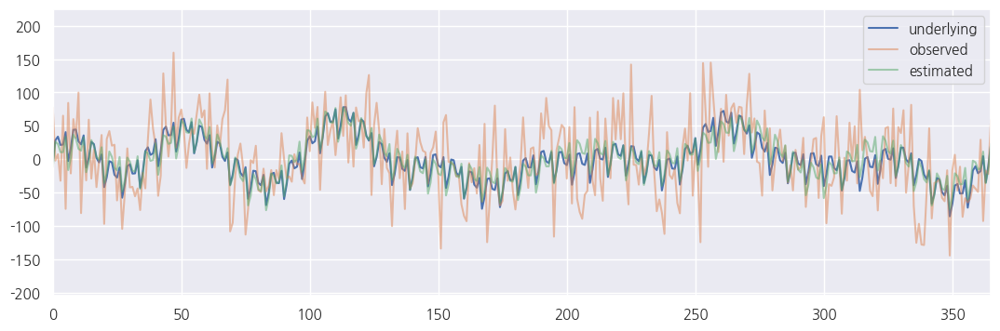

In [326]:
# Fourier terms test
np.random.seed(1)
_, ax = plt.subplots(1, 1, figsize=(13, 4))

n_of_fourier_terms = 10
# make dummy data
f_terms = np.concatenate(
    [make_fourier_terms(len(resid), 7, n_of_fourier_terms), make_fourier_terms(len(resid), 365.25, n_of_fourier_terms)],
    axis=1)

n_noise_list = np.random.normal(0, 50, len(resid))
w_list = np.random.normal(0, 10, n_of_fourier_terms * 2 * 2)
dummy_data = sum([f_terms[:, i] * w_list[i] for i in range(0, n_of_fourier_terms * 2 * 2)])
ax.plot(dummy_data, label="underlying")
dummy_data += n_noise_list
ax.plot(dummy_data, alpha=0.5, label="observed")

fourier_terms = np.concatenate([make_fourier_terms(len(resid), 365.25, 8), make_fourier_terms(len(resid), 7, 3)],
                               axis=1)
fourier_model_fit = sm.OLS(dummy_data, fourier_terms).fit()
print(f"r^2: {fourier_model_fit.rsquared}")
y_predict = fourier_model_fit.predict(fourier_terms)
ax.plot(y_predict, label="estimated", alpha=0.5)
ax.legend()
ax.set_xlim([0, 365])

plt.show()

In [ ]:
# 잔차 ARIMA fitting.
# model = ARIMA(y_train.to_period("D"), order=(1, 1, 3), seasonal_order=(1, 0, 1, 7), trend="t", exog=X_train)
# model.initialize_approximate_diffuse()
# model_fit = model.fit()